In [1]:
import pandas as pd
import os
from sys import platform
import matplotlib.pyplot as plt
import datetime
import numpy as np
import pickle
import seaborn
from minepy import MINE
%config InlineBackend.figure_format = 'retina'

# 1. Load the raw data

In [2]:
dir_raw_data = '.\CHF 208 Vars CLEANED with DATES.csv'

In [3]:
raw_data_df = pd.read_csv(dir_raw_data)

C:\Users\Yunge Li\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3057: DtypeWarning: Columns (4,6,231,232,233,234) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [4]:
raw_data_df.head(n = 10)

,Serial,Patient,gender,age,Height,Weight,BMI,Smoking,any_PCI,any_MI,...,hf_hosp_date4,hf_hosp_date5,hf_hosp_date_last,ECHO1_exam_date,ECHOlast_exam_date,birth_date.1,gender.1,verify birth + age <=2017,verify gender,Unnamed: 242
0,1,#LB3G2SJCI,1,74.680356,170,95.0,32.87197232,1,0,0,...,NaN,NaN,06/09/2010,06/09/2010,07/11/2010,01/01/1936,1,18/08/2010,1,NaN
1,2,#LIVDYNBWG,2,88.522930,167,75.0,26.89232314,2,0,0,...,NaN,NaN,01/01/2017,13/04/2009,05/01/2017,24/06/1928,2,09/12/2016,1,NaN
2,3,#NR4GMP32G,2,91.581109,175,85.0,27.75510204,2,0,1,...,NaN,NaN,20/03/2016,NaN,NaN,20/08/1924,2,26/02/2016,1,NaN
3,4,#GNMHGY3ZK,1,74.028747,176,80.0,25.82644628,1,1,1,...,NaN,NaN,25/12/2016,06/07/2005,06/07/2005,15/12/1942,1,06/12/2016,1,NaN
4,5,#KVMFOORUI,1,78.921287,170,85.0,29.41176471,2,0,0,...,NaN,NaN,18/10/2015,19/10/2015,19/10/2015,15/11/1936,1,28/09/2015,1,NaN
5,6,#PRYXUPLKL,1,76.440794,172,100.0,33.80205516,2,1,1,...,NaN,NaN,02/03/2011,15/02/2011,15/02/2011,22/09/1934,1,10/02/2011,1,NaN
6,7,#MJBXCKL5H,1,81.883641,170,67.0,23.183391,2,1,0,...,NaN,NaN,20/11/2011,NaN,NaN,01/01/1930,1,30/10/2011,1,NaN
7,8,#KYRVGNCDH,2,81.656400,160,68.0,26.5625,2,0,0,...,NaN,NaN,29/08/2011,29/08/2011,29/08/2011,01/01/1930,2,08/08/2011,1,NaN
8,9,#MFJSCICZP,2,73.251198,150,43.0,19.11111111,2,0,1,...,NaN,NaN,02/04/2009,NaN,NaN,01/01/1936,2,14/03/2009,1,NaN
9,10,#MMRGA2LQJ,1,92.336756,160,70.0,27.34375,2,0,0,...,NaN,NaN,15/05/2011,NaN,NaN,12/01/1919,1,21/04/2011,1,NaN


# 2. Data Ingestion

## 2.1 Data Missing (Space & NaN)

In [5]:
data_df = raw_data_df.replace(' ',np.NaN)

In [6]:
data_df

,Serial,Patient,gender,age,Height,Weight,BMI,Smoking,any_PCI,any_MI,...,hf_hosp_date4,hf_hosp_date5,hf_hosp_date_last,ECHO1_exam_date,ECHOlast_exam_date,birth_date.1,gender.1,verify birth + age <=2017,verify gender,Unnamed: 242
0,1,#LB3G2SJCI,1,74.680356,170,95.0,32.87197232,1,0,0,...,NaN,NaN,06/09/2010,06/09/2010,07/11/2010,01/01/1936,1,18/08/2010,1,NaN
1,2,#LIVDYNBWG,2,88.522930,167,75.0,26.89232314,2,0,0,...,NaN,NaN,01/01/2017,13/04/2009,05/01/2017,24/06/1928,2,09/12/2016,1,NaN
2,3,#NR4GMP32G,2,91.581109,175,85.0,27.75510204,2,0,1,...,NaN,NaN,20/03/2016,NaN,NaN,20/08/1924,2,26/02/2016,1,NaN
3,4,#GNMHGY3ZK,1,74.028747,176,80.0,25.82644628,1,1,1,...,NaN,NaN,25/12/2016,06/07/2005,06/07/2005,15/12/1942,1,06/12/2016,1,NaN
4,5,#KVMFOORUI,1,78.921287,170,85.0,29.41176471,2,0,0,...,NaN,NaN,18/10/2015,19/10/2015,19/10/2015,15/11/1936,1,28/09/2015,1,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10758,10759,#LQTE6WJRH,1,64.898015,163,77.0,28.9811,2,1,1,...,28/08/2016,02/03/2017,01/04/2017,04/11/2015,21/09/2016,01/01/1951,1,08/11/2015,1,NaN
10759,10760,#PJGCWIKTJ,2,81.771389,155,70.0,29.1363,2,1,1,...,07/04/2016,12/08/2016,09/01/2017,26/01/2016,10/01/2017,18/04/1934,2,04/01/2016,1,NaN
10760,10761,#OZCGI3R6F,1,92.465435,180,90.0,27.7778,2,0,1,...,02/03/2017,13/08/2017,13/08/2017,23/05/2016,12/07/2016,01/12/1923,1,25/04/2016,1,NaN
10761,10762,#ENLV66DBF,1,57.180014,175,75.0,24.4898,1,0,1,...,29/12/2016,21/02/2017,06/08/2017,01/08/2016,01/08/2016,26/05/1959,1,15/07/2016,1,NaN


In [7]:
data_df.shape

(10763, 243)

In [8]:
nan_count=data_df.isnull().sum(axis = 0)
nan_count.sort_values(ascending=False)

Unnamed: 242                      10763
hf_hosp_date5                     10068
CHF30_4                           10068
DIED30_5                          10068
DIED30_4                           9685
                                  ...  
ECHOlast_mv_peak_a_wave               0
ECHOlast_mv_ea_ratio                  0
ECHOlast_mv_dec_time                  0
ECHOlast_lv_systolic_dimension        0
Serial                                0
Length: 243, dtype: int64

In [9]:
data_df = data_df.drop('Unnamed: 242',axis = 1)

In [10]:
data_df.shape

(10763, 242)

In [11]:
data_df

,Serial,Patient,gender,age,Height,Weight,BMI,Smoking,any_PCI,any_MI,...,hf_hosp_date3,hf_hosp_date4,hf_hosp_date5,hf_hosp_date_last,ECHO1_exam_date,ECHOlast_exam_date,birth_date.1,gender.1,verify birth + age <=2017,verify gender
0,1,#LB3G2SJCI,1,74.680356,170,95.0,32.87197232,1,0,0,...,NaN,NaN,NaN,06/09/2010,06/09/2010,07/11/2010,01/01/1936,1,18/08/2010,1
1,2,#LIVDYNBWG,2,88.522930,167,75.0,26.89232314,2,0,0,...,NaN,NaN,NaN,01/01/2017,13/04/2009,05/01/2017,24/06/1928,2,09/12/2016,1
2,3,#NR4GMP32G,2,91.581109,175,85.0,27.75510204,2,0,1,...,NaN,NaN,NaN,20/03/2016,NaN,NaN,20/08/1924,2,26/02/2016,1
3,4,#GNMHGY3ZK,1,74.028747,176,80.0,25.82644628,1,1,1,...,NaN,NaN,NaN,25/12/2016,06/07/2005,06/07/2005,15/12/1942,1,06/12/2016,1
4,5,#KVMFOORUI,1,78.921287,170,85.0,29.41176471,2,0,0,...,NaN,NaN,NaN,18/10/2015,19/10/2015,19/10/2015,15/11/1936,1,28/09/2015,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10758,10759,#LQTE6WJRH,1,64.898015,163,77.0,28.9811,2,1,1,...,26/05/2016,28/08/2016,02/03/2017,01/04/2017,04/11/2015,21/09/2016,01/01/1951,1,08/11/2015,1
10759,10760,#PJGCWIKTJ,2,81.771389,155,70.0,29.1363,2,1,1,...,21/03/2016,07/04/2016,12/08/2016,09/01/2017,26/01/2016,10/01/2017,18/04/1934,2,04/01/2016,1
10760,10761,#OZCGI3R6F,1,92.465435,180,90.0,27.7778,2,0,1,...,24/02/2017,02/03/2017,13/08/2017,13/08/2017,23/05/2016,12/07/2016,01/12/1923,1,25/04/2016,1
10761,10762,#ENLV66DBF,1,57.180014,175,75.0,24.4898,1,0,1,...,29/11/2016,29/12/2016,21/02/2017,06/08/2017,01/08/2016,01/08/2016,26/05/1959,1,15/07/2016,1


## 2.2 Data Duplication

In [12]:
#Check data duplication on patient_id('Patient')
if len(data_df)==len(data_df['Patient'].unique()):
    print('No Patient Duplication')

No Patient Duplication


## 2.3 Data Missing

We notice that the data type for 'Height' and 'BMI' are not float, but object instead. Also, there are two missing data on these two features as well.

First, transform them to float.

In [13]:
data_df[['Height','BMI']] = pd.DataFrame(data_df[['Height','BMI']],dtype = np.float)

Second, use the mean values of these two features to impute the missing data.

In [14]:
mean_values = list(data_df[['Height','BMI']].mean())
mean_values

[165.0551993309172, 30.54983946226807]

In [15]:
data_df['Height']=data_df['Height'].replace(np.NaN,mean_values[0])
data_df['BMI']=data_df['BMI'].replace(np.NaN,mean_values[1])

# 2. Descriptive Analysis

## 2.1 Descriptive Analysis for Continuous Data

In [16]:
data_df.describe()

,Serial,gender,age,Height,Weight,BMI,Smoking,any_PCI,any_MI,any_IHD,...,last.Uric.acid,last.WBC,last.GFR_MDRD,NumberOfVisits,ReadmissionFirst,ReadmissionEver,NumberOfReadmissions,is_dead,gender.1,verify gender
count,10763.000000,10763.000000,10763.000000,10763.000000,10763.000000,10763.000000,10763.000000,10763.000000,10763.000000,10763.000000,...,10763.000000,10763.000000,10763.000000,10763.000000,10763.000000,10763.000000,10763.000000,10763.000000,10763.000000,10763.0
mean,5382.000000,1.459259,76.983088,165.055199,77.609284,30.549839,1.899099,0.187773,0.300845,0.587011,...,8.269561,10.290447,49.061925,1.713927,0.095327,0.152467,0.198922,0.564991,1.459259,1.0
std,3107.154808,0.498361,12.516532,23.174069,19.064604,82.368196,0.312120,0.390549,0.458647,0.492394,...,3.180817,5.577123,30.093129,1.160194,0.293679,0.359489,0.523301,0.495781,0.498361,0.0
min,1.000000,1.000000,16.761123,6.000000,5.000000,0.259211,1.000000,0.000000,0.000000,0.000000,...,0.700000,0.090000,3.079348,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.0
25%,2691.500000,1.000000,69.531828,160.000000,65.000000,24.167162,2.000000,0.000000,0.000000,0.000000,...,6.000000,6.915000,26.121325,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.0
50%,5382.000000,1.000000,79.288159,165.000000,75.000000,27.343750,2.000000,0.000000,0.000000,1.000000,...,7.900000,9.010000,44.712539,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.0
75%,8072.500000,2.000000,86.027379,172.000000,87.000000,31.499695,2.000000,0.000000,1.000000,1.000000,...,10.100000,12.010000,66.300882,2.000000,0.000000,0.000000,0.000000,1.000000,2.000000,1.0
max,10763.000000,2.000000,109.158111,1701.000000,250.000000,7000.000000,3.000000,1.000000,1.000000,1.000000,...,22.900000,48.860000,249.296104,5.000000,1.000000,1.000000,4.000000,1.000000,2.000000,1.0


## 2.2 Descriptive Analysis for Discrete Data

In [137]:
data_df.describe(include=['O'])

,Patient,ACE_inhib,ALDOSTERONE.ANTAGONISTS,ALPHA.ADRENERGIC.BLOCKING.AGENTS,ALPHA.AND.BETA.BLOCKING.AGENTS,ANGIOTENSIN.II.ANTAGONISTS,ANTIARRHYTHMICS..CLASS.IC,ANTICHOLINERGICS,BENZODIAZEPINE.DERIVATIVES,BETA.BLOCKING.AGENTS,...,hf_hosp_date1,hf_hosp_date2,hf_hosp_date3,hf_hosp_date4,hf_hosp_date5,hf_hosp_date_last,ECHO1_exam_date,ECHOlast_exam_date,birth_date.1,verify birth + age <=2017
count,10763,10763,10763,10763,10763,10763,10763,10763,10763,10763,...,10763,4008,1903,1078,695,10763,8452,8452,10763,10763
unique,10763,2,2,2,2,2,2,2,2,2,...,3081,2201,1349,881,606,3034,2817,2562,6094,3114
top,#LITWW2SHO,Yes,No,No,No,No,No,No,Yes,No,...,06/04/2015,29/01/2016,22/12/2015,28/04/2013,24/03/2013,13/02/2017,24/11/2015,14/12/2016,01/01/1934,14/02/2009
freq,1,6193,6500,8250,9302,7650,10303,6382,5584,10565,...,14,8,7,4,3,16,10,17,154,12


## 2.3 Variable Classification

In [16]:
import re
date_features = []
for var in data_df.columns.values.tolist():
    date_feature = re.findall('.*date.*',var,re.IGNORECASE)
    if len(date_feature) == 1:
        date_features+=date_feature
date_features += ['verify birth + age <=2017']
date_features.sort()
print(date_features)
date_features=set(date_features)
print("There are",len(date_features),'date variables.')
print(date_features)

['ECHO1_exam_date', 'ECHOlast_exam_date', 'Release_Date', 'birth_date', 'birth_date.1', 'death_date', 'diag_date', 'hf_hosp_date1', 'hf_hosp_date2', 'hf_hosp_date3', 'hf_hosp_date4', 'hf_hosp_date5', 'hf_hosp_date_last', 'ref_date', 'verify birth + age <=2017']
There are 15 date variables.
{'ref_date', 'hf_hosp_date5', 'diag_date', 'birth_date', 'hf_hosp_date3', 'verify birth + age <=2017', 'ECHOlast_exam_date', 'Release_Date', 'birth_date.1', 'hf_hosp_date_last', 'death_date', 'hf_hosp_date2', 'hf_hosp_date4', 'hf_hosp_date1', 'ECHO1_exam_date'}


In [17]:
import collections
var_unique = collections.Counter()
var_exclude_date = list(set(data_df.columns.values.tolist())-set(date_features))
for i in var_exclude_date:
    var_unique[i] = len(data_df[i].unique())
print('There are', len(var_exclude_date),'variables excluding date variables.')

There are 227 variables excluding date variables.


In [18]:
categ_var = set()
numer_var = set()
for key,values in var_unique.most_common():
    print(key,values)
    if values<=3:
        categ_var.add(key)

numer_var = var_unique.keys() - categ_var - date_features

Patient 10763
Serial 10763
last.GFR_MDRD 10743
age 7719
first.GFR.MDRD 6888
last.CRP 6469
frist.CRP 6394
ECHOFirst_lv_mass.1 5568
ECHOFirst_lv_mass 5568
ECHOFirst_la_pressure 4890
ECHOlast_lv_mass 4170
ECHOFirst_mv_peak_a_wave 4055
last.Ferritin 3709
first.Ferritin 3702
ECHOFirst_fractional_shortening 3698
ECHOFirst_lv_systolic_dimension 3499
ECHOFirst_mv_dec_time 3499
ECHOFirst_lv_systolic_dimension.1 3499
ECHOlast_lv_systolic_dimension 3355
ECHOFirst_lv_diastolic_dimension 3335
ECHOFirst_mv_peak_e_wave 3283
ECHOlast_lv_diastolic_dimension 3227
ECHOlast_fractional_shortening 2807
ECHOFirst_mv_ea_ratio 2790
last.MCV 2746
first.MCV 2715
last.HCT 2630
first.HCT 2588
BMI 2471
ECHOlast_la_pressure 2322
last.WBC 2278
last.NEUTRO.abs 2097
first.WBC 2060
ECHOFirst_lv_mass_index.1 1936
ECHOFirst_lv_mass_index 1936
first.NEUTRO.abs 1877
ECHOlast_mv_peak_e_wave 1588
ECHOlast_mv_peak_a_wave 1575
ECHOlast_mv_dec_time 1529
last.RDW 1399
last.TSH 1333
first.BASO 1319
first.RDW 1270
first.TSH 1203
EC

In [19]:
print("There are",len(numer_var),'numerical variables.')
numer_var

There are 167 numerical variables.


{'BMI',
 'ECHOFirst_ao_ascending',
 'ECHOFirst_ao_root',
 'ECHOFirst_estimated_rap',
 'ECHOFirst_fractional_shortening',
 'ECHOFirst_ivs_thick',
 'ECHOFirst_la_area',
 'ECHOFirst_la_pressure',
 'ECHOFirst_lv_diastolic_dimension',
 'ECHOFirst_lv_mass',
 'ECHOFirst_lv_mass.1',
 'ECHOFirst_lv_mass_index',
 'ECHOFirst_lv_mass_index.1',
 'ECHOFirst_lv_systolic_dimension',
 'ECHOFirst_lv_systolic_dimension.1',
 'ECHOFirst_mv_dec_time',
 'ECHOFirst_mv_ea_ratio',
 'ECHOFirst_mv_peak_a_wave',
 'ECHOFirst_mv_peak_e_wave',
 'ECHOFirst_patient_bsa',
 'ECHOFirst_rv_sp',
 'ECHOFirst_ti_grad',
 'ECHOlast_ao_ascending',
 'ECHOlast_ao_root',
 'ECHOlast_estimated_rap',
 'ECHOlast_fractional_shortening',
 'ECHOlast_ivs_thick',
 'ECHOlast_la_area',
 'ECHOlast_la_pressure',
 'ECHOlast_lv_diastolic_dimension',
 'ECHOlast_lv_mass',
 'ECHOlast_lv_mass_index',
 'ECHOlast_lv_systolic_dimension',
 'ECHOlast_mv_dec_time',
 'ECHOlast_mv_ea_ratio',
 'ECHOlast_mv_peak_a_wave',
 'ECHOlast_mv_peak_e_wave',
 'ECHOlast_

In [20]:
print("There are",len(categ_var),'categorical variables.')
categ_var

There are 60 categorical variables.


{'ACE_inhib',
 'ALDOSTERONE.ANTAGONISTS',
 'ALPHA.ADRENERGIC.BLOCKING.AGENTS',
 'ALPHA.AND.BETA.BLOCKING.AGENTS',
 'ANGIOTENSIN.II.ANTAGONISTS',
 'ANTIARRHYTHMICS..CLASS.IC',
 'ANTICHOLINERGICS',
 'BENZODIAZEPINE.DERIVATIVES',
 'BETA.BLOCKING.AGENTS',
 'BETA.BLOCKING.AGENTS.SELECTIVE',
 'BIGUANIDES',
 'CHF30_1',
 'CHF30_2',
 'CHF30_3',
 'CHF30_4',
 'CORTICOSTEROIDS',
 'DIED30',
 'DIED30_2',
 'DIED30_3',
 'DIED30_4',
 'DIED30_5',
 'DIGITALIS.GLYCOSIDES',
 'DIHYDROPYRIDINE.DERIVATIVES',
 'GLUCOCORTICOIDS',
 'HEPARIN.GROUP',
 'HMG.COA.REDUCTASE.INHIBITORS',
 'ORGANIC.NITRATES',
 'OTHER.ORAL.BLOOD.GLUCOSE.LOWERING.AGENTS',
 'PLATELET.AGGREGATION.INHIBITORS',
 'ReadmissionEver',
 'ReadmissionFirst',
 'SELECTIVE.BETA.2.ADRENORECEPTOR.AGONISTS',
 'SELECTIVE.SEROTONIN.REUPTAKE.INHIBITORS',
 'SULFONAMIDES',
 'Smoking',
 'THIAZIDES',
 'VITAMIN.K.ANTAGONISTS',
 'any_A.FIB',
 'any_ANEMIA',
 'any_CABG',
 'any_CARDIOMYOPATHY',
 'any_COPD',
 'any_CVA',
 'any_DM',
 'any_DYSLIP',
 'any_HTN',
 'any_IHD'

In [21]:
total_var = set.union(categ_var,numer_var)

In [22]:
print('Number of total features: ',len(total_var))

Number of total features:  227


# 3. Data Visualization

## 3.1 Output Variable Distribution-Readmission

In [69]:
data_df['ReadmissionFirst'].value_counts()

0    9737
1    1026
Name: ReadmissionFirst, dtype: int64

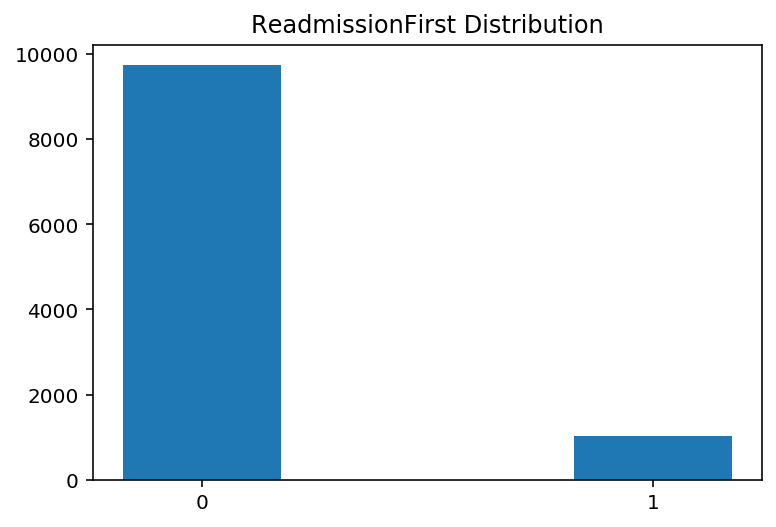

In [70]:
plt.bar(range(len(data_df['ReadmissionFirst'].value_counts().index)),data_df['ReadmissionFirst'].value_counts().values,tick_label=data_df['ReadmissionFirst'].value_counts().index,width = 0.35)
plt.title("ReadmissionFirst Distribution")
plt.show()

In [71]:
data_df['ReadmissionEver'].value_counts()

0    9122
1    1641
Name: ReadmissionEver, dtype: int64

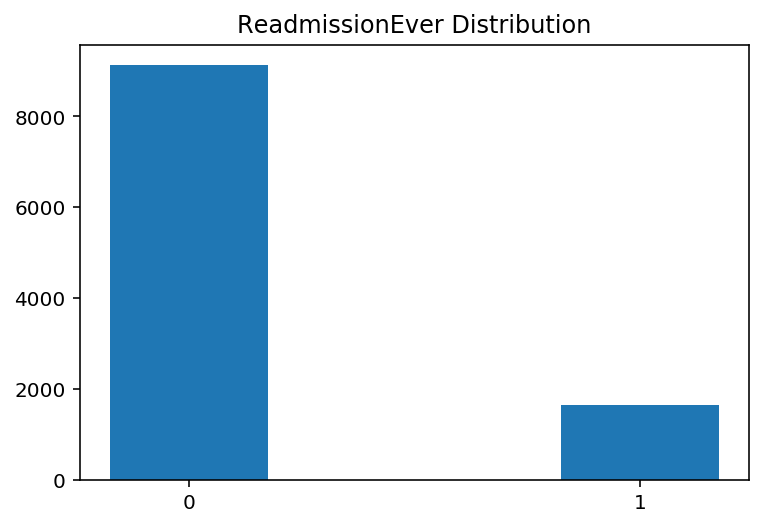

In [72]:
plt.bar(range(len(data_df['ReadmissionEver'].value_counts().index)),data_df['ReadmissionEver'].value_counts().values,tick_label=data_df['ReadmissionEver'].value_counts().index,width = 0.35)
plt.title("ReadmissionEver Distribution")
plt.show()

In [73]:
data_df['NumberOfReadmissions'].value_counts()

0    9122
1    1245
2     304
3      80
4      12
Name: NumberOfReadmissions, dtype: int64

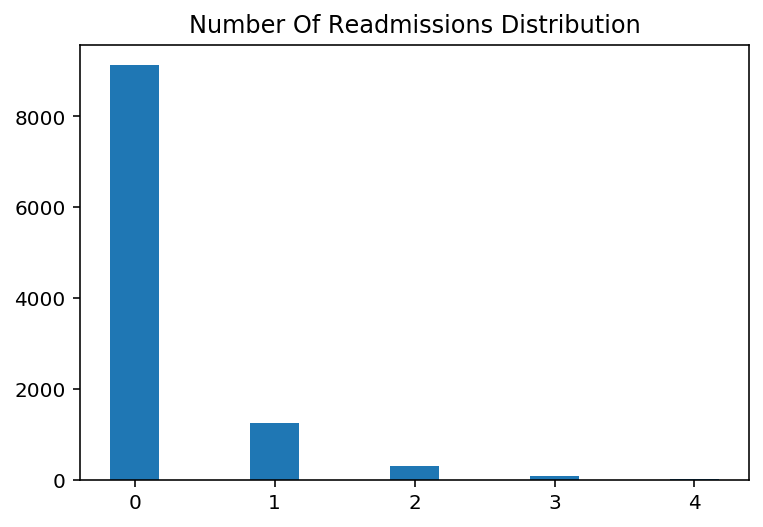

In [74]:
plt.bar(range(len(data_df['NumberOfReadmissions'].value_counts().index)),data_df['NumberOfReadmissions'].value_counts().values,tick_label=data_df['NumberOfReadmissions'].value_counts().index,width = 0.35)
plt.title("Number Of Readmissions Distribution")
plt.show()


In [75]:
data_df['NumberOfVisits'].value_counts()

1    6755
2    2105
3     825
5     695
4     383
Name: NumberOfVisits, dtype: int64

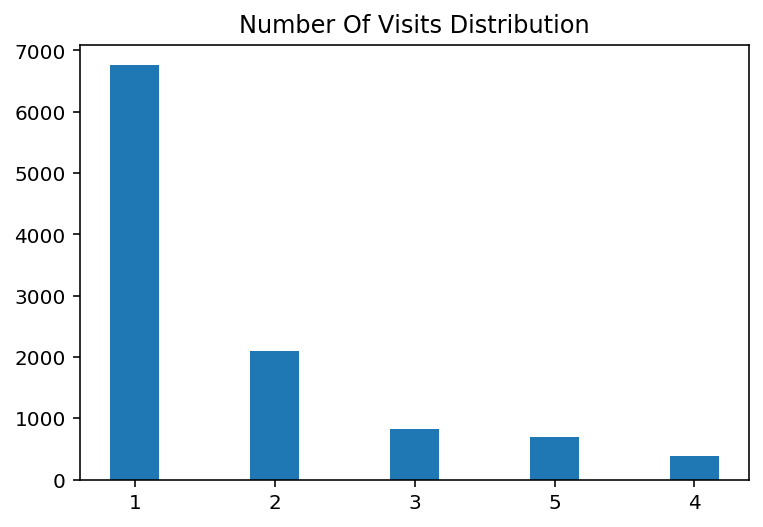

In [76]:
plt.bar(range(len(data_df['NumberOfVisits'].value_counts().index)),data_df['NumberOfVisits'].value_counts().values,tick_label=data_df['NumberOfVisits'].value_counts().index,width = 0.35)
plt.title("Number Of Visits Distribution")
plt.show()

## 3.2 Input Variable-Readmission

## 3.2.1 ReadmissionFirst

### Self-selected features

In [31]:
readm_first_input = ['age','BMI','Smoking','first.Cholesterol.total','ECHOFirst_lv_systolic_dimension','ECHOFirst_lv_diastolic_dimension']

In [32]:
for i,col in enumerate(readm_first_input):
    print(i+1,'.')
    print(data_df[col].describe())
    print() 

1 .
count    10763.000000
mean        76.983088
std         12.516532
min         16.761123
25%         69.531828
50%         79.288159
75%         86.027379
max        109.158111
Name: age, dtype: float64

2 .
count    10763.000000
mean        28.256788
std          6.073676
min         13.558884
25%         24.167162
50%         27.343750
75%         31.250000
max         67.515432
Name: BMI, dtype: float64

3 .
count    10763.000000
mean         1.899099
std          0.312120
min          1.000000
25%          2.000000
50%          2.000000
75%          2.000000
max          3.000000
Name: Smoking, dtype: float64

4 .
count    10763.000000
mean       144.543132
std         42.208307
min         23.000000
25%        115.000000
50%        139.000000
75%        169.000000
max        414.000000
Name: first.Cholesterol.total, dtype: float64

5 .
count    10763.000000
mean         3.446886
std          0.895584
min          1.124000
25%          2.881140
50%          3.362065
75%         

In [33]:
data_df['BMI']=pd.to_numeric(data_df['BMI'], errors='coerce')
print(data_df['BMI'].describe())

count    10763.000000
mean        28.256788
std          6.073676
min         13.558884
25%         24.167162
50%         27.343750
75%         31.250000
max         67.515432
Name: BMI, dtype: float64


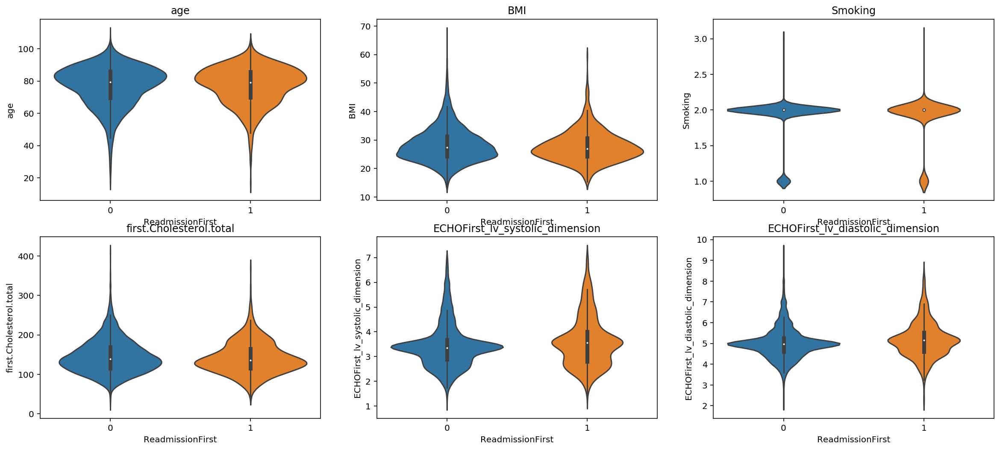

In [34]:
fig = plt.figure(figsize=(20, 32))
for i,col in enumerate(readm_first_input):
    ax = fig.add_subplot(7, 3, i+1)
    seaborn.violinplot(x='ReadmissionFirst',y=col, data=data_df[[col, 'ReadmissionFirst']], 
                       order=[0,1])
    ax.set_title(col)

## correlation analysis for all ReadmissionFirst-related features

In [23]:
import re
first_var = []
last_var = []
for var in total_var:
    first = re.findall('.*First.*',var,re.IGNORECASE)
    if len(first) == 1:
        first_var+=first    
    last = re.findall('.*last.*',var,re.IGNORECASE)
    if len(last) == 1:
        last_var+=last   
print(first_var)
print(last_var)
print(len(first_var))
print(len(last_var))

['first.Creatinine.Blood', 'first.Troponin', 'first.NEUTRO.abs', 'ECHOFirst_mv_ea_ratio', 'first.PCO2', 'first.Urea.Blood', 'ECHOFirst_mv_peak_a_wave', 'ECHOFirst_lv_mass.1', 'ECHOFirst_estimated_rap', 'ECHOFirst_la_pressure', 'first.MCH', 'first.Potassium.Blood', 'first.Amylase', 'ECHOFirst_la_area', 'first.Iron.Blood', 'ECHOFirst_lv_systolic_dimension', 'first.Bilirubin.Blood.total', 'first.Sodium', 'first.PTT', 'first.Osmolality.calc', 'first.Ferritin', 'first.RDW', 'first.PCT', 'first.EOS.abs', 'first.HCT', 'first.Chloride.Blood', 'first.Globulin', 'first.Albumin', 'ECHOFirst_rv_sp', 'first.Magnesium.Blood', 'first.BASO.abs', 'ECHOFirst_lv_diastolic_dimension', 'first.CPK.Blood.total', 'first.Hematocrit', 'first.LYMPHO', 'first.Phosphorus.Blood', 'first.HCO3', 'first.Alkaline.Phosphatase', 'first.SGOT.AST.Blood', 'first.Calcium.Blood.total', 'first.PH', 'first.WBC', 'ReadmissionFirst', 'first.Base.Excess', 'ECHOFirst_mv_dec_time', 'first.MPV', 'ECHOFirst_ti_grad', 'first.Lactate', 

In [24]:
import re
mortality_features = []

for var in total_var:
    mortality = re.findall('.*died.*',var,re.IGNORECASE)
    if len(mortality) == 1:
        mortality_features+=mortality
mortality_features=set(mortality_features)
print(mortality_features)

{'DIED30', 'DIED30_3', 'DIED30_2', 'DIED30_5', 'DIED30_4'}


In [25]:
CHF_features = []
for var in total_var:
    CHF = re.findall('.*CHF.*',var,re.IGNORECASE)
    if len(CHF) == 1:
        CHF_features+=CHF
CHF_features=set(CHF_features)
print(CHF_features)

{'CHF30_4', 'CHF30_2', 'CHF30_3', 'CHF30_1'}


In [26]:
readmission_features = set(['ReadmissionFirst','ReadmissionEver'])

all_first_features = total_var-set(last_var)-mortality_features
print('Number of first-readmission related features:',len(all_first_features))

Number of first-readmission related features: 147


### Pearson Correlation 

In [39]:
data_df[all_first_features].corr()

,ECHOFirst_mv_peak_e_wave,first.WBC,ECHOFirst_patient_bsa,first.Osmolality.calc,first.HCO3,age,any_TIA,first.RBC,ECHOFirst_lv_systolic_dimension,first.Calcium.Ionized,...,first.Globulin,first.Creatinine.Blood,first.BASO.abs,ReadmissionFirst,first.PLT,first.SGOT.AST.Blood,any_PULM.CONG,first.Troponin,ECHOFirst_mv_ea_ratio,first.MCV
ECHOFirst_mv_peak_e_wave,1.000000,-0.003406,-0.042594,0.043331,0.018532,-0.014259,-0.028952,-0.068653,-0.056321,0.003722,...,0.011297,0.010465,-0.019231,-0.102785,-0.001767,-0.012510,-0.028632,-0.008379,0.189192,-0.030672
first.WBC,-0.003406,1.000000,-0.042840,0.197290,-0.110153,0.060033,-0.016332,0.011541,-0.050098,-0.026925,...,0.044884,0.122668,0.190926,0.002690,0.215569,0.139983,0.059232,0.087885,-0.047180,-0.015874
ECHOFirst_patient_bsa,-0.042594,-0.042840,1.000000,-0.003760,0.035365,-0.240539,0.002992,0.097572,0.199058,0.018119,...,0.025519,0.029505,0.021414,0.007296,-0.052335,-0.044771,-0.085369,-0.016140,0.056073,-0.036973
first.Osmolality.calc,0.043331,0.197290,-0.003760,1.000000,-0.102699,0.123389,-0.024384,-0.188807,-0.016441,-0.043521,...,0.025073,0.437120,-0.052657,-0.082960,-0.109152,0.077296,0.006220,0.037264,-0.011371,0.078943
first.HCO3,0.018532,-0.110153,0.035365,-0.102699,1.000000,0.051896,-0.034665,0.168989,-0.065911,-0.013133,...,0.043424,-0.319393,-0.022803,-0.020479,0.068219,-0.088817,-0.007782,-0.069419,-0.027073,-0.017717
age,-0.014259,0.060033,-0.240539,0.123389,0.051896,1.000000,0.042507,-0.170486,-0.231841,-0.104823,...,-0.032722,-0.003033,-0.074997,0.005198,-0.022005,0.030603,0.175133,0.005309,-0.032568,0.134258
any_TIA,-0.028952,-0.016332,0.002992,-0.024384,-0.034665,0.042507,1.000000,0.000598,-0.038842,-0.015353,...,-0.021667,0.006002,-0.003343,0.009094,0.008113,-0.010701,0.020132,-0.018042,0.000910,-0.006917
first.RBC,-0.068653,0.011541,0.097572,-0.188807,0.168989,-0.170486,0.000598,1.000000,0.079961,0.060179,...,-0.007081,-0.259701,0.089920,0.011101,0.070918,-0.021523,-0.058996,-0.037950,-0.020259,-0.372475
ECHOFirst_lv_systolic_dimension,-0.056321,-0.050098,0.199058,-0.016441,-0.065911,-0.231841,-0.038842,0.079961,1.000000,0.068871,...,-0.014086,0.054469,0.015597,0.057627,-0.088394,0.033266,-0.101259,0.016634,0.119225,0.026865
first.Calcium.Ionized,0.003722,-0.026925,0.018119,-0.043521,-0.013133,-0.104823,-0.015353,0.060179,0.068871,1.000000,...,-0.027591,-0.052724,0.003271,0.014485,0.007794,0.032937,-0.036619,0.062658,-0.024109,-0.026183


### Kendall-Tau Correlation 

In [63]:
data_df[all_first_features].corr('kendall')

,ECHOFirst_patient_bsa,any_SOLID.TUMOR,frist.CRP,any_IHD,any_RENAL.DIS,first.Base.Excess,first.Phosphorus.Blood,temperature,first.Sodium,any_PULM.CONG,...,any_CARDIOMYOPATHY,any_ANEMIA,ECHOFirst_lv_mass_index.1,ECHOFirst_lv_diastolic_dimension,first.WBC,ECHOFirst_ti_grad,first.HCO3,first.BASO,first.Potassium.Blood,any_DM
ECHOFirst_patient_bsa,1.000000,-0.009985,-0.016592,0.039342,0.049860,0.003152,0.008439,-0.040012,0.026783,-0.088912,...,0.060446,-0.032635,0.025260,0.211266,-0.024025,-0.045050,0.031634,0.026308,0.023781,0.145918
any_SOLID.TUMOR,-0.009985,1.000000,0.026823,0.012375,0.042232,-0.028280,-0.014706,-0.014253,-0.002678,0.031465,...,-0.029279,0.081612,-0.014489,-0.017166,0.011664,-0.014593,-0.029991,-0.026657,0.013002,-0.005463
frist.CRP,-0.016592,0.026823,1.000000,-0.008581,0.044391,-0.022222,-0.006530,0.064792,-0.015485,0.046112,...,-0.068189,0.021717,0.003433,-0.025364,0.166479,0.029720,-0.052297,-0.114257,-0.007467,-0.021399
any_IHD,0.039342,0.012375,-0.008581,1.000000,0.175874,-0.057565,0.012420,-0.039472,-0.015830,0.053321,...,0.014498,0.093650,0.070730,0.132054,-0.000720,-0.041892,-0.072193,0.015415,0.049710,0.167203
any_RENAL.DIS,0.049860,0.042232,0.044391,0.175874,1.000000,-0.153508,0.125610,-0.001077,-0.013074,0.097120,...,0.007891,0.281993,0.061193,0.074606,0.015654,0.011625,-0.171499,-0.011199,0.160111,0.171824
first.Base.Excess,0.003152,-0.028280,-0.022222,-0.057565,-0.153508,1.000000,-0.075248,0.013470,0.038427,-0.010936,...,-0.010723,-0.074487,-0.014330,-0.031307,-0.030174,0.013217,0.639662,0.000459,-0.126537,-0.040782
first.Phosphorus.Blood,0.008439,-0.014706,-0.006530,0.012420,0.125610,-0.075248,1.000000,-0.003507,-0.005990,0.026614,...,0.007013,0.044636,0.010403,0.016631,0.067174,0.021615,-0.103120,0.015867,0.205607,0.078447
temperature,-0.040012,-0.014253,0.064792,-0.039472,-0.001077,0.013470,-0.003507,1.000000,0.020746,0.067610,...,-0.066418,0.024819,-0.011598,-0.050147,0.071224,0.008905,0.016727,-0.041104,-0.003294,-0.011244
first.Sodium,0.026783,-0.002678,-0.015485,-0.015830,-0.013074,0.038427,-0.005990,0.020746,1.000000,0.019734,...,-0.023993,-0.039501,-0.003339,0.000400,-0.004567,-0.007823,0.057209,0.006557,-0.058500,-0.034190
any_PULM.CONG,-0.088912,0.031465,0.046112,0.053321,0.097120,-0.010936,0.026614,0.067610,0.019734,1.000000,...,-0.099769,0.103812,0.026916,-0.055225,0.066563,-0.015213,-0.005089,-0.014967,0.027946,0.026444


### Spearman Correlation 

In [64]:
data_df[all_first_features].corr('spearman')

,ECHOFirst_patient_bsa,any_SOLID.TUMOR,frist.CRP,any_IHD,any_RENAL.DIS,first.Base.Excess,first.Phosphorus.Blood,temperature,first.Sodium,any_PULM.CONG,...,any_CARDIOMYOPATHY,any_ANEMIA,ECHOFirst_lv_mass_index.1,ECHOFirst_lv_diastolic_dimension,first.WBC,ECHOFirst_ti_grad,first.HCO3,first.BASO,first.Potassium.Blood,any_DM
ECHOFirst_patient_bsa,1.000000,-0.012169,-0.024761,0.047945,0.060763,0.004621,0.012491,-0.057265,0.039363,-0.108356,...,0.073665,-0.039771,0.044873,0.305146,-0.035832,-0.063273,0.046797,0.037285,0.034668,0.177828
any_SOLID.TUMOR,-0.012169,1.000000,0.032847,0.012375,0.042232,-0.034516,-0.017769,-0.016715,-0.003238,0.031465,...,-0.029279,0.081612,-0.017698,-0.020965,0.014279,-0.017711,-0.036617,-0.031066,0.015576,-0.005463
frist.CRP,-0.024761,0.032847,1.000000,-0.010509,0.054361,-0.033617,-0.009673,0.092796,-0.022848,0.056468,...,-0.083503,0.026595,0.004987,-0.037466,0.248595,0.044198,-0.079356,-0.162662,-0.010953,-0.026205
any_IHD,0.047945,0.012375,-0.010509,1.000000,0.175874,-0.070259,0.015006,-0.046289,-0.019141,0.053321,...,0.014498,0.093650,0.086392,0.161279,-0.000882,-0.050845,-0.088143,0.017965,0.059554,0.167203
any_RENAL.DIS,0.060763,0.042232,0.054361,0.175874,1.000000,-0.187359,0.151772,-0.001263,-0.015808,0.097120,...,0.007891,0.281993,0.074743,0.091117,0.019163,0.014109,-0.209390,-0.013051,0.191819,0.171824
first.Base.Excess,0.004621,-0.034516,-0.033617,-0.070259,-0.187359,1.000000,-0.111467,0.019103,0.056483,-0.013347,...,-0.013087,-0.090912,-0.021588,-0.046278,-0.045204,0.019450,0.796161,0.001174,-0.184290,-0.049775
first.Phosphorus.Blood,0.012491,-0.017769,-0.009673,0.015006,0.151772,-0.111467,1.000000,-0.004773,-0.008810,0.032157,...,0.008474,0.053933,0.015441,0.024446,0.098023,0.031698,-0.151260,0.022394,0.290493,0.094785
temperature,-0.057265,-0.016715,0.092796,-0.046289,-0.001263,0.019103,-0.004773,1.000000,0.029540,0.079286,...,-0.077888,0.029106,-0.016642,-0.071941,0.102002,0.012711,0.023294,-0.056201,-0.004483,-0.013185
first.Sodium,0.039363,-0.003238,-0.022848,-0.019141,-0.015808,0.056483,-0.008810,0.029540,1.000000,0.023861,...,-0.029011,-0.047763,-0.004847,0.000989,-0.006314,-0.011358,0.082680,0.009379,-0.083516,-0.041341
any_PULM.CONG,-0.108356,0.031465,0.056468,0.053321,0.097120,-0.013347,0.032157,0.079286,0.023861,1.000000,...,-0.099769,0.103812,0.032876,-0.067447,0.081485,-0.018464,-0.006214,-0.017442,0.033480,0.026444


# 3.2.2 ReadmissionEver

In [40]:
readm_ever_input = ['age','BMI','Smoking','first.Cholesterol.total','ECHOFirst_lv_systolic_dimension','ECHOFirst_lv_diastolic_dimension',
                   'last.Cholesterol.total','ECHOlast_lv_systolic_dimension','ECHOlast_lv_diastolic_dimension']

In [33]:
for i,col in enumerate(readm_ever_input):
    print(i+1,'.')
    print(data_df[col].describe())
    print()

1 .
count    10763.000000
mean        76.983088
std         12.516532
min         16.761123
25%         69.531828
50%         79.288159
75%         86.027379
max        109.158111
Name: age, dtype: float64

2 .
count    10763.000000
mean        28.256788
std          6.073676
min         13.558884
25%         24.167162
50%         27.343750
75%         31.250000
max         67.515432
Name: BMI, dtype: float64

3 .
count    10763.000000
mean         1.899099
std          0.312120
min          1.000000
25%          2.000000
50%          2.000000
75%          2.000000
max          3.000000
Name: Smoking, dtype: float64

4 .
count    10763.000000
mean       144.543132
std         42.208307
min         23.000000
25%        115.000000
50%        139.000000
75%        169.000000
max        414.000000
Name: first.Cholesterol.total, dtype: float64

5 .
count    10763.000000
mean         3.446886
std          0.895584
min          1.124000
25%          2.881140
50%          3.362065
75%         

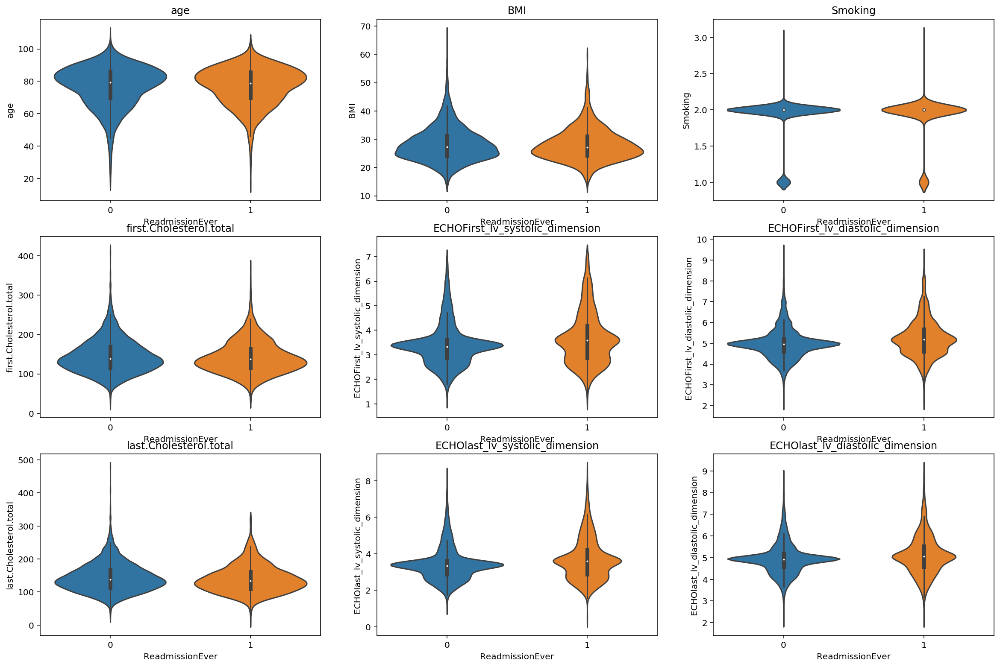

In [34]:
fig = plt.figure(figsize=(20, 32))
for i,col in enumerate(readm_ever_input):
    ax = fig.add_subplot(7, 3, i+1)
    seaborn.violinplot(x='ReadmissionEver',y=col, data=data_df[[col, 'ReadmissionEver']], 
                       order=[0,1])
    ax.set_title(col)

## correlation analysis for all ReadmissionEver-related features

In [27]:
all_last_features = total_var-mortality_features
print('Number of ever-readmission related features:',len(all_last_features))

Number of ever-readmission related features: 222


In [28]:
last_features = set(last_var)
print('Number of last visit diagnosis features:',len(last_features))

Number of last visit diagnosis features: 75


### Pearson Correlation

In [66]:
data_df[all_last_features].corr()

,ECHOFirst_patient_bsa,any_SOLID.TUMOR,frist.CRP,any_IHD,any_RENAL.DIS,first.Base.Excess,first.Phosphorus.Blood,temperature,first.Sodium,any_PULM.CONG,...,ECHOFirst_lv_diastolic_dimension,first.WBC,last.Calcium..Ionized,ECHOFirst_ti_grad,first.HCO3,first.BASO,first.Potassium.Blood,last.Magnesium,any_DM,ECHOlast_mv_dec_time
ECHOFirst_patient_bsa,1.000000,-0.013311,-0.034933,0.047536,0.060864,-0.002827,-0.002786,-0.059152,0.020465,-0.085369,...,0.268863,-0.042840,0.016523,-0.060459,0.035365,0.031618,0.025602,-0.010161,0.164940,-0.013626
any_SOLID.TUMOR,-0.013311,1.000000,0.041354,0.012375,0.042232,-0.034287,-0.009315,-0.019241,-0.005829,0.031465,...,-0.022874,0.021306,-0.032890,-0.016613,-0.035267,-0.029488,0.012519,0.005007,-0.005463,0.003874
frist.CRP,-0.034933,0.041354,1.000000,-0.006638,0.056846,-0.048870,0.053027,0.107991,0.003111,0.052532,...,-0.040735,0.231268,-0.037194,0.033759,-0.084342,-0.139328,0.006473,0.047412,-0.016375,-0.011562
any_IHD,0.047536,0.012375,-0.006638,1.000000,0.175874,-0.072644,0.006879,-0.030678,-0.012072,0.053321,...,0.158886,-0.015251,0.045754,-0.055687,-0.096575,0.015311,0.049164,0.047727,0.167203,0.005257
any_RENAL.DIS,0.060864,0.042232,0.056846,0.175874,1.000000,-0.185738,0.164092,-0.015998,-0.011898,0.097120,...,0.089776,0.027993,-0.039524,-0.003334,-0.202472,-0.013402,0.181595,0.169891,0.171824,-0.054388
first.Base.Excess,-0.002827,-0.034287,-0.048870,-0.072644,-0.185738,1.000000,-0.132867,0.010173,0.047418,-0.015347,...,-0.043483,-0.068056,-0.014197,0.022207,0.639590,-0.004710,-0.164841,-0.045591,-0.048490,0.026084
first.Phosphorus.Blood,-0.002786,-0.009315,0.053027,0.006879,0.164092,-0.132867,1.000000,0.010177,-0.001893,0.027273,...,0.007346,0.174367,-0.018344,0.043334,-0.225440,-0.024708,0.340113,0.179094,0.070209,-0.012398
temperature,-0.059152,-0.019241,0.107991,-0.030678,-0.015998,0.010173,0.010177,1.000000,0.089972,0.069704,...,-0.062304,0.129458,-0.047601,0.015592,0.013975,-0.063471,-0.010421,0.034499,-0.012463,-0.006138
first.Sodium,0.020465,-0.005829,0.003111,-0.012072,-0.011898,0.047418,-0.001893,0.089972,1.000000,0.019749,...,-0.004185,0.016961,0.012462,-0.000575,0.064486,-0.005299,-0.079055,0.071389,-0.037993,0.019987
any_PULM.CONG,-0.085369,0.031465,0.052532,0.053321,0.097120,-0.015347,0.027273,0.069704,0.019749,1.000000,...,-0.077399,0.059232,-0.037244,-0.030772,-0.007782,-0.020875,0.037587,0.039421,0.026444,0.025239


### Kendall-Tau Correlation

In [67]:
data_df[all_last_features].corr('kendall')

,ECHOFirst_patient_bsa,any_SOLID.TUMOR,frist.CRP,any_IHD,any_RENAL.DIS,first.Base.Excess,first.Phosphorus.Blood,temperature,first.Sodium,any_PULM.CONG,...,ECHOFirst_lv_diastolic_dimension,first.WBC,last.Calcium..Ionized,ECHOFirst_ti_grad,first.HCO3,first.BASO,first.Potassium.Blood,last.Magnesium,any_DM,ECHOlast_mv_dec_time
ECHOFirst_patient_bsa,1.000000,-0.009985,-0.016592,0.039342,0.049860,0.003152,0.008439,-0.040012,0.026783,-0.088912,...,0.211266,-0.024025,0.013719,-0.045050,0.031634,0.026308,0.023781,-0.008876,0.145918,-0.000808
any_SOLID.TUMOR,-0.009985,1.000000,0.026823,0.012375,0.042232,-0.028280,-0.014706,-0.014253,-0.002678,0.031465,...,-0.017166,0.011664,0.002616,-0.014593,-0.029991,-0.026657,0.013002,0.001127,-0.005463,0.005548
frist.CRP,-0.016592,0.026823,1.000000,-0.008581,0.044391,-0.022222,-0.006530,0.064792,-0.015485,0.046112,...,-0.025364,0.166479,-0.065826,0.029720,-0.052297,-0.114257,-0.007467,0.026099,-0.021399,-0.008074
any_IHD,0.039342,0.012375,-0.008581,1.000000,0.175874,-0.057565,0.012420,-0.039472,-0.015830,0.053321,...,0.132054,-0.000720,-0.002347,-0.041892,-0.072193,0.015415,0.049710,0.046793,0.167203,-0.001848
any_RENAL.DIS,0.049860,0.042232,0.044391,0.175874,1.000000,-0.153508,0.125610,-0.001077,-0.013074,0.097120,...,0.074606,0.015654,-0.065624,0.011625,-0.171499,-0.011199,0.160111,0.141494,0.171824,-0.046981
first.Base.Excess,0.003152,-0.028280,-0.022222,-0.057565,-0.153508,1.000000,-0.075248,0.013470,0.038427,-0.010936,...,-0.031307,-0.030174,0.003224,0.013217,0.639662,0.000459,-0.126537,-0.029213,-0.040782,0.018845
first.Phosphorus.Blood,0.008439,-0.014706,-0.006530,0.012420,0.125610,-0.075248,1.000000,-0.003507,-0.005990,0.026614,...,0.016631,0.067174,-0.054114,0.021615,-0.103120,0.015867,0.205607,0.097589,0.078447,-0.007541
temperature,-0.040012,-0.014253,0.064792,-0.039472,-0.001077,0.013470,-0.003507,1.000000,0.020746,0.067610,...,-0.050147,0.071224,-0.037099,0.008905,0.016727,-0.041104,-0.003294,0.016917,-0.011244,0.004361
first.Sodium,0.026783,-0.002678,-0.015485,-0.015830,-0.013074,0.038427,-0.005990,0.020746,1.000000,0.019734,...,0.000400,-0.004567,0.046155,-0.007823,0.057209,0.006557,-0.058500,0.045702,-0.034190,0.009727
any_PULM.CONG,-0.088912,0.031465,0.046112,0.053321,0.097120,-0.010936,0.026614,0.067610,0.019734,1.000000,...,-0.055225,0.066563,-0.046243,-0.015213,-0.005089,-0.014967,0.027946,0.036534,0.026444,0.024848


### Spearman Correlation

In [71]:
data_df[all_last_features].corr('spearman')

,last.NEUTRO,BMI,first.Base.Excess,first.Protein..Blood.total,ECHOFirst_ivs_thick,first.MCHC,any_DYSLIP,first.PCT,last.Potassium,first.Albumin,...,first.COHb,first.RDW,any_PULM.HTN,age,first.SGPT.ALT,NumberOfVisits,respiratory rate,last.SGOT.AST,ECHOFirst_lv_mass_index.1,first.Calcium.Ionized
last.NEUTRO,1.000000,-0.054158,-0.045074,-0.154539,0.054731,-0.065041,-0.041515,0.044170,0.113175,-0.190621,...,0.035402,0.180457,0.058033,0.158861,0.049958,0.147829,0.068827,0.184144,0.045682,-0.161225
BMI,-0.054158,1.000000,0.047750,0.081328,0.096037,-0.032843,0.069179,0.013830,0.006909,0.072144,...,0.016602,0.008095,0.022427,-0.143016,-0.003844,0.027602,0.002615,-0.074548,-0.033375,0.020928
first.Base.Excess,-0.045074,0.047750,1.000000,0.042732,0.000907,-0.054682,-0.023806,0.036020,-0.132620,0.024356,...,0.060904,-0.021651,0.022096,0.049204,-0.018530,-0.074011,0.012690,-0.023798,-0.021588,0.015198
first.Protein..Blood.total,-0.154539,0.081328,0.042732,1.000000,0.001163,0.085392,0.060102,0.097519,0.035176,0.619811,...,-0.040389,-0.143830,0.057926,-0.172990,-0.013876,0.196598,-0.037680,-0.018518,0.016694,0.060929
ECHOFirst_ivs_thick,0.054731,0.096037,0.000907,0.001163,1.000000,0.013503,0.025479,-0.013171,0.012637,0.017115,...,-0.002669,-0.006267,-0.007562,0.123118,-0.055360,0.149704,0.006828,-0.045871,0.311365,-0.028555
first.MCHC,-0.065041,-0.032843,-0.054682,0.085392,0.013503,1.000000,0.024600,-0.161009,-0.024383,0.149834,...,-0.091547,-0.378493,-0.014790,-0.040221,0.031847,0.070476,-0.034787,0.000297,0.046415,-0.053602
any_DYSLIP,-0.041515,0.069179,-0.023806,0.060102,0.025479,0.024600,1.000000,0.023764,0.013638,0.109791,...,-0.046245,-0.066119,0.010637,-0.075979,0.019988,0.084746,-0.033229,-0.027732,-0.001066,0.051820
first.PCT,0.044170,0.013830,0.036020,0.097519,-0.013171,-0.161009,0.023764,1.000000,0.030350,-0.036445,...,-0.087174,-0.009210,-0.018416,-0.035144,0.006140,0.011748,0.013231,-0.036589,-0.050782,0.019220
last.Potassium,0.113175,0.006909,-0.132620,0.035176,0.012637,-0.024383,0.013638,0.030350,1.000000,0.005077,...,-0.013914,0.062211,0.027312,-0.064264,0.012491,0.040653,-0.001544,0.091968,0.026678,0.013285
first.Albumin,-0.190621,0.072144,0.024356,0.619811,0.017115,0.149834,0.109791,-0.036445,0.005077,1.000000,...,-0.082488,-0.274517,0.059579,-0.196894,0.027701,0.261608,-0.067067,-0.049460,0.023075,0.104767


# 3.3 Inter-variable Correlation

In [29]:
total_var = set.union(numer_var, categ_var)
print(len(total_var))

227


In [30]:
all_first_last_var = first_var + last_var

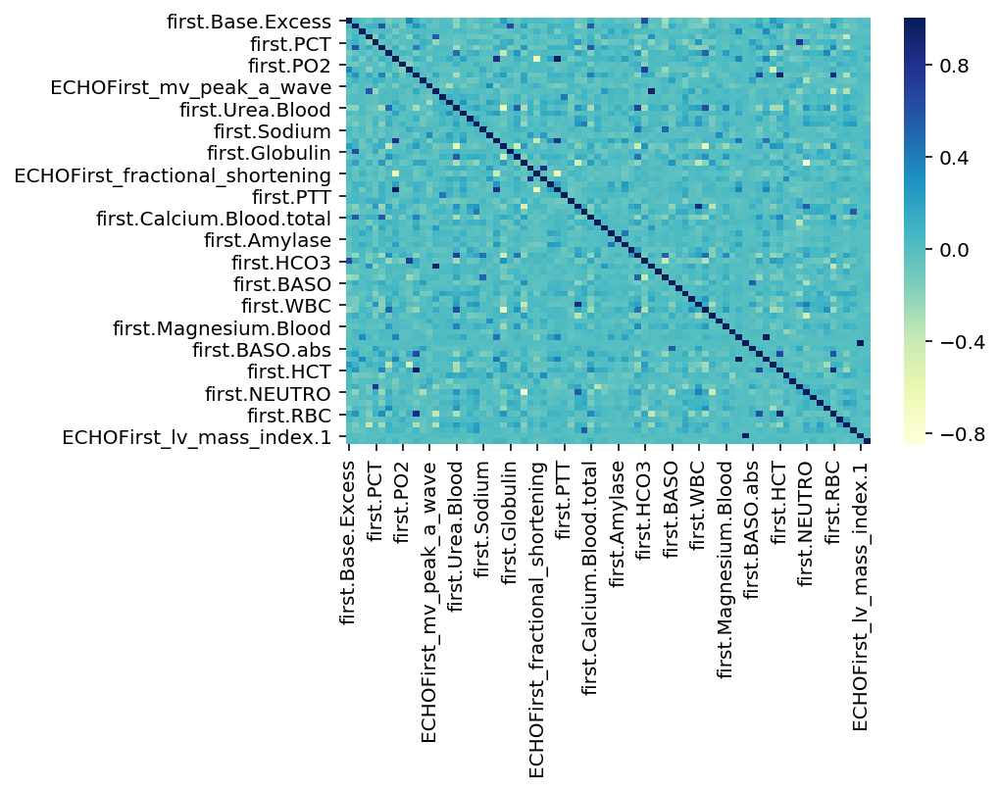

In [38]:
seaborn.heatmap(data_df[first_var].corr(),cmap="YlGnBu")
plt.show()

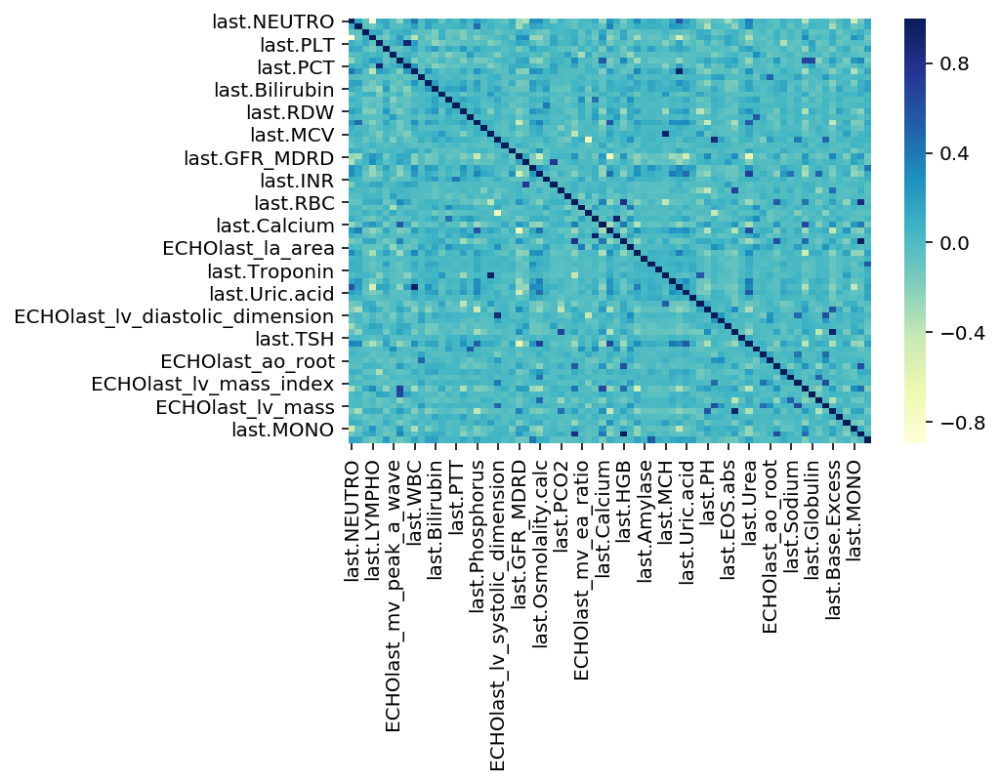

In [39]:
seaborn.heatmap(data_df[last_var].corr(),cmap="YlGnBu")
plt.show()

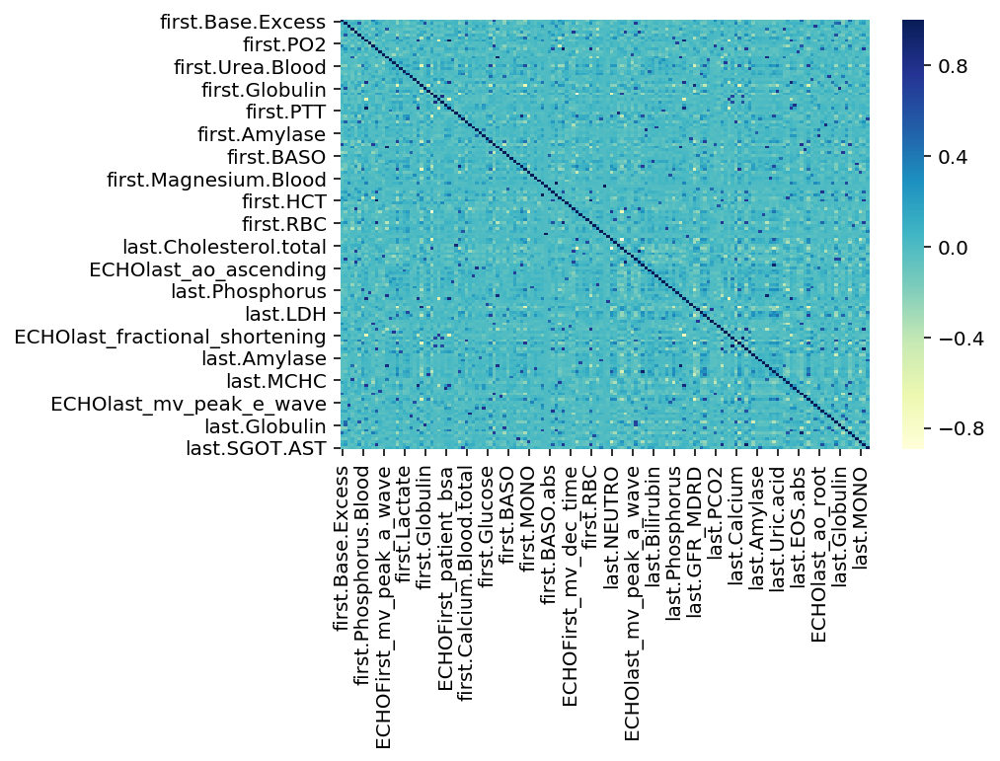

In [40]:
seaborn.heatmap(data_df[all_first_last_var].corr(),cmap="YlGnBu")
plt.show()

# 4. Dimensionality Reduction

## 4.1 Useless Features Elimination

In [31]:
readmission_number = {'NumberOfReadmissions'}
readmission_useless_features = set.union(mortality_features, last_features,readmission_number,CHF_features,set(['diag']),set(['NumberOfVisits','Serial','is_dead']))               
print('Number of Useless features for readmission study:',len(readmission_useless_features),'\n')
print('Mortality related features_y:',mortality_features,'\n')
print('Last visit diagnosis features:',last_features,'\n')
print('Readmission number features:',readmission_number,'\n')


Number of Useless features for readmission study: 89 

Mortality related features_y: {'DIED30', 'DIED30_3', 'DIED30_2', 'DIED30_5', 'DIED30_4'} 

Last visit diagnosis features: {'ECHOlast_ivs_thick', 'last.SGOT.AST', 'last.Troponin', 'ECHOlast_lv_systolic_dimension', 'last.Osmolality.calc', 'last.Calcium', 'ECHOlast_lv_mass', 'last.Uric.acid', 'ECHOlast_la_area', 'last.Protein', 'last.HCT', 'ECHOlast_ti_grad', 'last.PCO2', 'last.Alkaline.Phosphatase', 'last.Ferritin', 'ECHOlast_mv_ea_ratio', 'last.Urea', 'last.EOS.abs', 'last.INR', 'last.Globulin', 'last.TSH', 'last.MCV', 'last.Lactate', 'last.RBC', 'last.LYMPHO', 'last.PTT', 'last.CPK', 'last.Potassium', 'last.Sodium', 'ECHOlast_estimated_rap', 'last.PH', 'last.Glucose', 'last.PLT', 'ECHOlast_lv_diastolic_dimension', 'last.NEUTRO', 'ECHOlast_la_pressure', 'last.SGPT.ALT', 'last.BASO.abs', 'last.LDH', 'last.Cholesterol.total', 'ECHOlast_mv_peak_e_wave', 'last.Albumin', 'last.Iron..Blood', 'ECHOlast_lv_mass_index', 'last.MCH', 'last.CRP

In [32]:
readmission_useful_features  = total_var - readmission_useless_features
print('Number of useful features for readmission study:',len(readmission_useful_features))

Number of useful features for readmission study: 138


In [33]:
data_df_readmission = data_df[readmission_useful_features]

In [34]:
data_df_readmission.shape

(10763, 138)

In [35]:
data_df_readmission.columns

Index(['first.Creatinine.Blood', 'Smoking', 'first.Troponin',
       'ALPHA.AND.BETA.BLOCKING.AGENTS', 'ALPHA.ADRENERGIC.BLOCKING.AGENTS',
       'any_CABG', 'CORTICOSTEROIDS', 'first.NEUTRO.abs',
       'ECHOFirst_mv_ea_ratio', 'temperature',
       ...
       'SELECTIVE.SEROTONIN.REUPTAKE.INHIBITORS', 'first.MCHC', 'any_DM',
       'first.Protein..Blood.total', 'first.MONO', 'first.MCV',
       'first.Glucose', 'first.GFR.MDRD', 'first.HGB',
       'ECHOFirst_lv_diastolic_dimension'],
      dtype='object', length=138)

In [36]:
nan_count_readmission=data_df_readmission.isnull().sum(axis = 0)
nan_count_readmission.sort_values(ascending=False)

ECHOFirst_lv_diastolic_dimension    0
first.Ferritin                      0
DIGITALIS.GLYCOSIDES                0
first.EOS.abs                       0
PLATELET.AGGREGATION.INHIBITORS     0
                                   ..
ECHOFirst_ivs_thick                 0
GLUCOCORTICOIDS                     0
first.NEUTRO                        0
ECHOFirst_patient_bsa               0
first.Creatinine.Blood              0
Length: 138, dtype: int64

## 4.2 Data Transformation

### 4.2.1 OHE-convert NaN in CHF features to 0 

In [37]:
data_df_readmission = data_df_readmission.replace(to_replace=np.NaN, value=0)

In [38]:
nan_count_readmission=data_df_readmission.isnull().sum(axis = 0)
nan_count_readmission.sort_values(ascending=False)

ECHOFirst_lv_diastolic_dimension    0
first.Ferritin                      0
DIGITALIS.GLYCOSIDES                0
first.EOS.abs                       0
PLATELET.AGGREGATION.INHIBITORS     0
                                   ..
ECHOFirst_ivs_thick                 0
GLUCOCORTICOIDS                     0
first.NEUTRO                        0
ECHOFirst_patient_bsa               0
first.Creatinine.Blood              0
Length: 138, dtype: int64

### 4.2.2 Binary (0/1) Features-convert Yes/No to 0/1

In [39]:
data_df_readmission = data_df_readmission.replace(to_replace=['Yes','No'], value=[1,0])

In [40]:
data_df_readmission.describe()

,first.Creatinine.Blood,Smoking,first.Troponin,ALPHA.AND.BETA.BLOCKING.AGENTS,ALPHA.ADRENERGIC.BLOCKING.AGENTS,any_CABG,CORTICOSTEROIDS,first.NEUTRO.abs,ECHOFirst_mv_ea_ratio,temperature,...,SELECTIVE.SEROTONIN.REUPTAKE.INHIBITORS,first.MCHC,any_DM,first.Protein..Blood.total,first.MONO,first.MCV,first.Glucose,first.GFR.MDRD,first.HGB,ECHOFirst_lv_diastolic_dimension
count,10763.000000,10763.000000,10763.000000,10763.000000,10763.000000,10763.000000,10763.000000,10763.000000,10763.000000,10763.000000,...,10763.000000,10763.000000,10763.000000,10763.000000,10763.000000,10763.000000,10763.000000,10763.000000,10763.000000,10763.000000
mean,1.653093,1.899099,0.402294,0.135743,0.233485,0.167240,0.119855,7.570712,1.553846,36.751909,...,0.161665,32.788328,0.426368,6.439865,7.740529,88.455695,143.819010,51.295470,11.558957,5.024225
std,1.313296,0.312120,2.228792,0.342531,0.423068,0.373207,0.324807,4.891718,0.911281,0.432827,...,0.368160,1.019483,0.494572,0.809986,3.723001,6.985732,71.628724,27.708538,1.938130,0.747386
min,0.210000,1.000000,0.010000,0.000000,0.000000,0.000000,0.000000,0.010000,0.130000,34.400000,...,0.000000,27.600000,0.000000,1.700000,0.000000,52.880000,12.000000,3.000000,5.110000,2.040000
25%,0.940000,2.000000,0.028000,0.000000,0.000000,0.000000,0.000000,4.680000,0.860000,36.500000,...,0.000000,32.200000,0.000000,6.000000,5.700000,84.490000,100.000000,31.246011,10.200000,4.600000
50%,1.250000,2.000000,0.044000,0.000000,0.000000,0.000000,0.000000,6.420000,1.500000,36.700000,...,0.000000,32.800000,0.000000,6.500000,7.500000,88.720000,122.000000,48.000000,11.520000,4.989244
75%,1.800000,2.000000,0.094000,0.000000,0.000000,0.000000,0.000000,8.930000,1.752000,36.900000,...,0.000000,33.500000,1.000000,7.000000,9.400000,92.835000,164.000000,67.000000,12.850000,5.300000
max,13.850000,3.000000,49.199000,1.000000,1.000000,1.000000,1.000000,72.800000,5.980000,42.000000,...,1.000000,39.800000,1.000000,11.700000,66.500000,122.700000,1003.000000,193.290713,18.720000,9.500000


Except for the 'Patient' feature(str), all the other 141 features in the newest cleaned DataFrame are in int/float data type.

### 4.2.3 Save the newest dataset to a new csv file to the same root folder

In [39]:
os.getcwd()

'C:\\Users\\Yunge Li\\Desktop\\助研_rema\\原始数据'

## 4.3 Division of X and Y DataFrame


In [41]:
Y_two_features = readmission_features
X_features = readmission_useful_features - readmission_features - {'Patient'}
print('Number of X features: ',len(X_features))
print('Number of Y features: ',len(Y_two_features))

Number of X features:  135
Number of Y features:  2


In [42]:
data_df_readmission=data_df_readmission[set.union(X_features,Y_two_features)]
data_df_readmission.shape

(10763, 137)

In [43]:
data_df_readmission.to_csv('Newest Cleaned Data for Readmission Study.csv',index = False)

In [44]:
dir_clean_data = '.\\Newest Cleaned Data for Readmission Study.csv'


In [45]:
clean_df = pd.read_csv(dir_clean_data)
clean_df.head(n=10)

,first.Creatinine.Blood,Smoking,first.Troponin,ALPHA.AND.BETA.BLOCKING.AGENTS,ALPHA.ADRENERGIC.BLOCKING.AGENTS,any_CABG,CORTICOSTEROIDS,first.NEUTRO.abs,ECHOFirst_mv_ea_ratio,temperature,...,SELECTIVE.SEROTONIN.REUPTAKE.INHIBITORS,first.MCHC,any_DM,first.Protein..Blood.total,first.MONO,first.MCV,first.Glucose,first.GFR.MDRD,first.HGB,ECHOFirst_lv_diastolic_dimension
0,0.90,1,0.023,0,0,0,0,3.32,0.910000,36.9,...,0,31.9,1,7.1,10.6,66.30,264,82.283630,9.88,5.570000
1,0.75,2,0.032,0,0,0,0,7.10,0.600000,36.6,...,0,32.5,0,6.9,12.0,92.01,245,72.824749,11.26,5.400000
2,0.87,2,0.225,0,0,0,0,8.17,3.150000,37.1,...,1,32.3,0,6.5,6.4,85.66,98,60.951566,11.06,4.786946
3,1.50,1,0.041,0,0,1,0,4.65,1.200000,37.7,...,0,33.0,1,6.5,9.6,87.99,99,45.743635,15.92,4.600000
4,1.54,2,0.020,0,0,0,0,4.82,1.710000,37.2,...,0,33.2,0,5.9,11.1,101.30,74,43.803491,12.05,4.700000
5,1.80,2,0.309,1,0,0,0,4.46,3.820000,36.5,...,0,33.1,1,5.9,11.6,84.91,126,36.779560,10.18,5.470000
6,5.99,2,0.040,0,0,0,0,10.77,4.810000,36.4,...,0,32.4,0,4.7,1.3,98.56,50,9.060936,9.14,4.787122
7,0.86,2,0.036,0,0,0,0,4.59,4.740000,36.5,...,0,33.3,0,6.9,7.2,97.04,111,63.117398,13.63,4.900000
8,0.80,2,0.053,0,0,0,0,5.63,4.840000,37.6,...,0,34.3,0,6.1,6.2,94.23,130,70.256381,11.05,4.787211
9,2.83,2,0.459,0,0,0,0,6.48,1.481864,36.5,...,0,33.1,0,5.3,3.0,98.68,110,20.946787,12.14,4.787255


In [46]:
clean_df.columns

Index(['first.Creatinine.Blood', 'Smoking', 'first.Troponin',
       'ALPHA.AND.BETA.BLOCKING.AGENTS', 'ALPHA.ADRENERGIC.BLOCKING.AGENTS',
       'any_CABG', 'CORTICOSTEROIDS', 'first.NEUTRO.abs',
       'ECHOFirst_mv_ea_ratio', 'temperature',
       ...
       'SELECTIVE.SEROTONIN.REUPTAKE.INHIBITORS', 'first.MCHC', 'any_DM',
       'first.Protein..Blood.total', 'first.MONO', 'first.MCV',
       'first.Glucose', 'first.GFR.MDRD', 'first.HGB',
       'ECHOFirst_lv_diastolic_dimension'],
      dtype='object', length=137)

In [47]:
categ_var_clean = set.intersection(X_features,categ_var)
print(len(categ_var_clean))

47


In [48]:
numer_var_clean = set.intersection(X_features,numer_var)
print(len(numer_var_clean))

88


In [49]:
list(categ_var_clean)

['HMG.COA.REDUCTASE.INHIBITORS',
 'HEPARIN.GROUP',
 'Smoking',
 'ALPHA.AND.BETA.BLOCKING.AGENTS',
 'any_A.FIB',
 'ALPHA.ADRENERGIC.BLOCKING.AGENTS',
 'gender',
 'BIGUANIDES',
 'SULFONAMIDES',
 'any_CVA',
 'any_CABG',
 'CORTICOSTEROIDS',
 'ORGANIC.NITRATES',
 'BETA.BLOCKING.AGENTS',
 'any_HTN',
 'any_DYSLIP',
 'BENZODIAZEPINE.DERIVATIVES',
 'THIAZIDES',
 'PLATELET.AGGREGATION.INHIBITORS',
 'DIGITALIS.GLYCOSIDES',
 'any_VALVE.DIS',
 'gender.1',
 'any_TIA',
 'SELECTIVE.BETA.2.ADRENORECEPTOR.AGONISTS',
 'DIHYDROPYRIDINE.DERIVATIVES',
 'ALDOSTERONE.ANTAGONISTS',
 'ANTIARRHYTHMICS..CLASS.IC',
 'ANTICHOLINERGICS',
 'any_ANEMIA',
 'any_IHD',
 'any_PULM.CONG',
 'OTHER.ORAL.BLOOD.GLUCOSE.LOWERING.AGENTS',
 'GLUCOCORTICOIDS',
 'any_SOLID.TUMOR',
 'VITAMIN.K.ANTAGONISTS',
 'ACE_inhib',
 'any_PCI',
 'any_MI',
 'any_COPD',
 'SELECTIVE.SEROTONIN.REUPTAKE.INHIBITORS',
 'any_CARDIOMYOPATHY',
 'ANGIOTENSIN.II.ANTAGONISTS',
 'verify gender',
 'any_PULM.HTN',
 'any_DM',
 'BETA.BLOCKING.AGENTS.SELECTIVE',


In [50]:
list(numer_var_clean)

['first.Creatinine.Blood',
 'first.Troponin',
 'first.NEUTRO.abs',
 'ECHOFirst_mv_ea_ratio',
 'temperature',
 'Height',
 'first.PCO2',
 'first.Urea.Blood',
 'ECHOFirst_mv_peak_a_wave',
 'ECHOFirst_lv_mass.1',
 'Weight',
 'ECHOFirst_estimated_rap',
 'ECHOFirst_la_pressure',
 'Pulse',
 'frist.CRP',
 'first.MCH',
 'first.Potassium.Blood',
 'first.Amylase',
 'ECHOFirst_la_area',
 'SPAP',
 'first.Iron.Blood',
 'ECHOFirst_lv_systolic_dimension',
 'first.Bilirubin.Blood.total',
 'first.Sodium',
 'first.PTT',
 'first.Osmolality.calc',
 'first.Ferritin',
 'first.RDW',
 'first.PCT',
 'first.EOS.abs',
 'first.HCT',
 'first.Chloride.Blood',
 'first.Globulin',
 'first.Albumin',
 'ECHOFirst_rv_sp',
 'BMI',
 'first.Magnesium.Blood',
 'first.BASO.abs',
 'respiratory rate',
 'urine_qty',
 'first.CPK.Blood.total',
 'first.Hematocrit',
 'first.LYMPHO',
 'first.Phosphorus.Blood',
 'first.HCO3',
 'first.Alkaline.Phosphatase',
 'first.SGOT.AST.Blood',
 'first.Calcium.Blood.total',
 'first.PH',
 'first.WBC',

In [51]:
X = data_df_readmission[X_features]

In [52]:
X.describe()

,first.Creatinine.Blood,Smoking,first.Troponin,ALPHA.AND.BETA.BLOCKING.AGENTS,ALPHA.ADRENERGIC.BLOCKING.AGENTS,any_CABG,CORTICOSTEROIDS,first.NEUTRO.abs,ECHOFirst_mv_ea_ratio,temperature,...,SELECTIVE.SEROTONIN.REUPTAKE.INHIBITORS,first.MCHC,any_DM,first.Protein..Blood.total,first.MONO,first.MCV,first.Cholesterol.total,first.GFR.MDRD,first.HGB,ECHOFirst_lv_diastolic_dimension
count,10763.000000,10763.000000,10763.000000,10763.000000,10763.000000,10763.000000,10763.000000,10763.000000,10763.000000,10763.000000,...,10763.000000,10763.000000,10763.000000,10763.000000,10763.000000,10763.000000,10763.000000,10763.000000,10763.000000,10763.000000
mean,1.653093,1.899099,0.402294,0.135743,0.233485,0.167240,0.119855,7.570712,1.553846,36.751909,...,0.161665,32.788328,0.426368,6.439865,7.740529,88.455695,144.543132,51.295470,11.558957,5.024225
std,1.313296,0.312120,2.228792,0.342531,0.423068,0.373207,0.324807,4.891718,0.911281,0.432827,...,0.368160,1.019483,0.494572,0.809986,3.723001,6.985732,42.208307,27.708538,1.938130,0.747386
min,0.210000,1.000000,0.010000,0.000000,0.000000,0.000000,0.000000,0.010000,0.130000,34.400000,...,0.000000,27.600000,0.000000,1.700000,0.000000,52.880000,23.000000,3.000000,5.110000,2.040000
25%,0.940000,2.000000,0.028000,0.000000,0.000000,0.000000,0.000000,4.680000,0.860000,36.500000,...,0.000000,32.200000,0.000000,6.000000,5.700000,84.490000,115.000000,31.246011,10.200000,4.600000
50%,1.250000,2.000000,0.044000,0.000000,0.000000,0.000000,0.000000,6.420000,1.500000,36.700000,...,0.000000,32.800000,0.000000,6.500000,7.500000,88.720000,139.000000,48.000000,11.520000,4.989244
75%,1.800000,2.000000,0.094000,0.000000,0.000000,0.000000,0.000000,8.930000,1.752000,36.900000,...,0.000000,33.500000,1.000000,7.000000,9.400000,92.835000,169.000000,67.000000,12.850000,5.300000
max,13.850000,3.000000,49.199000,1.000000,1.000000,1.000000,1.000000,72.800000,5.980000,42.000000,...,1.000000,39.800000,1.000000,11.700000,66.500000,122.700000,414.000000,193.290713,18.720000,9.500000


In [53]:
X.shape

(10763, 135)

In [54]:
X.columns

Index(['first.Creatinine.Blood', 'Smoking', 'first.Troponin',
       'ALPHA.AND.BETA.BLOCKING.AGENTS', 'ALPHA.ADRENERGIC.BLOCKING.AGENTS',
       'any_CABG', 'CORTICOSTEROIDS', 'first.NEUTRO.abs',
       'ECHOFirst_mv_ea_ratio', 'temperature',
       ...
       'SELECTIVE.SEROTONIN.REUPTAKE.INHIBITORS', 'first.MCHC', 'any_DM',
       'first.Protein..Blood.total', 'first.MONO', 'first.MCV',
       'first.Cholesterol.total', 'first.GFR.MDRD', 'first.HGB',
       'ECHOFirst_lv_diastolic_dimension'],
      dtype='object', length=135)

In [55]:
Y = data_df_readmission[Y_two_features]

In [56]:
Y.shape

(10763, 2)

## 4.4 Data Normalization

In [57]:
from sklearn import preprocessing
min_max_scaler = preprocessing.MinMaxScaler()
X_norm = min_max_scaler.fit_transform(X)
X_norm

array([[5.05865103e-02, 0.00000000e+00, 2.64286731e-04, ...,
        4.16644767e-01, 3.50477590e-01, 4.73190374e-01],
       [3.95894428e-02, 5.00000000e-01, 4.47254467e-04, ...,
        3.66937241e-01, 4.51873622e-01, 4.50402160e-01],
       [4.83870968e-02, 5.00000000e-01, 4.37089593e-03, ...,
        3.04542271e-01, 4.37178545e-01, 3.68223329e-01],
       ...,
       [6.15835777e-02, 5.00000000e-01, 9.35168432e-04, ...,
        3.31072384e-01, 6.20132256e-01, 4.31836913e-01],
       [5.68914956e-01, 0.00000000e+00, 6.30222204e-04, ...,
        2.10204688e-02, 3.01983835e-01, 5.06581772e-01],
       [6.89149560e-02, 5.00000000e-01, 2.11429385e-03, ...,
        3.25817266e-01, 2.57163850e-01, 5.30831102e-01]])

## 4.5 Feature Selection 

In [58]:
numer_features_readmission=set.intersection(set(X_features),numer_var)
print('Number of numerical features in X:',len(numer_features_readmission))
categ_features_readmission=set.intersection(set(X_features),categ_var)
print('Number of categorical features in X:',len(categ_features_readmission))

Number of numerical features in X: 88
Number of categorical features in X: 47


In [59]:
X_numer = X[numer_features_readmission]
X_categ = X[categ_features_readmission]
X_norm_numer = min_max_scaler.fit_transform(X_numer)
X_norm_categ = min_max_scaler.fit_transform(X_categ)

In [60]:
len(numer_features_readmission)
numer_features_readmission

{'BMI',
 'ECHOFirst_ao_ascending',
 'ECHOFirst_ao_root',
 'ECHOFirst_estimated_rap',
 'ECHOFirst_fractional_shortening',
 'ECHOFirst_ivs_thick',
 'ECHOFirst_la_area',
 'ECHOFirst_la_pressure',
 'ECHOFirst_lv_diastolic_dimension',
 'ECHOFirst_lv_mass',
 'ECHOFirst_lv_mass.1',
 'ECHOFirst_lv_mass_index',
 'ECHOFirst_lv_mass_index.1',
 'ECHOFirst_lv_systolic_dimension',
 'ECHOFirst_lv_systolic_dimension.1',
 'ECHOFirst_mv_dec_time',
 'ECHOFirst_mv_ea_ratio',
 'ECHOFirst_mv_peak_a_wave',
 'ECHOFirst_mv_peak_e_wave',
 'ECHOFirst_patient_bsa',
 'ECHOFirst_rv_sp',
 'ECHOFirst_ti_grad',
 'Ejection_fraction',
 'Height',
 'Pulse',
 'SPAP',
 'Weight',
 'age',
 'first.Albumin',
 'first.Alkaline.Phosphatase',
 'first.Amylase',
 'first.BASO',
 'first.BASO.abs',
 'first.Base.Excess',
 'first.Bilirubin.Blood.total',
 'first.COHb',
 'first.CPK.Blood.total',
 'first.Calcium.Blood.total',
 'first.Calcium.Ionized',
 'first.Chloride.Blood',
 'first.Cholesterol.total',
 'first.Creatinine.Blood',
 'first.EOS

In [61]:
len(categ_features_readmission)

47

### 4.5.0 Final Selected Features and Prediction

In [111]:
final_feature_file = './features.csv'

In [112]:
final_feature_df = pd.read_csv(final_feature_file,)
final_feature_df

,final_features
0,ACE_inhib
1,age
2,ALDOSTERONE.ANTAGONISTS
3,any_A.FIB
4,any_ANEMIA
...,...
77,Smoking
78,SPAP
79,SULFONAMIDES
80,temperature


In [113]:
final_feature_list = list(final_feature_df['final_features'])
final_feature_list

['ACE_inhib',
 'age',
 'ALDOSTERONE.ANTAGONISTS',
 'any_A.FIB',
 'any_ANEMIA',
 'any_DM',
 'any_HTN',
 'any_MI',
 'any_PCI',
 'any_PULM.CONG',
 'any_RENAL.DIS',
 'BETA.BLOCKING.AGENTS.SELECTIVE',
 'BMI',
 'ECHOFirst_ao_ascending',
 'ECHOFirst_ao_root',
 'ECHOFirst_estimated_rap',
 'ECHOFirst_fractional_shortening',
 'ECHOFirst_ivs_thick',
 'ECHOFirst_la_area',
 'ECHOFirst_la_pressure',
 'ECHOFirst_lv_diastolic_dimension',
 'ECHOFirst_lv_mass',
 'ECHOFirst_lv_mass.1',
 'ECHOFirst_lv_mass_index',
 'ECHOFirst_lv_mass_index.1',
 'ECHOFirst_lv_systolic_dimension',
 'ECHOFirst_lv_systolic_dimension.1',
 'ECHOFirst_mv_dec_time',
 'ECHOFirst_mv_ea_ratio',
 'ECHOFirst_mv_peak_a_wave',
 'ECHOFirst_mv_peak_e_wave',
 'ECHOFirst_patient_bsa',
 'ECHOFirst_rv_sp',
 'ECHOFirst_ti_grad',
 'Ejection_fraction',
 'first.Albumin',
 'first.Amylase',
 'first.Base.Excess',
 'first.BASO.abs',
 'first.Bilirubin.Blood.total',
 'first.Calcium.Blood.total',
 'first.Calcium.Ionized',
 'first.Cholesterol.total',
 'f

In [114]:
final_X = X[final_feature_list]
len(final_feature_list)

82

In [115]:
len(final_X.columns)

82

In [116]:
min_max_scaler = preprocessing.MinMaxScaler()
final_X_norm = min_max_scaler.fit_transform(final_X)
final_X_norm

array([[0.        , 0.62685196, 0.        , ..., 0.        , 0.32894737,
        0.36734694],
       [0.        , 0.77666825, 0.        , ..., 1.        , 0.28947368,
        0.28571429],
       [1.        , 0.8097665 , 0.        , ..., 1.        , 0.35526316,
        0.32653061],
       ...,
       [0.        , 0.81933744, 1.        , ..., 1.        , 0.35526316,
        0.34693878],
       [1.        , 0.43744814, 0.        , ..., 1.        , 0.30263158,
        0.28571429],
       [1.        , 0.70315278, 1.        , ..., 1.        , 0.21052632,
        0.28571429]])

In [117]:
final_X_norm.shape

(10763, 82)

###   4.5.1 ANOVA Filtering

In [50]:
from sklearn.feature_selection import SelectKBest,f_classif

In [144]:
selector_anova = SelectKBest(f_classif, k=135)
selector_anova.fit_transform(X_norm, Y.ReadmissionFirst)

C:\Users\Yunge Li\Anaconda3\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [23] are constant.
  UserWarning)
C:\Users\Yunge Li\Anaconda3\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:115: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


array([[1.        , 0.13185185, 0.41346154, ..., 0.28275862, 0.47368421,
        0.4109589 ],
       [0.        , 0.17333333, 0.26442308, ..., 0.16275862, 0.73684211,
        0.38356164],
       [1.        , 0.15555556, 0.26923077, ..., 0.21655172, 1.        ,
        0.4109589 ],
       ...,
       [0.        , 0.17037037, 0.22115385, ..., 0.28896552, 0.36842105,
        0.42465753],
       [1.        , 0.1437037 , 0.36057692, ..., 0.27310345, 0.73684211,
        0.36986301],
       [1.        , 0.15111111, 0.77884615, ..., 0.30137931, 0.73684211,
        0.49315068]])

In [155]:
col_ls = (selector_anova.pvalues_).T.tolist()
feature_importance = pd.Series(col_ls,index = X.columns)

order = feature_importance.map(lambda x:x).abs().sort_values(ascending = True)
order.to_dict()

for i,(key,value) in enumerate(order_dict.items()):
    print(i+1,' ',key,' ',value)

1   ECHOFirst_estimated_rap   0.05830345199463146
2   ECHOFirst_mv_peak_a_wave   0.031767897126674445
3   ECHOFirst_mv_dec_time   0.023589146901577984
4   ECHOFirst_mv_peak_e_wave   0.022556137703762205
5   ECHOFirst_lv_mass_index   0.021446622425773384
6   ECHOFirst_lv_mass_index.1   0.01969149336718342
7   ECHOFirst_mv_ea_ratio   0.01875934854754249
8   ECHOFirst_lv_systolic_dimension.1   0.01695659181112795
9   ECHOFirst_lv_diastolic_dimension   0.014859261068248572
10   ECHOFirst_rv_sp   0.01339519442461251
11   ECHOFirst_lv_mass   0.01317345601616753
12   ECHOFirst_ti_grad   0.013053432380087115
13   ECHOFirst_lv_systolic_dimension   0.012511975746559892
14   ECHOFirst_lv_mass.1   0.011927199842604107
15   ECHOFirst_la_pressure   0.011849409156274845
16   first.Glucose   0.011619683253623779
17   ECHOFirst_fractional_shortening   0.011389200056758331
18   ECHOFirst_ivs_thick   0.011172700457256553
19   first.Osmolality.calc   0.011060382367057347
20   first.LDH..Blood   0.01033536

Text(0.5, 1.0, 'Feature Importance (ANOVA, Descending)')

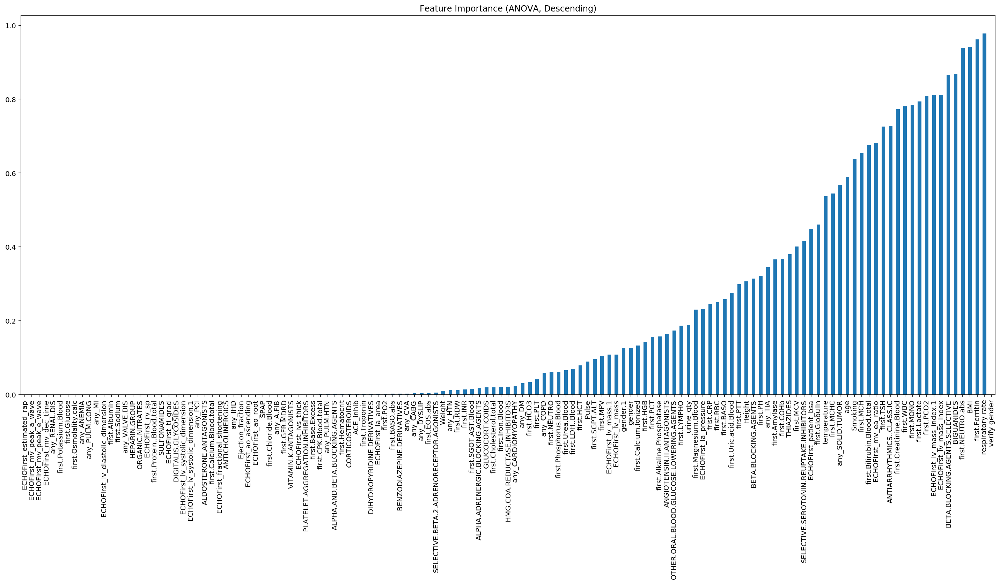

In [154]:

fig,ax = plt.subplots(figsize=(25,10))
order.plot.bar()
ax.set_title("Feature Importance (ANOVA, Descending)")

### 4.5.2 Correlation Coefficient Filtering 

### 4.5.2.1 Numerical Features 

### Kendall-Tau Correlation

In [55]:
from scipy.stats import kendalltau

In [56]:
def multivariate_kendallr(X, y):
    corrs,pvalues = [],[]
    for column_i in range(X.shape[1]):
        corr,pvalue = kendalltau(X[:,column_i],y)
        corrs.append(abs(corr))
        pvalues.append(pvalue)
    return (np.array(corrs),np.array(pvalues))

In [57]:
selector_kendall = SelectKBest(multivariate_kendallr, k=35)
selector_kendall.fit_transform(X_norm_numer, Y.ReadmissionFirst)

array([[0.36842105, 0.41664477, 0.47350574, ..., 0.28275862, 0.47368421,
        0.4109589 ],
       [0.38157895, 0.36693724, 0.19252874, ..., 0.16275862, 0.73684211,
        0.38356164],
       [0.23684211, 0.30454227, 0.5327972 , ..., 0.21655172, 1.        ,
        0.4109589 ],
       ...,
       [0.34210526, 0.33107238, 0.41145286, ..., 0.28896552, 0.36842105,
        0.42465753],
       [0.43421053, 0.02102047, 0.36494253, ..., 0.27310345, 0.73684211,
        0.36986301],
       [0.31578947, 0.32581727, 0.28735632, ..., 0.30137931, 0.73684211,
        0.49315068]])

In [58]:
# Get columns to keep and create new dataframe with those only
cols_kendall = selector_kendall.get_support(indices=True) #cols: boolean list for feature column selection 
                                  #selected feature column indices (indices = True)


selected_df_kendall = X_numer.iloc[cols_kendall]
selected_pvalues_kendall = selector_kendall.pvalues_[cols_kendall]


sort_index_kendall = np.argsort(-selected_pvalues_kendall)
sort_features_kendall = selected_df_kendall.columns[sort_index_kendall]
sort_selected_pvalues_kendall = selected_pvalues_kendall[sort_index_kendall]


for i in range(len(selected_pvalues_kendall)):
    print(i+1,'.','%-37s'%sort_features_kendall[i],'p-value:',sort_selected_pvalues_kendall[i])

1 . ECHOFirst_mv_peak_e_wave              p-value: 0.0019020049730789212
2 . first.PLT                             p-value: 0.0017838886279154986
3 . first.HGB                             p-value: 0.00021240205683659743
4 . first.NEUTRO                          p-value: 0.00021240205683659743
5 . first.GFR.MDRD                        p-value: 0.00013435871064718086
6 . ECHOFirst_lv_mass                     p-value: 8.681561340932986e-05
7 . first.Magnesium.Blood                 p-value: 7.747658882796893e-05
8 . first.Calcium.Blood.total             p-value: 5.257366402458405e-05
9 . first.HCT                             p-value: 3.115239218366981e-05
10 . respiratory rate                      p-value: 2.6056788096388034e-05
11 . first.Alkaline.Phosphatase            p-value: 2.5562201897247676e-05
12 . ECHOFirst_patient_bsa                 p-value: 8.014824422520272e-06
13 . first.RBC                             p-value: 7.610675007949289e-06
14 . first.COHb                           

Text(0.5, 1.0, 'Feature Importance (Continuous-Kendall, Descending)')

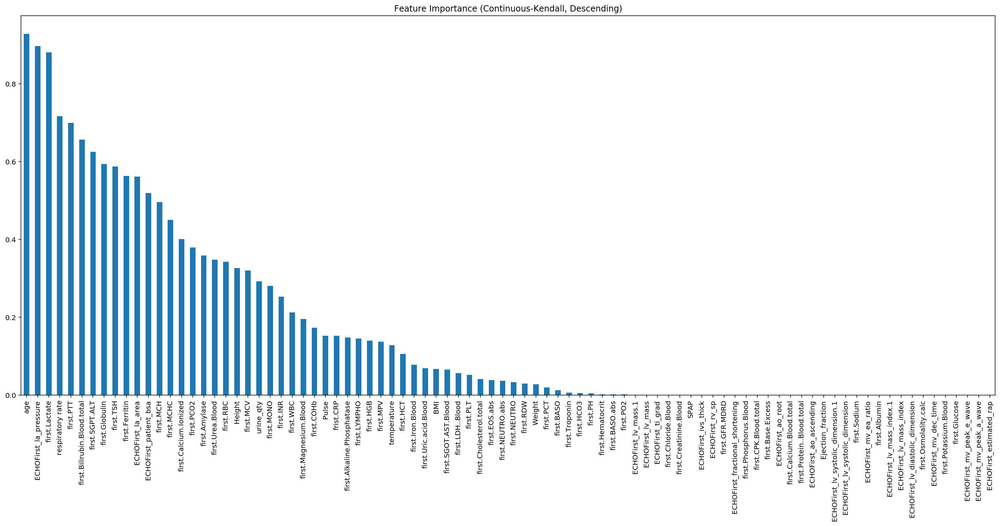

In [59]:
cols = selector_kendall.get_support(indices=True) #cols: boolean list for feature column selection 
                                  #selected feature column indices (indices = True)

col_ls = (selector_kendall.pvalues_).T.tolist()
feature_importance = pd.Series(col_ls,index = X_numer.columns)

order = feature_importance.map(lambda x:x).abs().sort_values(ascending = False)
order.to_dict()

fig,ax = plt.subplots(figsize=(25,10))
order.plot.bar()
ax.set_title("Feature Importance (Continuous-Kendall, Descending)")

### Pearson Correlation

In [60]:
from scipy.stats import pearsonr

In [61]:
def multivariate_pearsonr(X, y):
    corrs,pvalues = [],[]
    for column_i in range(X.shape[1]):
        corr,pvalue = pearsonr(X[:,column_i],y)
        corrs.append(abs(corr))
        pvalues.append(pvalue)
    return (np.array(corrs),np.array(pvalues))

In [62]:
selector_pearson = SelectKBest(multivariate_pearsonr, k=35)
selector_pearson.fit_transform(X_norm_numer, Y.ReadmissionFirst)

array([[0.0630137 , 0.36842105, 0.41664477, ..., 0.28275862, 0.47368421,
        0.4109589 ],
       [0.11506849, 0.38157895, 0.36693724, ..., 0.16275862, 0.73684211,
        0.38356164],
       [0.03013699, 0.23684211, 0.30454227, ..., 0.21655172, 1.        ,
        0.4109589 ],
       ...,
       [0.00547945, 0.34210526, 0.33107238, ..., 0.28896552, 0.36842105,
        0.42465753],
       [0.07671233, 0.43421053, 0.02102047, ..., 0.27310345, 0.73684211,
        0.36986301],
       [0.03835616, 0.31578947, 0.32581727, ..., 0.30137931, 0.73684211,
        0.49315068]])

In [63]:
# Get columns to keep and create new dataframe with those only
cols_pearson = selector_pearson.get_support(indices=True) #cols: boolean list for feature column selection 
                                  #selected feature column indices (indices = True)


selected_df_pearson = X_numer.iloc[cols_pearson]
selected_pvalues_pearson = selector_pearson.pvalues_[cols_pearson]


sort_index_pearson = np.argsort(-selected_pvalues_pearson)
sort_features_pearson= selected_df_pearson.columns[sort_index_pearson]
sort_selected_pvalues_pearson = selected_pvalues_pearson[sort_index_pearson]


for i in range(len(selected_pvalues_pearson)):
    print(i+1,'.','%-37s'%sort_features_pearson[i],'p-value:',sort_selected_pvalues_pearson[i])

1 . first.COHb                            p-value: 0.01337645924604842
2 . first.HCT                             p-value: 0.01211557189864059
3 . ECHOFirst_mv_peak_e_wave              p-value: 0.010213526921738478
4 . first.Calcium.Ionized                 p-value: 0.003743845364535323
5 . first.Calcium.Blood.total             p-value: 0.002363613667792482
6 . BMI                                   p-value: 0.0013170678897717145
7 . first.RBC                             p-value: 0.001263512882710145
8 . first.PTT                             p-value: 0.0006416896934313151
9 . Height                                p-value: 0.000368008805776948
10 . temperature                           p-value: 0.00015183180084216304
11 . first.PLT                             p-value: 5.0515008020520236e-05
12 . first.Urea.Blood                      p-value: 1.672215830087836e-05
13 . first.EOS.abs                         p-value: 8.684386037560534e-06
14 . ECHOFirst_lv_mass                     p-value: 1.

Text(0.5, 1.0, 'Feature Importance (Continuous-Pearson, Descending)')

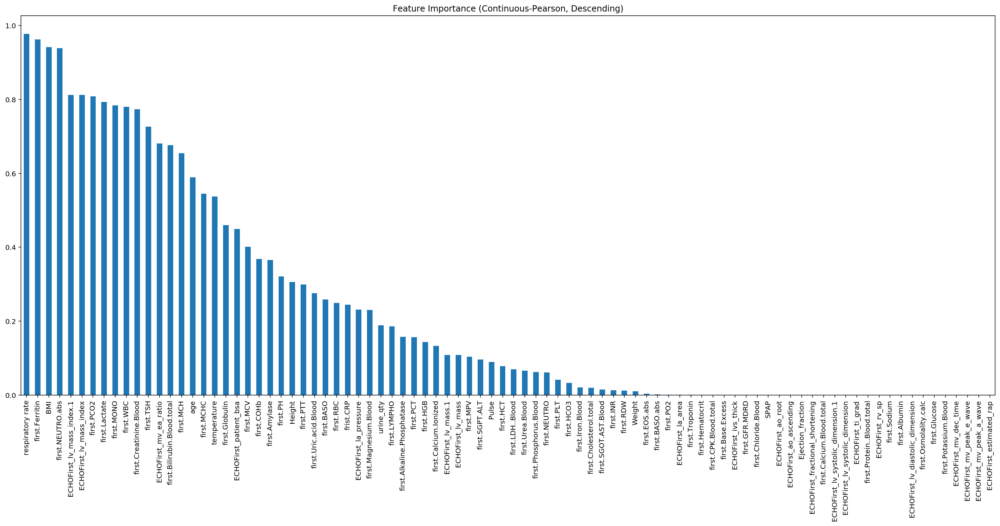

In [64]:
cols = selector_pearson.get_support(indices=True) #cols: boolean list for feature column selection 
                                  #selected feature column indices (indices = True)

col_ls = (selector_pearson.pvalues_).T.tolist()
feature_importance = pd.Series(col_ls,index = X_numer.columns)

order = feature_importance.map(lambda x:x).abs().sort_values(ascending = False)
order.to_dict()

fig,ax = plt.subplots(figsize=(25,10))
order.plot.bar()
ax.set_title("Feature Importance (Continuous-Pearson, Descending)")

### Spearman Correlation

In [65]:
from scipy.stats import spearmanr

In [66]:
def multivariate_spearmanr(X, y):
    corrs,pvalues = [],[]
    for column_i in range(X.shape[1]):
        corr,pvalue = spearmanr(X[:,column_i],y)
        corrs.append(abs(corr))
        pvalues.append(pvalue)
    return (np.array(corrs),np.array(pvalues))

In [67]:
selector_spearman = SelectKBest(multivariate_spearmanr, k=35)
selector_spearman.fit_transform(X_norm_numer, Y.ReadmissionFirst)

array([[0.36842105, 0.41664477, 0.47350574, ..., 0.28275862, 0.47368421,
        0.4109589 ],
       [0.38157895, 0.36693724, 0.19252874, ..., 0.16275862, 0.73684211,
        0.38356164],
       [0.23684211, 0.30454227, 0.5327972 , ..., 0.21655172, 1.        ,
        0.4109589 ],
       ...,
       [0.34210526, 0.33107238, 0.41145286, ..., 0.28896552, 0.36842105,
        0.42465753],
       [0.43421053, 0.02102047, 0.36494253, ..., 0.27310345, 0.73684211,
        0.36986301],
       [0.31578947, 0.32581727, 0.28735632, ..., 0.30137931, 0.73684211,
        0.49315068]])

In [68]:
# Get columns to keep and create new dataframe with those only
cols_spearman = selector_spearman.get_support(indices=True) #cols: boolean list for feature column selection 
                                  #selected feature column indices (indices = True)


selected_df_spearman = X_numer.iloc[cols_spearman]
selected_pvalues_spearman = selector_spearman.pvalues_[cols_spearman]


sort_index_spearman = np.argsort(-selected_pvalues_spearman)
sort_features_spearman= selected_df_spearman.columns[sort_index_spearman]
sort_selected_pvalues_spearman = selected_pvalues_spearman[sort_index_spearman]


for i in range(len(selected_pvalues_spearman)):
    print(i+1,'.','%-37s'%sort_features_spearman[i],'p-value:',sort_selected_pvalues_spearman[i])

1 . ECHOFirst_mv_peak_e_wave              p-value: 0.0018989246071938783
2 . first.PLT                             p-value: 0.0017809150101211072
3 . first.HGB                             p-value: 0.00021163023916413775
4 . first.NEUTRO                          p-value: 0.00021163023916413775
5 . first.GFR.MDRD                        p-value: 0.00013380006034382689
6 . ECHOFirst_lv_mass                     p-value: 8.64083377926605e-05
7 . first.Magnesium.Blood                 p-value: 7.71019387991248e-05
8 . first.Calcium.Blood.total             p-value: 5.2292693385153277e-05
9 . first.HCT                             p-value: 3.0963237127851644e-05
10 . respiratory rate                      p-value: 2.589182045746391e-05
11 . first.Alkaline.Phosphatase            p-value: 2.5399646403570883e-05
12 . ECHOFirst_patient_bsa                 p-value: 7.949263166236454e-06
13 . first.RBC                             p-value: 7.547760253431164e-06
14 . first.COHb                            

In [69]:
selector_spearman.pvalues_[cols_spearman]

array([1.13197048e-018, 2.53996464e-005, 4.07550872e-017, 1.55985648e-014,
       7.09290685e-027, 7.83090097e-008, 2.58918205e-005, 2.03979429e-010,
       2.11630239e-004, 5.72748000e-031, 2.96119139e-006, 1.33800060e-004,
       5.16591637e-011, 5.43341390e-011, 2.94142234e-011, 2.03979429e-010,
       2.94131710e-006, 1.78091501e-003, 1.89892461e-003, 7.96476583e-009,
       5.22926934e-005, 3.17450135e-008, 7.71019388e-005, 2.56101786e-014,
       3.09632371e-005, 2.50173994e-019, 2.94142234e-011, 7.94926317e-006,
       6.55827677e-007, 2.11630239e-004, 7.54776025e-006, 2.38598017e-008,
       1.52686489e-010, 3.21954820e-146, 8.64083378e-005])

Text(0.5, 1.0, 'Feature Importance (Continuous-Spearman, Descending)')

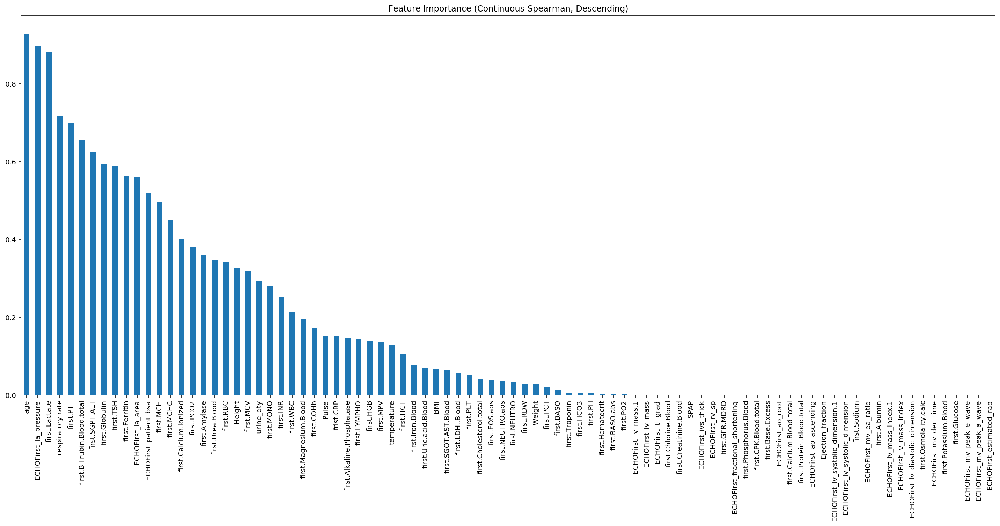

In [70]:
cols = selector_spearman.get_support(indices=True) #cols: boolean list for feature column selection 
                                  #selected feature column indices (indices = True)

col_ls = (selector_spearman.pvalues_).T.tolist()
feature_importance = pd.Series(col_ls,index = X_numer.columns)

order = feature_importance.map(lambda x:x).abs().sort_values(ascending = False)
order.to_dict()

fig,ax = plt.subplots(figsize=(25,10))
order.plot.bar()
ax.set_title("Feature Importance (Continuous-Spearman, Descending)")

### 4.5.2.2 Categorical Features 

### Chi-square

In [71]:
from sklearn.feature_selection import chi2

In [72]:
# Create and fit selector
selector_chi2 = SelectKBest(chi2, k=35)
selector_chi2.fit_transform(X_norm_categ, Y.ReadmissionFirst)

array([[1., 0., 1., ..., 0., 0., 0.],
       [1., 1., 0., ..., 0., 0., 0.],
       [1., 1., 1., ..., 1., 0., 0.],
       ...,
       [1., 1., 0., ..., 1., 0., 0.],
       [1., 1., 1., ..., 1., 0., 0.],
       [1., 1., 1., ..., 1., 0., 0.]])

In [73]:
# Get columns to keep and create new dataframe with those only
cols_chi2 = selector_chi2.get_support(indices=True) #cols: boolean list for feature column selection 
                                  #selected feature column indices (indices = True)

selected_df_chi2 = X_categ.iloc[:,cols_chi2]
selected_pvalues_chi2 = selector_chi2.pvalues_[cols_chi2]


sort_index = np.argsort(-selected_pvalues_chi2)
sort_features_chi2 = selected_df_chi2.columns[sort_index]
sort_selected_pvalues_chi2 = selected_pvalues_chi2[sort_index]


for i in range(len(selected_pvalues_chi2)):
    print(i+1,'.','%-37s'%sort_features_chi2[i],'p-value:',sort_selected_pvalues_chi2[i])

1 . ANGIOTENSIN.II.ANTAGONISTS            p-value: 0.24008870165184765
2 . HMG.COA.REDUCTASE.INHIBITORS          p-value: 0.23153342670492053
3 . OTHER.ORAL.BLOOD.GLUCOSE.LOWERING.AGENTS p-value: 0.1948237541608056
4 . any_HTN                               p-value: 0.17973827264324954
5 . any_DM                                p-value: 0.10183439617815243
6 . any_COPD                              p-value: 0.09278096740275346
7 . SULFONAMIDES                          p-value: 0.06501051440875971
8 . GLUCOCORTICOIDS                       p-value: 0.05250652545544254
9 . PLATELET.AGGREGATION.INHIBITORS       p-value: 0.043004853907966926
10 . ALPHA.ADRENERGIC.BLOCKING.AGENTS      p-value: 0.038637207701406405
11 . BENZODIAZEPINE.DERIVATIVES            p-value: 0.03730949737120874
12 . any_CARDIOMYOPATHY                    p-value: 0.03281406560206981
13 . any_DYSLIP                            p-value: 0.03185625566265532
14 . ACE_inhib                             p-value: 0.025442329034387

Text(0.5, 1.0, 'Feature Importance (Discrete-Chi2, Descending)')

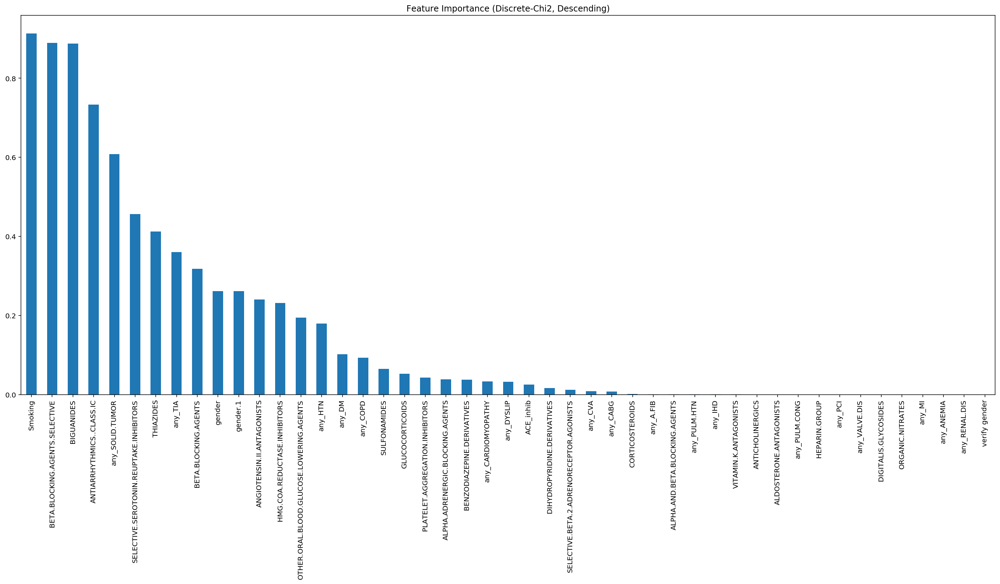

In [74]:
cols = selector_chi2.get_support(indices=True) #cols: boolean list for feature column selection 
                                  #selected feature column indices (indices = True)

col_ls = (selector_chi2.pvalues_).T.tolist()
feature_importance = pd.Series(col_ls,index = X_categ.columns)

order = feature_importance.map(lambda x:x).abs().sort_values(ascending = False)
order.to_dict()

fig,ax = plt.subplots(figsize=(25,10))
order.plot.bar()
ax.set_title("Feature Importance (Discrete-Chi2, Descending)")

### 4.5.3 Mutual Information and Maximal Information Coefficient (MIC)

In [75]:
from sklearn.feature_selection import mutual_info_classif as MIC
from minepy import MINE

In [78]:
def multivariate_mic(X, y):
    mics,pvalues = [],[]
    for column_i in range(X.shape[1]):
        m = MINE()
        m.compute_score(X[:,column_i],y)       
        mics.append(m.mic())
        pvalues.append(0.5)
    return (np.array(mics),np.array(pvalues))

In [79]:
# Create and fit selector
selector_mic = SelectKBest(multivariate_mic, k=35)
selector_mic.fit_transform(X_norm, Y.ReadmissionFirst)

array([[0.15921396, 0.14285714, 0.41664477, ..., 0.43831981, 0.31572771,
        0.47368421],
       [0.09665129, 0.10714286, 0.36693724, ..., 0.5491805 , 0.28169016,
        0.73684211],
       [0.4413475 , 0.17857143, 0.30454227, ..., 0.5491805 , 0.24295774,
        1.        ],
       ...,
       [0.13545218, 0.17857143, 0.33107238, ..., 0.48258212, 0.34624411,
        0.36842105],
       [0.64968919, 0.20587772, 0.02102047, ..., 0.5491805 , 0.31690142,
        0.73684211],
       [0.73821937, 0.03571429, 0.32581727, ..., 0.48770507, 0.28732395,
        0.73684211]])

For SelectKBest-MIC,selector_mic.scores_ is the MIC array for each feature in the X_norm.

In [80]:
# Get columns to keep and create new dataframe with those only
cols_mic = selector_mic.get_support(indices=True) #cols: boolean list for feature column selection 
                                  #selected feature column indices (indices = True)


selected_df_mic = X.iloc[:,cols_mic]
selected_features_mic = selector_mic.scores_[cols_mic]

sort_index = np.argsort(-selected_features_mic)
sort_features_mic = selected_df_mic.columns[sort_index]
sort_selected_scores_mic = selected_features_mic[sort_index]

for i in range(len(cols_mic)):
    print(i+1,'.','%-37s'%sort_features_mic[i],'MIC:',sort_selected_scores_mic[i])

1 . first.GFR.MDRD                        MIC: 0.12347405685662675
2 . ECHOFirst_lv_diastolic_dimension      MIC: 0.12222785079393181
3 . ECHOFirst_ao_ascending                MIC: 0.11550320902566821
4 . ECHOFirst_lv_systolic_dimension       MIC: 0.11345805137578556
5 . ECHOFirst_lv_systolic_dimension.1     MIC: 0.11345805137578556
6 . ECHOFirst_mv_ea_ratio                 MIC: 0.11324472571801064
7 . ECHOFirst_ao_root                     MIC: 0.11282763066876944
8 . ECHOFirst_mv_peak_a_wave              MIC: 0.10612228507486482
9 . ECHOFirst_ivs_thick                   MIC: 0.09881603030959332
10 . ECHOFirst_mv_dec_time                 MIC: 0.09641586862170906
11 . ECHOFirst_estimated_rap               MIC: 0.09520955416850925
12 . ECHOFirst_mv_peak_e_wave              MIC: 0.09475416183820272
13 . ECHOFirst_lv_mass_index               MIC: 0.08664516546681536
14 . ECHOFirst_lv_mass_index.1             MIC: 0.08664516546681536
15 . ECHOFirst_lv_mass.1                   MIC: 0.0855082

Text(0.5, 1.0, 'Feature Importance (MI-MIC, Descending)')

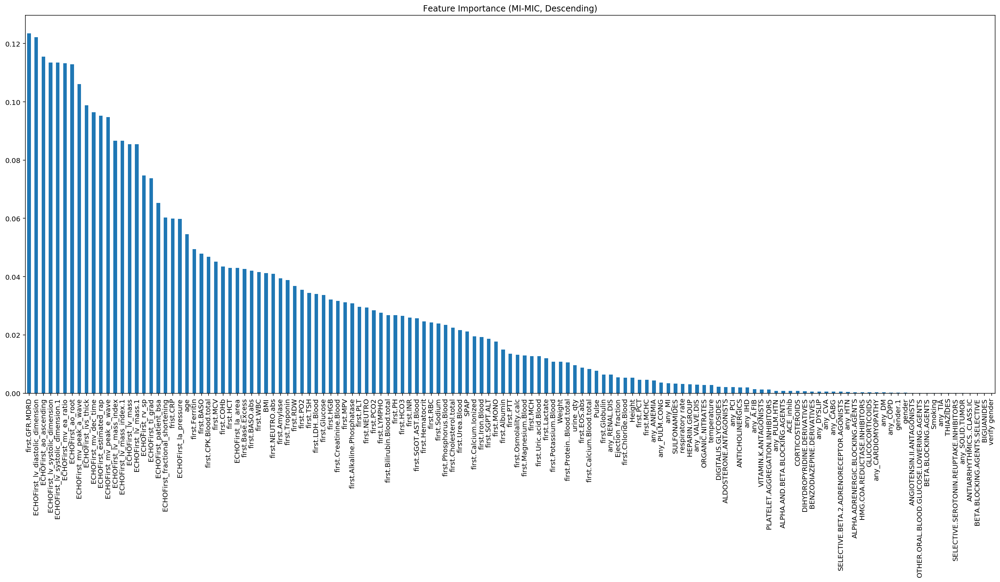

In [81]:
cols = selector_mic.get_support(indices=True) #cols: boolean list for feature column selection 
                                  #selected feature column indices (indices = True)

col_ls = (selector_mic.scores_).T.tolist()
feature_importance =pd.Series(col_ls,index = X.columns)

order = feature_importance.map(lambda x:x).abs().sort_values(ascending = False)
order.to_dict()

fig,ax = plt.subplots(figsize=(25,10))
order.plot.bar()
ax.set_title("Feature Importance (MI-MIC, Descending)")

### 4.5.4 Logistic Regression

### RFE

In [82]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

In [83]:
logreg = LogisticRegression(max_iter = 10000)
logreg.fit(X_norm,Y.ReadmissionFirst)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=10000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [84]:
rfe_logreg = RFE(logreg,n_features_to_select = 35)
rfe_logreg.fit_transform(X_norm, Y.ReadmissionFirst)

array([[0.13185185, 0.0630137 , 0.36470588, ..., 0.22372881, 0.28275862,
        0.47368421],
       [0.17333333, 0.11506849, 0.4       , ..., 0.18644068, 0.16275862,
        0.73684211],
       [0.15555556, 0.03013699, 0.48823529, ..., 0.29491525, 0.21655172,
        1.        ],
       ...,
       [0.17037037, 0.00547945, 0.48823529, ..., 0.20677966, 0.28896552,
        0.36842105],
       [0.1437037 , 0.07671233, 0.47058824, ..., 0.1220339 , 0.27310345,
        0.73684211],
       [0.15111111, 0.03835616, 0.47647059, ..., 0.14576271, 0.30137931,
        0.73684211]])

In [85]:
selected_features_rfe = X.columns[rfe_logreg.support_]
for i,feature in enumerate(selected_features_rfe):
    print(i+1,'.',feature)

1 . first.Calcium.Ionized
2 . first.EOS.abs
3 . Pulse
4 . first.Potassium.Blood
5 . first.GFR.MDRD
6 . temperature
7 . first.PCO2
8 . ECHOFirst_mv_dec_time
9 . first.Osmolality.calc
10 . first.PLT
11 . first.Calcium.Blood.total
12 . ECHOFirst_mv_peak_a_wave
13 . ECHOFirst_ti_grad
14 . first.PCT
15 . first.LDH..Blood
16 . first.Troponin
17 . Weight
18 . first.PO2
19 . Ejection_fraction
20 . first.MCHC
21 . SPAP
22 . first.SGPT.ALT
23 . first.Protein..Blood.total
24 . ECHOFirst_lv_diastolic_dimension
25 . ECHOFirst_ivs_thick
26 . first.Glucose
27 . SULFONAMIDES
28 . first.MCV
29 . ECHOFirst_ao_root
30 . first.Cholesterol.total
31 . first.Phosphorus.Blood
32 . ECHOFirst_ao_ascending
33 . first.Uric.acid.Blood
34 . first.Sodium
35 . ECHOFirst_estimated_rap


In [86]:
coef_list = (rfe_logreg.estimator_.coef_).T.tolist()
feature_importance = pd.Series(coef_list,index = X.columns[rfe_logreg.get_support(indices = True)])
order = feature_importance.map(lambda x:x[0]).abs().sort_values(ascending = False)
order_dict = order.to_dict()
for i,(key,value) in enumerate(order_dict.items()):
    print(i+1,'.','%-40s'%key,'Coefficient:',value)

1 . first.Osmolality.calc                    Coefficient: 3.177597030296003
2 . ECHOFirst_estimated_rap                  Coefficient: 2.800711613774199
3 . first.Glucose                            Coefficient: 2.437060435201907
4 . Weight                                   Coefficient: 1.5571577929661427
5 . first.MCHC                               Coefficient: 1.2344654397470216
6 . first.EOS.abs                            Coefficient: 1.2026425267622471
7 . first.Troponin                           Coefficient: 1.1135123787719958
8 . first.Potassium.Blood                    Coefficient: 1.091340741499476
9 . first.GFR.MDRD                           Coefficient: 1.0174670823346499
10 . ECHOFirst_lv_diastolic_dimension         Coefficient: 1.0133552305860314
11 . ECHOFirst_mv_dec_time                    Coefficient: 1.004921863604472
12 . ECHOFirst_ao_root                        Coefficient: 0.9550900540059267
13 . ECHOFirst_ti_grad                        Coefficient: 0.9388902680497028


### SelectFromModel

In [88]:
from sklearn.feature_selection import SelectFromModel

In [89]:
sfm_logreg = SelectFromModel(logreg)
sfm_logreg.fit_transform(X_norm, Y.ReadmissionFirst)

array([[0.13185185, 0.0630137 , 0.36470588, ..., 0.22372881, 0.28275862,
        0.47368421],
       [0.17333333, 0.11506849, 0.4       , ..., 0.18644068, 0.16275862,
        0.73684211],
       [0.15555556, 0.03013699, 0.48823529, ..., 0.29491525, 0.21655172,
        1.        ],
       ...,
       [0.17037037, 0.00547945, 0.48823529, ..., 0.20677966, 0.28896552,
        0.36842105],
       [0.1437037 , 0.07671233, 0.47058824, ..., 0.1220339 , 0.27310345,
        0.73684211],
       [0.15111111, 0.03835616, 0.47647059, ..., 0.14576271, 0.30137931,
        0.73684211]])

In [157]:
selected_features = X.columns[sfm_logreg.get_support(indices = True)]
for i, feature in enumerate(selected_features):
    print(i+1,' ',feature)

1   first.Calcium.Ionized
2   first.EOS.abs
3   Pulse
4   first.Potassium.Blood
5   first.GFR.MDRD
6   temperature
7   first.PCO2
8   ECHOFirst_mv_dec_time
9   first.Osmolality.calc
10   first.PLT
11   first.Calcium.Blood.total
12   first.HCT
13   Smoking
14   first.HGB
15   first.PH
16   first.INR
17   ECHOFirst_mv_peak_a_wave
18   ECHOFirst_ti_grad
19   first.PCT
20   first.LDH..Blood
21   first.Troponin
22   first.Base.Excess
23   Weight
24   first.PO2
25   Ejection_fraction
26   first.MCHC
27   SPAP
28   first.SGPT.ALT
29   first.MPV
30   first.Protein..Blood.total
31   ECHOFirst_lv_diastolic_dimension
32   ECHOFirst_ivs_thick
33   first.Glucose
34   SULFONAMIDES
35   first.MCV
36   ECHOFirst_ao_root
37   first.Cholesterol.total
38   first.Phosphorus.Blood
39   ECHOFirst_ao_ascending
40   first.Uric.acid.Blood
41   first.Sodium
42   ECHOFirst_estimated_rap


In [158]:
coef_list = (sfm_logreg.estimator_.coef_).T.tolist()
feature_importance = pd.Series(coef_list,index = X.columns)
order = feature_importance.map(lambda x:x[0]).abs().sort_values(ascending = False)
order_dict = order.to_dict()
for i,(key,value) in enumerate(order_dict.items()):
    print(i+1,' ',key,' ',value)

1   first.Osmolality.calc   3.253138833760971
2   first.Glucose   2.584224239381317
3   ECHOFirst_estimated_rap   2.5359788466151714
4   first.EOS.abs   1.4486933242415412
5   Weight   1.2800868470229188
6   first.MCHC   1.1650175855488711
7   ECHOFirst_lv_diastolic_dimension   1.1487942869626568
8   Pulse   1.114686580117791
9   first.PCO2   1.0112637491260428
10   first.Potassium.Blood   1.0055036599639928
11   ECHOFirst_mv_dec_time   0.9921015345751116
12   first.Calcium.Blood.total   0.9552595926970866
13   first.Troponin   0.9305002980072418
14   SPAP   0.9090259355434733
15   ECHOFirst_ao_ascending   0.8435926752807447
16   first.Sodium   0.8380485316933185
17   first.PCT   0.8121757612974971
18   ECHOFirst_ti_grad   0.7724666202974773
19   temperature   0.7674167020315713
20   first.Uric.acid.Blood   0.7543918123544745
21   ECHOFirst_mv_peak_a_wave   0.7297212671653023
22   ECHOFirst_ao_root   0.714325358745162
23   first.SGPT.ALT   0.6490977885149107
24   first.PLT   0.64262626

Text(0.5, 1.0, 'Feature Importance (LogReg-Ridge, Descending)')

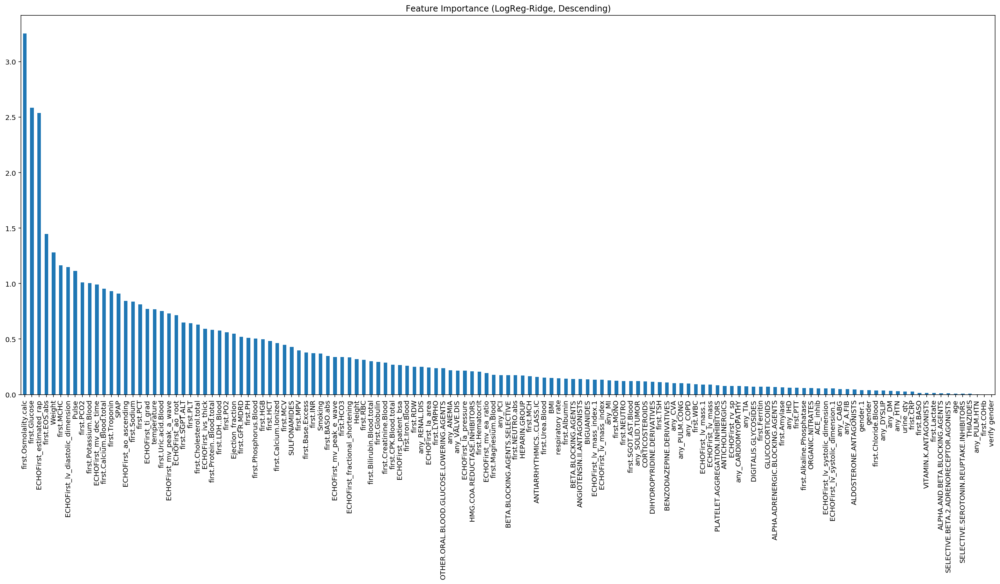

In [92]:

fig,ax = plt.subplots(figsize=(25,10))
order.plot.bar()
ax.set_title("Feature Importance (LogReg-Ridge, Descending)")

### 4.5.5 Logistic Regression-LASSO

### SelectFromModel

In [159]:
logreg_lasso = LogisticRegression(max_iter = 10000,penalty = 'l1',solver = 'liblinear')
logreg_lasso.fit(X_norm,Y.ReadmissionFirst)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=10000,
                   multi_class='auto', n_jobs=None, penalty='l1',
                   random_state=None, solver='liblinear', tol=0.0001, verbose=0,
                   warm_start=False)

In [160]:
sfm_logreg_lasso = SelectFromModel(logreg_lasso)
sfm_logreg_lasso.fit_transform(X_norm, Y.ReadmissionFirst)

array([[1.        , 0.13185185, 0.41346154, ..., 0.22372881, 0.        ,
        0.47368421],
       [0.        , 0.17333333, 0.26442308, ..., 0.18644068, 1.        ,
        0.73684211],
       [1.        , 0.15555556, 0.26923077, ..., 0.29491525, 1.        ,
        1.        ],
       ...,
       [0.        , 0.17037037, 0.22115385, ..., 0.20677966, 0.        ,
        0.36842105],
       [1.        , 0.1437037 , 0.36057692, ..., 0.1220339 , 1.        ,
        0.73684211],
       [1.        , 0.15111111, 0.77884615, ..., 0.14576271, 1.        ,
        0.73684211]])

In [161]:
selected_features = X.columns[sfm_logreg_lasso.get_support(indices = True)]
for i, feature in enumerate(selected_features):
    print(i+1,' ',feature)

1   HMG.COA.REDUCTASE.INHIBITORS
2   first.Calcium.Ionized
3   first.Alkaline.Phosphatase
4   first.EOS.abs
5   any_DYSLIP
6   Pulse
7   first.Potassium.Blood
8   respiratory rate
9   first.NEUTRO
10   any_CABG
11   any_IHD
12   any_DM
13   first.Ferritin
14   any_PULM.CONG
15   first.GFR.MDRD
16   temperature
17   ORGANIC.NITRATES
18   SELECTIVE.BETA.2.ADRENORECEPTOR.AGONISTS
19   any_CVA
20   first.PCO2
21   ECHOFirst_mv_dec_time
22   first.Osmolality.calc
23   first.PLT
24   any_ANEMIA
25   any_VALVE.DIS
26   ECHOFirst_mv_peak_e_wave
27   CORTICOSTEROIDS
28   BETA.BLOCKING.AGENTS.SELECTIVE
29   first.Calcium.Blood.total
30   first.Amylase
31   ALPHA.AND.BETA.BLOCKING.AGENTS
32   SELECTIVE.SEROTONIN.REUPTAKE.INHIBITORS
33   any_SOLID.TUMOR
34   first.Urea.Blood
35   PLATELET.AGGREGATION.INHIBITORS
36   Smoking
37   GLUCOCORTICOIDS
38   any_RENAL.DIS
39   any_A.FIB
40   first.RBC
41   first.Bilirubin.Blood.total
42   ECHOFirst_lv_mass
43   first.INR
44   first.Lactate
45   first.WBC
4

In [162]:
coef_list = (sfm_logreg_lasso.estimator_.coef_).T.tolist()
feature_importance = pd.Series(coef_list,index = X.columns)
order = feature_importance.map(lambda x:x[0]).abs().sort_values(ascending = False)
order_dict = order.to_dict()
for i,(key,value) in enumerate(order_dict.items()):
    print(i+1,' ',key,' ',value)

1   first.Osmolality.calc   4.517519276928498
2   first.Glucose   3.1820789831380423
3   ECHOFirst_estimated_rap   2.586577168109255
4   first.EOS.abs   1.7159702649541215
5   first.MCHC   1.4730856193259774
6   Weight   1.4274738080138754
7   ECHOFirst_lv_diastolic_dimension   1.0389700681696898
8   Pulse   1.0213745512595107
9   first.Calcium.Blood.total   1.009098173275916
10   ECHOFirst_mv_dec_time   0.99390308799717
11   SPAP   0.8826424027027661
12   first.Uric.acid.Blood   0.8655453200273379
13   first.Troponin   0.8388650544271957
14   first.Potassium.Blood   0.8087729904526626
15   first.PCO2   0.7732341509453616
16   ECHOFirst_ao_ascending   0.7298735177626164
17   ECHOFirst_mv_peak_a_wave   0.7291823546799491
18   ECHOFirst_ti_grad   0.7099398006548111
19   first.Cholesterol.total   0.6114036977150525
20   first.SGPT.ALT   0.5671847924740233
21   first.GFR.MDRD   0.5327993940644753
22   temperature   0.5254224727660912
23   first.PO2   0.5144865924195567
24   first.LDH..Bloo

Text(0.5, 1.0, 'Feature Importance (LogReg-Lasso, Descending)')

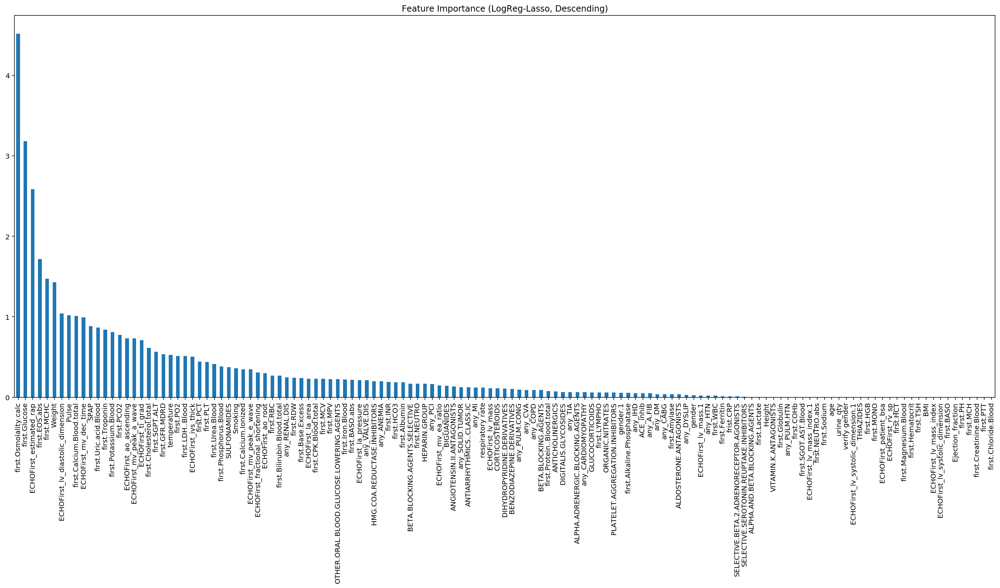

In [163]:
fig,ax = plt.subplots(figsize=(25,10))
order.plot.bar()
ax.set_title("Feature Importance (LogReg-Lasso, Descending)")

### 4.5.6 Random Forest

### SelectFromModel——Gini-Gain

In [100]:
from sklearn.ensemble import RandomForestClassifier

In [109]:
rfc= RandomForestClassifier(n_estimators = 100,random_state = 0)
rfc.fit(X_norm, Y.ReadmissionFirst)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=0, verbose=0,
                       warm_start=False)

In [111]:
coef_list = (rfc.feature_importances_).T.tolist()
feature_importance = pd.Series(coef_list,index = X.columns)
order = feature_importance.map(lambda x:x).abs().sort_values(ascending = False)
order_dict = order.to_dict()
for i,(key,value) in enumerate(order_dict.items()):
    print(i+1,' ',key,' ',value)

1   ECHOFirst_estimated_rap   0.04147893479989225
2   ECHOFirst_mv_peak_a_wave   0.022707828394554905
3   ECHOFirst_lv_mass_index   0.02081463503650957
4   ECHOFirst_lv_mass_index.1   0.01945292416934318
5   ECHOFirst_mv_dec_time   0.019389368552622258
6   ECHOFirst_mv_peak_e_wave   0.018224274588673747
7   ECHOFirst_mv_ea_ratio   0.015048755580431896
8   ECHOFirst_ti_grad   0.0137841633922045
9   ECHOFirst_lv_diastolic_dimension   0.01335092897432735
10   ECHOFirst_fractional_shortening   0.013304475794932906
11   ECHOFirst_la_pressure   0.012828065999093568
12   first.Amylase   0.01272140186705652
13   ECHOFirst_rv_sp   0.012695853079450441
14   ECHOFirst_lv_systolic_dimension.1   0.012373218775713435
15   first.MPV   0.0119158400948343
16   first.Glucose   0.011842446951198366
17   ECHOFirst_lv_mass   0.0117778127687619
18   ECHOFirst_lv_systolic_dimension   0.011761184145637293
19   ECHOFirst_ivs_thick   0.011485427155857843
20   ECHOFirst_la_area   0.011463233325851394
21   first.

In [112]:
selector_rf = SelectFromModel(rfc, threshold=0.0095)

# Train the selector
selector_rf.fit(X_norm,Y.ReadmissionFirst)

SelectFromModel(estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                                 class_weight=None,
                                                 criterion='gini',
                                                 max_depth=None,
                                                 max_features='auto',
                                                 max_leaf_nodes=None,
                                                 max_samples=None,
                                                 min_impurity_decrease=0.0,
                                                 min_impurity_split=None,
                                                 min_samples_leaf=1,
                                                 min_samples_split=2,
                                                 min_weight_fraction_leaf=0.0,
                                                 n_estimators=100, n_jobs=None,
                                                 oob_score=False,

In [113]:
cols_rf = selector_rf.get_support(indices = True) 

selected_features_rf = X.columns[cols_rf]

for i in range(len(cols_rf)):
    print(i+1,' ',selected_features_rf[i])

1   first.Calcium.Ionized
2   Pulse
3   first.Potassium.Blood
4   first.NEUTRO
5   first.Ferritin
6   first.GFR.MDRD
7   first.PCO2
8   ECHOFirst_mv_dec_time
9   first.Osmolality.calc
10   first.PLT
11   ECHOFirst_mv_peak_e_wave
12   first.Amylase
13   ECHOFirst_rv_sp
14   ECHOFirst_patient_bsa
15   first.MONO
16   ECHOFirst_lv_systolic_dimension.1
17   first.Bilirubin.Blood.total
18   ECHOFirst_lv_mass
19   first.INR
20   first.WBC
21   frist.CRP
22   ECHOFirst_la_pressure
23   ECHOFirst_mv_peak_a_wave
24   first.LYMPHO
25   first.CPK.Blood.total
26   ECHOFirst_ti_grad
27   first.LDH..Blood
28   first.Troponin
29   ECHOFirst_mv_ea_ratio
30   first.TSH
31   ECHOFirst_lv_mass_index
32   ECHOFirst_lv_systolic_dimension
33   first.Base.Excess
34   first.PO2
35   SPAP
36   first.SGPT.ALT
37   first.MPV
38   first.RDW
39   first.Creatinine.Blood
40   ECHOFirst_lv_diastolic_dimension
41   ECHOFirst_ivs_thick
42   first.Glucose
43   ECHOFirst_lv_mass_index.1
44   first.SGOT.AST.Blood
45   ECH

Text(0.5, 1.0, 'Feature Importance (Random Forest-Gini Gain, Descending)')

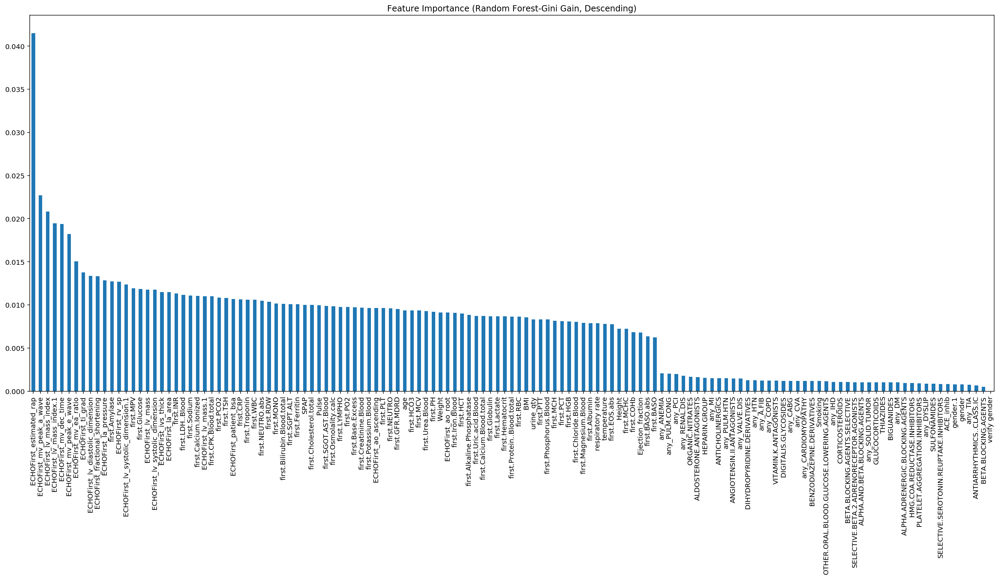

In [114]:
cols = selector_rf.get_support(indices=True) #cols: boolean list for feature column selection 
                                  #selected feature column indices (indices = True)

col_ls = (rfc.feature_importances_).T.tolist()
feature_importance =pd.Series(col_ls,index = X.columns)

order = feature_importance.map(lambda x:x).abs().sort_values(ascending = False)
order.to_dict()

fig,ax = plt.subplots(figsize=(25,10))
order.plot.bar()
ax.set_title("Feature Importance (Random Forest-Gini Gain, Descending)")

### SelectFromModel —— Information Gain

In [115]:
rfc_ig= RandomForestClassifier(n_estimators = 100,random_state = 0,criterion = 'entropy')
rfc_ig.fit(X_norm, Y.ReadmissionFirst)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='entropy', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=0, verbose=0,
                       warm_start=False)

In [116]:
coef_list = (rfc_ig.feature_importances_).T.tolist()
feature_importance = pd.Series(coef_list,index = X.columns)
order = feature_importance.map(lambda x:x).abs().sort_values(ascending = False)
order_dict = order.to_dict()
for i,(key,value) in enumerate(order_dict.items()):
    print(i+1,' ',key,' ',value)

1   ECHOFirst_estimated_rap   0.05830345199463146
2   ECHOFirst_mv_peak_a_wave   0.031767897126674445
3   ECHOFirst_mv_dec_time   0.023589146901577984
4   ECHOFirst_mv_peak_e_wave   0.022556137703762205
5   ECHOFirst_lv_mass_index   0.021446622425773384
6   ECHOFirst_lv_mass_index.1   0.01969149336718342
7   ECHOFirst_mv_ea_ratio   0.01875934854754249
8   ECHOFirst_lv_systolic_dimension.1   0.01695659181112795
9   ECHOFirst_lv_diastolic_dimension   0.014859261068248572
10   ECHOFirst_rv_sp   0.01339519442461251
11   ECHOFirst_lv_mass   0.01317345601616753
12   ECHOFirst_ti_grad   0.013053432380087115
13   ECHOFirst_lv_systolic_dimension   0.012511975746559892
14   ECHOFirst_lv_mass.1   0.011927199842604107
15   ECHOFirst_la_pressure   0.011849409156274845
16   first.Glucose   0.011619683253623779
17   ECHOFirst_fractional_shortening   0.011389200056758331
18   ECHOFirst_ivs_thick   0.011172700457256553
19   first.Osmolality.calc   0.011060382367057347
20   first.LDH..Blood   0.01033536

In [117]:
selector_rfig = SelectFromModel(rfc_ig, threshold=0.0085)

# Train the selector
selector_rfig.fit(X_norm,Y.ReadmissionFirst)

SelectFromModel(estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                                 class_weight=None,
                                                 criterion='entropy',
                                                 max_depth=None,
                                                 max_features='auto',
                                                 max_leaf_nodes=None,
                                                 max_samples=None,
                                                 min_impurity_decrease=0.0,
                                                 min_impurity_split=None,
                                                 min_samples_leaf=1,
                                                 min_samples_split=2,
                                                 min_weight_fraction_leaf=0.0,
                                                 n_estimators=100, n_jobs=None,
                                                 oob_score=Fal

In [170]:
cols_rfig = selector_rfig.get_support(indices = True) 

selected_features_rfig = X.columns[cols_rfig]

for i in range(len(cols_rfig)):
    print(i+1,' ',selected_features_rfig[i])

1   first.Calcium.Ionized
2   first.Alkaline.Phosphatase
3   Pulse
4   first.Potassium.Blood
5   first.NEUTRO
6   first.Ferritin
7   first.GFR.MDRD
8   first.PCO2
9   ECHOFirst_mv_dec_time
10   first.Osmolality.calc
11   first.PLT
12   ECHOFirst_mv_peak_e_wave
13   BMI
14   first.Amylase
15   first.HCT
16   ECHOFirst_rv_sp
17   first.Urea.Blood
18   ECHOFirst_patient_bsa
19   first.MONO
20   ECHOFirst_lv_systolic_dimension.1
21   first.PH
22   ECHOFirst_lv_mass
23   first.INR
24   first.WBC
25   frist.CRP
26   ECHOFirst_la_pressure
27   ECHOFirst_mv_peak_a_wave
28   first.LYMPHO
29   first.HCO3
30   first.CPK.Blood.total
31   ECHOFirst_ti_grad
32   first.Albumin
33   first.LDH..Blood
34   first.Troponin
35   ECHOFirst_mv_ea_ratio
36   first.TSH
37   ECHOFirst_lv_mass_index
38   ECHOFirst_lv_systolic_dimension
39   first.Base.Excess
40   Weight
41   first.PO2
42   SPAP
43   first.SGPT.ALT
44   age
45   first.MPV
46   first.RDW
47   first.Creatinine.Blood
48   ECHOFirst_lv_diastolic_dime

Text(0.5, 1.0, 'Feature Importance (Random Forest-Information Gain, Descending)')

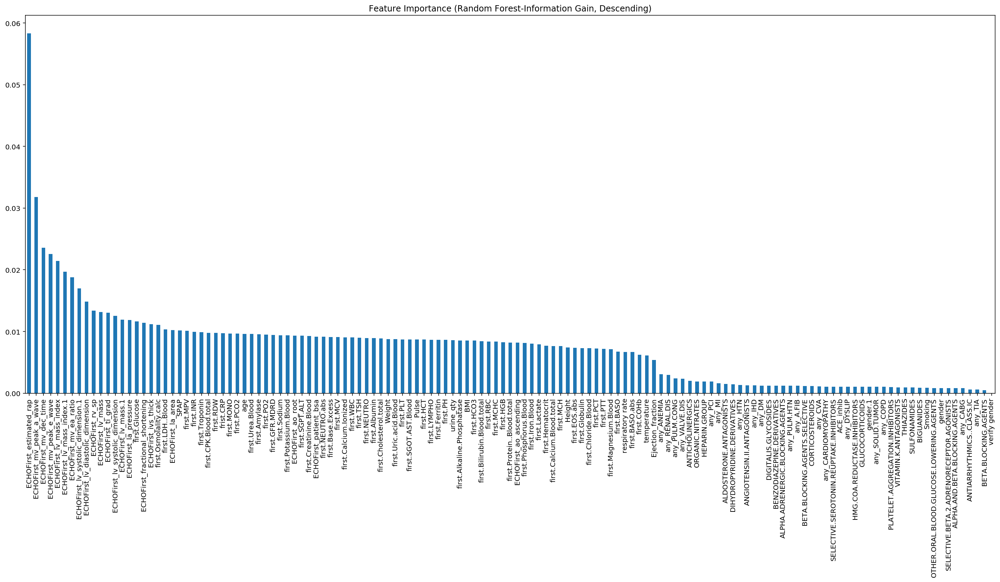

In [171]:
cols = selector_rfig.get_support(indices=True) #cols: boolean list for feature column selection 
                                  #selected feature column indices (indices = True)

col_ls = (rfc_ig.feature_importances_).T.tolist()
feature_importance =pd.Series(col_ls,index = X.columns)

order = feature_importance.map(lambda x:x).abs().sort_values(ascending = False)
order.to_dict()

fig,ax = plt.subplots(figsize=(25,10))
order.plot.bar()
ax.set_title("Feature Importance (Random Forest-Information Gain, Descending)")

### 4.5.7 GBDT

In [119]:
from sklearn.ensemble import GradientBoostingClassifier

In [120]:
gbdt= GradientBoostingClassifier(n_estimators = 100,random_state = 0)
gbdt.fit(X_norm, Y.ReadmissionFirst)

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=100,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=0, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [121]:
coef_list = (rfc_ig.feature_importances_).T.tolist()
feature_importance = pd.Series(coef_list,index = X.columns)
order = feature_importance.map(lambda x:x).abs().sort_values(ascending = False)
order_dict = order.to_dict()
for i,(key,value) in enumerate(order_dict.items()):
    print(i+1,' ',key,' ',value)

1   ECHOFirst_estimated_rap   0.05830345199463146
2   ECHOFirst_mv_peak_a_wave   0.031767897126674445
3   ECHOFirst_mv_dec_time   0.023589146901577984
4   ECHOFirst_mv_peak_e_wave   0.022556137703762205
5   ECHOFirst_lv_mass_index   0.021446622425773384
6   ECHOFirst_lv_mass_index.1   0.01969149336718342
7   ECHOFirst_mv_ea_ratio   0.01875934854754249
8   ECHOFirst_lv_systolic_dimension.1   0.01695659181112795
9   ECHOFirst_lv_diastolic_dimension   0.014859261068248572
10   ECHOFirst_rv_sp   0.01339519442461251
11   ECHOFirst_lv_mass   0.01317345601616753
12   ECHOFirst_ti_grad   0.013053432380087115
13   ECHOFirst_lv_systolic_dimension   0.012511975746559892
14   ECHOFirst_lv_mass.1   0.011927199842604107
15   ECHOFirst_la_pressure   0.011849409156274845
16   first.Glucose   0.011619683253623779
17   ECHOFirst_fractional_shortening   0.011389200056758331
18   ECHOFirst_ivs_thick   0.011172700457256553
19   first.Osmolality.calc   0.011060382367057347
20   first.LDH..Blood   0.01033536

In [122]:
selector_gbdt = SelectFromModel(gbdt)

# Train the selector
selector_gbdt.fit(X_norm,Y.ReadmissionFirst)

SelectFromModel(estimator=GradientBoostingClassifier(ccp_alpha=0.0,
                                                     criterion='friedman_mse',
                                                     init=None,
                                                     learning_rate=0.1,
                                                     loss='deviance',
                                                     max_depth=3,
                                                     max_features=None,
                                                     max_leaf_nodes=None,
                                                     min_impurity_decrease=0.0,
                                                     min_impurity_split=None,
                                                     min_samples_leaf=1,
                                                     min_samples_split=2,
                                                     min_weight_fraction_leaf=0.0,
                                               

In [125]:
cols_gbdt = selector_gbdt.get_support(indices = True) 

selected_features_gbdt = X.columns[cols_gbdt]

for i in range(len(cols_gbdt)):
    print(i+1,'.','%-37s'%selected_features_gbdt[i])

1 . first.Calcium.Ionized                
2 . Pulse                                
3 . first.PCO2                           
4 . ECHOFirst_mv_dec_time                
5 . first.Osmolality.calc                
6 . first.PLT                            
7 . ECHOFirst_mv_peak_e_wave             
8 . ECHOFirst_rv_sp                      
9 . first.Urea.Blood                     
10 . ECHOFirst_patient_bsa                
11 . ECHOFirst_la_pressure                
12 . ECHOFirst_mv_peak_a_wave             
13 . ECHOFirst_ti_grad                    
14 . first.LDH..Blood                     
15 . ECHOFirst_mv_ea_ratio                
16 . ECHOFirst_lv_mass_index              
17 . first.SGPT.ALT                       
18 . first.Creatinine.Blood               
19 . ECHOFirst_lv_diastolic_dimension     
20 . ECHOFirst_ivs_thick                  
21 . first.Glucose                        
22 . ECHOFirst_lv_mass_index.1            
23 . ECHOFirst_fractional_shortening      
24 . ECHOFirst_lv_ma

In [126]:
len(gbdt.feature_importances_)

135

Text(0.5, 1.0, 'Feature Importance (GBDT, Descending)')

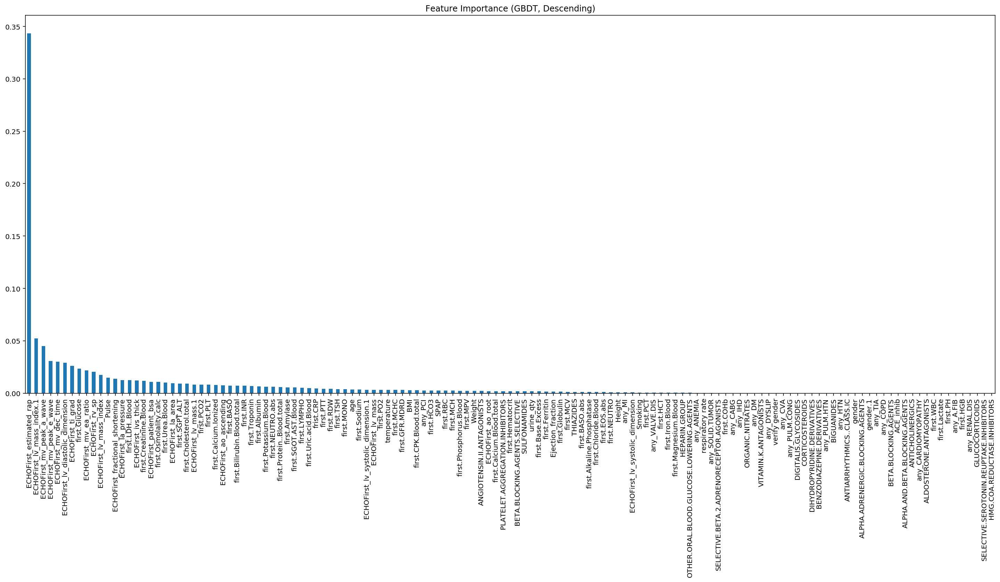

In [127]:
cols = selector_gbdt.get_support(indices=True) #cols: boolean list for feature column selection 
                                  #selected feature column indices (indices = True)

col_ls = (gbdt.feature_importances_).T.tolist()
feature_importance =pd.Series(col_ls,index = X.columns)

order = feature_importance.map(lambda x:x).abs().sort_values(ascending = False)
order.to_dict()

fig,ax = plt.subplots(figsize=(25,10))
order.plot.bar()
ax.set_title("Feature Importance (GBDT, Descending)")

### 4.5.8 Markov Blanket (Bayesian Network)

In [376]:
from pgmpy.estimators import HillClimbSearch
from pgmpy.estimators import K2Score, BicScore

In [377]:
min_max_scaler = preprocessing.MinMaxScaler()
# Data_norm -> X and Y
data_df_x_y = data_df_readmission[list(X_features)+list(Y_two_features)]
Data_norm = min_max_scaler.fit_transform(data_df_x_y)
Data_norm

array([[0.        , 0.56440678, 0.        , ..., 0.36842105, 0.        ,
        0.        ],
       [0.        , 0.49152542, 0.        , ..., 0.38157895, 0.        ,
        0.        ],
       [0.        , 0.23728814, 1.        , ..., 0.23684211, 0.        ,
        0.        ],
       ...,
       [0.        , 0.27457627, 0.        , ..., 0.34210526, 0.        ,
        1.        ],
       [0.        , 0.43050847, 0.        , ..., 0.43421053, 0.        ,
        1.        ],
       [0.        , 0.07118644, 0.        , ..., 0.31578947, 0.        ,
        1.        ]])

In [378]:
Data_norm = pd.DataFrame(Data_norm)
Data_norm.columns = data_df_x_y.columns

### 4.5.9 XGBoost

In [128]:
from sklearn.metrics import confusion_matrix
import xgboost as xgb
from xgboost import XGBClassifier

C:\Users\Yunge Li\Anaconda3\lib\site-packages\dask\dataframe\utils.py:15: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [129]:
X_norm_df = pd.DataFrame(X_norm)
X_norm_df.columns = data_df_readmission[list(X_features)].columns
X_norm_df.shape

(10763, 135)

In [130]:
xgb_model = xgb.XGBClassifier(objective="binary:logistic", random_state=42)
xgb_model.fit(X_norm_df, Y.ReadmissionFirst) 
y_pred = xgb_model.predict(X_norm_df)

In [131]:
print(confusion_matrix(Y.ReadmissionFirst, y_pred)) 

[[9737    0]
 [   0 1026]]


In [132]:
xgboost_fscore = xgb_model.get_booster().get_fscore() 
len(xgboost_fscore)

125

In [172]:
sort_orders = sorted(xgboost_fscore.items(), key=lambda x: x[1], reverse=True)
xgb_col = []
xgb_score = []
for i in range(len(sort_orders)):
    xgb_col.append(sort_orders[i][0])
    xgb_score.append(sort_orders[i][1])
feature_importance = pd.Series(xgb_score,index = xgb_col)
for i,(feature,ip) in enumerate(feature_importance.items()):
    print(i+1,' ',feature,' ',ip)

1   ECHOFirst_lv_mass_index   70
2   ECHOFirst_mv_peak_a_wave   68
3   ECHOFirst_mv_peak_e_wave   63
4   age   63
5   first.Glucose   62
6   first.LDH..Blood   60
7   ECHOFirst_la_pressure   60
8   ECHOFirst_estimated_rap   58
9   first.Cholesterol.total   58
10   ECHOFirst_mv_ea_ratio   55
11   ECHOFirst_la_area   54
12   first.TSH   53
13   ECHOFirst_mv_dec_time   53
14   first.WBC   51
15   ECHOFirst_lv_diastolic_dimension   51
16   first.MPV   51
17   first.PO2   51
18   first.Bilirubin.Blood.total   50
19   frist.CRP   50
20   first.MCV   49
21   first.CPK.Blood.total   49
22   first.Base.Excess   49
23   first.Troponin   46
24   ECHOFirst_patient_bsa   46
25   ECHOFirst_ti_grad   45
26   ECHOFirst_rv_sp   45
27   ECHOFirst_ivs_thick   45
28   first.Amylase   45
29   ECHOFirst_fractional_shortening   44
30   first.Sodium   44
31   Pulse   43
32   first.PLT   43
33   ECHOFirst_lv_mass   43
34   first.PCO2   43
35   first.Urea.Blood   43
36   ECHOFirst_ao_ascending   42
37   ECHOFir

In [134]:
selector_xgb = SelectFromModel(xgb_model)

# Train the selector
selector_xgb.fit(X_norm,Y.ReadmissionFirst)

SelectFromModel(estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                        colsample_bylevel=1, colsample_bynode=1,
                                        colsample_bytree=1, gamma=0, gpu_id=-1,
                                        importance_type='gain',
                                        interaction_constraints='',
                                        learning_rate=0.300000012,
                                        max_delta_step=0, max_depth=6,
                                        min_child_weight=1, missing=nan,
                                        monotone_constraints='()',
                                        n_estimators=100, n_jobs=0,
                                        num_parallel_tree=1,
                                        objective='binary:logistic',
                                        random_state=42, reg_alpha=0,
                                        reg_lambda=1, scale_pos_weight=1,
             

In [173]:
cols_xgb = selector_xgb.get_support(indices = True) 

selected_features_xgb = X.columns[cols_xgb]

for i in range(len(cols_xgb)):
    print(i+1,' ',selected_features_xgb[i])

1   Pulse
2   first.Globulin
3   respiratory rate
4   any_CABG
5   VITAMIN.K.ANTAGONISTS
6   any_PULM.CONG
7   SELECTIVE.BETA.2.ADRENORECEPTOR.AGONISTS
8   first.PCO2
9   ECHOFirst_mv_dec_time
10   first.Osmolality.calc
11   any_ANEMIA
12   any_VALVE.DIS
13   ECHOFirst_mv_peak_e_wave
14   CORTICOSTEROIDS
15   BETA.BLOCKING.AGENTS.SELECTIVE
16   BMI
17   ECHOFirst_rv_sp
18   ECHOFirst_patient_bsa
19   Smoking
20   ECHOFirst_lv_systolic_dimension.1
21   first.PH
22   first.INR
23   frist.CRP
24   ECHOFirst_la_pressure
25   ECHOFirst_mv_peak_a_wave
26   DIGITALIS.GLYCOSIDES
27   ECHOFirst_ti_grad
28   any_CARDIOMYOPATHY
29   first.LDH..Blood
30   ECHOFirst_mv_ea_ratio
31   ECHOFirst_lv_mass_index
32   first.Base.Excess
33   Weight
34   first.BASO
35   Ejection_fraction
36   SPAP
37   first.MCH
38   first.RDW
39   first.Creatinine.Blood
40   any_MI
41   ECHOFirst_lv_diastolic_dimension
42   first.Glucose
43   SULFONAMIDES
44   OTHER.ORAL.BLOOD.GLUCOSE.LOWERING.AGENTS
45   ANGIOTENSIN.II.AN

In [138]:
np.array(xgboost_fscore.keys())

array(dict_keys(['ECHOFirst_estimated_rap', 'first.LDH..Blood', 'first.NEUTRO.abs', 'first.Creatinine.Blood', 'Pulse', 'first.Glucose', 'first.Albumin', 'first.Cholesterol.total', 'first.SGPT.ALT', 'BETA.BLOCKING.AGENTS.SELECTIVE', 'Height', 'first.HGB', 'first.PTT', 'first.Hematocrit', 'first.PH', 'ECHOFirst_mv_ea_ratio', 'first.Bilirubin.Blood.total', 'any_DM', 'ECHOFirst_lv_mass_index', 'first.PLT', 'ECHOFirst_lv_mass', 'SPAP', 'first.MCV', 'first.TSH', 'first.Calcium.Ionized', 'ECHOFirst_ti_grad', 'first.HCO3', 'first.Potassium.Blood', 'first.Troponin', 'ECHOFirst_rv_sp', 'ECHOFirst_mv_dec_time', 'ECHOFirst_mv_peak_a_wave', 'ECHOFirst_ivs_thick', 'ECHOFirst_ao_ascending', 'first.Ferritin', 'first.PCO2', 'ECHOFirst_fractional_shortening', 'ECHOFirst_lv_systolic_dimension.1', 'any_MI', 'first.PCT', 'first.MONO', 'first.Amylase', 'first.Protein..Blood.total', 'first.Urea.Blood', 'first.HCT', 'ECHOFirst_patient_bsa', 'ECHOFirst_la_area', 'first.WBC', 'first.MCH', 'first.CPK.Blood.total

In [139]:
cols = selector_xgb.get_support(indices=True)
len(cols)

50

dict_values([70, 22, 24, 27, 32, 25, 29, 44, 25, 26, 38, 33, 19, 40, 41, 31, 32, 35, 11, 30, 23, 34, 27, 44, 33, 17, 24, 33, 33, 30, 34, 33, 9, 43, 20, 2, 28, 27, 20, 35, 22, 48, 4, 6, 38, 40, 39, 40, 20, 29, 25, 30, 23, 32, 12, 29, 20, 49, 49, 43, 29, 5, 21, 22, 30, 40, 28, 27, 33, 30, 30, 19, 14, 22, 46, 40, 29, 3, 42, 21, 42, 5, 23, 31, 5, 34, 6, 17, 39, 28, 30, 17, 6, 22, 3, 3, 3, 21, 3, 3, 2, 5, 7, 2, 4, 5, 2, 3, 3, 5, 6, 1, 2, 1, 1, 4, 7, 3, 3, 1, 1, 1, 2, 2, 1, 1, 1])

Text(0.5, 1.0, 'Feature Importance (XGBoost, Descending)')

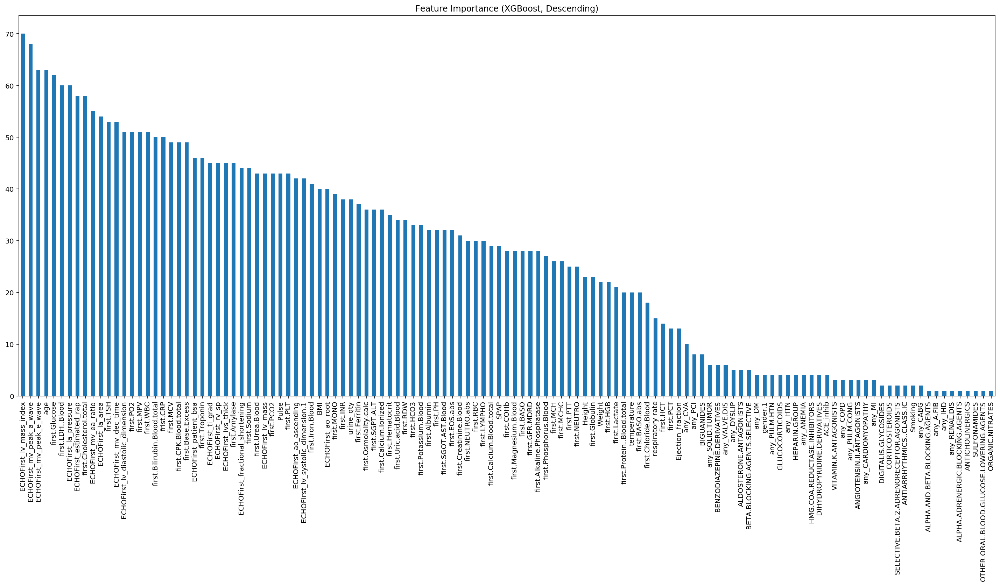

In [140]:
cols = selector_xgb.get_support(indices=True) #cols: boolean list for feature column selection 
                                  #selected feature column indices (indices = True)

col_ls = xgb_score
feature_importance =pd.Series(col_ls,index =xgb_col)

order = feature_importance.map(lambda x:x).abs().sort_values(ascending = False)
order.to_dict()

fig,ax = plt.subplots(figsize=(25,10))
order.plot.bar()
ax.set_title("Feature Importance (XGBoost, Descending)")

## 4.6 Prediction Modeling after Feature Selection (4ML Algo + MB + Expert)

In [118]:
final_X_norm

array([[0.        , 0.62685196, 0.        , ..., 0.        , 0.32894737,
        0.36734694],
       [0.        , 0.77666825, 0.        , ..., 1.        , 0.28947368,
        0.28571429],
       [1.        , 0.8097665 , 0.        , ..., 1.        , 0.35526316,
        0.32653061],
       ...,
       [0.        , 0.81933744, 1.        , ..., 1.        , 0.35526316,
        0.34693878],
       [1.        , 0.43744814, 0.        , ..., 1.        , 0.30263158,
        0.28571429],
       [1.        , 0.70315278, 1.        , ..., 1.        , 0.21052632,
        0.28571429]])

In [119]:
Y.ReadmissionFirst

0        0
1        0
2        0
3        0
4        0
        ..
10758    0
10759    1
10760    0
10761    0
10762    0
Name: ReadmissionFirst, Length: 10763, dtype: int64

In [120]:
final_X_norm_df = pd.DataFrame(final_X_norm)
final_X_norm_df.columns = final_X.columns

In [121]:
final_X_norm_df

,ACE_inhib,age,ALDOSTERONE.ANTAGONISTS,any_A.FIB,any_ANEMIA,any_DM,any_HTN,any_MI,any_PCI,any_PULM.CONG,...,first.Uric.acid.Blood,first.WBC,frist.CRP,gender,Pulse,Smoking,SPAP,SULFONAMIDES,temperature,Weight
0,0.0,0.626852,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,...,0.223729,0.133529,0.251429,0.0,0.364706,0.0,0.253968,0.0,0.328947,0.367347
1,0.0,0.776668,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,...,0.186441,0.271048,0.251421,1.0,0.400000,0.5,0.603175,1.0,0.289474,0.285714
2,1.0,0.809767,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,...,0.294915,0.219609,0.499593,1.0,0.488235,0.5,0.523178,1.0,0.355263,0.326531
3,0.0,0.619800,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,...,0.271186,0.150325,0.026990,0.0,0.394118,0.0,0.523178,1.0,0.434211,0.306122
4,1.0,0.672751,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,0.155932,0.148226,0.208642,0.0,0.370588,0.5,0.698413,1.0,0.368421,0.326531
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10758,1.0,0.520979,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,...,0.179661,0.404997,0.023066,0.0,0.411765,0.5,0.730159,1.0,0.276316,0.293878
10759,1.0,0.703597,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,...,0.237288,0.149066,0.026176,1.0,0.394118,0.5,0.619048,1.0,0.250000,0.265306
10760,0.0,0.819337,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,...,0.206780,0.196725,0.588458,0.0,0.488235,0.5,0.523178,1.0,0.355263,0.346939
10761,1.0,0.437448,0.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,...,0.122034,0.114424,0.026607,0.0,0.470588,0.0,0.539683,1.0,0.302632,0.285714


### 4.6.1 Feature Selection based on Intercorrelation (Elimination of Multicollinearity)

In [122]:
final_numer_var = set.intersection(set(numer_var_clean),set(final_feature_list))
final_categ_var = set.intersection(set(categ_var_clean),set(final_feature_list))

In [123]:
len(final_numer_var)

68

In [124]:
len(final_categ_var)

14

In [125]:
len(final_feature_list)

82

#### Numerical x Numerical

In [128]:
numnum = final_X_norm_df[final_numer_var]

In [129]:
numnum.shape

(10763, 68)

In [133]:
numnum_corr = numnum.corr('pearson')

In [134]:
numnum_corr.style.background_gradient(cmap='coolwarm')

In [ ]:
numnum_corr[numnum_corr]

In [165]:
numnum_corr.loc['BMI','Weight']

0.09434115584250902

We notice that Pearson Correlation doesn't work well here. It cannot detect the correlations between features successfully.


Instead, we use spearman correlation here.

In [166]:
numnum_corr2 = numnum.corr('spearman')
numnum_corr2.style.background_gradient(cmap='coolwarm')

In [168]:
numnum_corr2.loc['BMI','Weight']

0.8274769597467322

In [178]:
numnum_corr2[numnum_corr2 >= 0.75].style.applymap(lambda x: 'color: red' if pd.notnull(x) else '')

,first.Creatinine.Blood,first.Troponin,first.Phosphorus.Blood,first.LDH..Blood,SPAP,first.Cholesterol.total,ECHOFirst_lv_systolic_dimension,ECHOFirst_lv_mass,first.SGOT.AST.Blood,first.Bilirubin.Blood.total,first.Calcium.Blood.total,ECHOFirst_mv_peak_e_wave,first.NEUTRO.abs,ECHOFirst_mv_ea_ratio,first.Urea.Blood,first.PCO2,temperature,first.Sodium,first.Osmolality.calc,first.WBC,first.Calcium.Ionized,ECHOFirst_mv_peak_a_wave,first.RDW,first.Base.Excess,first.PCT,ECHOFirst_lv_mass.1,age,ECHOFirst_mv_dec_time,first.EOS.abs,Weight,ECHOFirst_lv_diastolic_dimension,first.MPV,ECHOFirst_ti_grad,first.INR,first.PLT,first.PO2,first.Albumin,ECHOFirst_rv_sp,first.Lactate,ECHOFirst_lv_mass_index.1,ECHOFirst_estimated_rap,first.RBC,first.Uric.acid.Blood,BMI,ECHOFirst_la_pressure,Ejection_fraction,ECHOFirst_lv_systolic_dimension.1,first.TSH,first.SGPT.ALT,ECHOFirst_lv_mass_index,first.CPK.Blood.total,Pulse,frist.CRP,ECHOFirst_ivs_thick,ECHOFirst_ao_root,first.Potassium.Blood,ECHOFirst_patient_bsa,first.BASO.abs,first.Amylase,ECHOFirst_ao_ascending,ECHOFirst_fractional_shortening,first.MCHC,first.MONO,first.MCV,first.Glucose,first.GFR.MDRD,first.HGB,ECHOFirst_la_area
first.Creatinine.Blood,1.000000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.774166,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
first.Troponin,nan,1.000000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
first.Phosphorus.Blood,nan,nan,1.000000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
first.LDH..Blood,nan,nan,nan,1.000000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
SPAP,nan,nan,nan,nan,1.000000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
first.Cholesterol.total,nan,nan,nan,nan,nan,1.000000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
ECHOFirst_lv_systolic_dimension,nan,nan,nan,nan,nan,nan,1.000000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.792566,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,1.000000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
ECHOFirst_lv_mass,nan,nan,nan,nan,nan,nan,nan,1.000000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,1.000000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
first.SGOT.AST.Blood,nan,nan,nan,nan,nan,nan,nan,nan,1.000000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
first.Bilirubin.Blood.total,nan,nan,nan,nan,nan,nan,nan,nan,nan,1.000000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,n

In [195]:
numnum_corr2_filter = numnum_corr2[numnum_corr2 >= 0.75]
# for index in numnum_corr2_filter.index:
#     for col in numnum_corr2_filter.columns:
#         if (numnum_corr2_filter.loc[index,col] >0) and (index != col):
#             print(index,'——',col)
for i in range(len(numnum_corr2_filter.index)):
    for j in range(i):
        if (numnum_corr2_filter.iloc[i,j] >0) and (i != j):
            if numnum_corr2_filter.iloc[i,j] ==1:
                print(numnum_corr2_filter.index[i],'==',numnum_corr2_filter.columns[j],':',numnum_corr2_filter.iloc[i,j])
            else:
                print(numnum_corr2_filter.index[i],'|',numnum_corr2_filter.columns[j],':',numnum_corr2_filter.iloc[i,j] )

first.Urea.Blood | first.Creatinine.Blood : 0.7741662642852957
first.WBC | first.NEUTRO.abs : 0.9354732980947452
ECHOFirst_lv_mass.1 == ECHOFirst_lv_mass : 1.0
ECHOFirst_lv_diastolic_dimension | ECHOFirst_lv_systolic_dimension : 0.792565549837603
first.PLT | first.PCT : 0.8939359961870531
ECHOFirst_rv_sp | ECHOFirst_ti_grad : 0.873833262618277
BMI | Weight : 0.8274769597467322
ECHOFirst_lv_systolic_dimension.1 == ECHOFirst_lv_systolic_dimension : 1.0
ECHOFirst_lv_systolic_dimension.1 | ECHOFirst_lv_diastolic_dimension : 0.792565549837603
ECHOFirst_lv_mass_index == ECHOFirst_lv_mass_index.1 : 1.0
ECHOFirst_patient_bsa | Weight : 0.830263039965206
first.HGB | first.RBC : 0.8424556398838463


In [196]:
exclude1 = ['first.Creatinine.Blood','first.WBC','ECHOFirst_lv_mass.1','ECHOFirst_lv_diastolic_dimension','first.PLT','Weight','ECHOFirst_rv_sp','ECHOFirst_lv_systolic_dimension.1','ECHOFirst_lv_mass_index.1','first.HGB']

#### Categorical x Categorical 

In [131]:
catcat= final_X_norm_df[final_categ_var]

In [132]:
catcat.shape

(10763, 14)

In [146]:
from scipy.stats import chisquare

catcat2=catcat.apply(lambda x : pd.factorize(x)[0])+1
catcat2.columns = catcat.columns

catcat_corr = pd.DataFrame([chisquare(catcat2[x].values,f_exp=catcat2.values.T,axis=1)[0] for x in catcat2])
catcat_corr.columns = catcat.columns
catcat_corr.index = catcat.columns.T
(-catcat_corr).style.background_gradient(cmap='coolwarm')

,Smoking,ALDOSTERONE.ANTAGONISTS,ACE_inhib,any_PCI,any_MI,any_A.FIB,any_HTN,gender,any_DM,any_ANEMIA,SULFONAMIDES,any_PULM.CONG,BETA.BLOCKING.AGENTS.SELECTIVE,any_RENAL.DIS
Smoking,-0.000000,-6138.500000,-4574.000000,-8117.500000,-7027.000000,-5190.500000,-7219.000000,-5166.000000,-4387.000000,-4404.500000,-1321.000000,-4763.500000,-3607.000000,-5150.000000
ALDOSTERONE.ANTAGONISTS,-3395.500000,-0.000000,-3320.000000,-3872.500000,-3839.000000,-3383.500000,-3946.500000,-4028.500000,-3849.000000,-3701.500000,-2911.500000,-4102.000000,-3495.500000,-3693.500000
ACE_inhib,-2812.000000,-4285.000000,-0.000000,-5106.500000,-4488.000000,-4365.500000,-5386.000000,-4676.000000,-4237.000000,-3993.500000,-2483.500000,-4038.500000,-3816.000000,-4194.000000
any_PCI,-4239.500000,-2751.500000,-3020.500000,-0.000000,-1507.000000,-3267.000000,-2982.500000,-3586.500000,-3759.500000,-3615.000000,-4124.000000,-3186.000000,-3797.500000,-2939.500000
any_MI,-3771.500000,-3326.500000,-3010.500000,-2115.500000,-0.000000,-3654.500000,-3736.000000,-3960.500000,-3974.500000,-3939.500000,-3643.000000,-3072.500000,-3813.000000,-2983.500000
any_A.FIB,-2857.000000,-3785.000000,-3802.000000,-4789.500000,-4568.500000,-0.000000,-4761.500000,-3907.500000,-3644.000000,-4024.500000,-2790.500000,-3700.500000,-3839.500000,-3697.000000
any_HTN,-3887.000000,-3349.500000,-3824.000000,-3506.500000,-3651.500000,-3763.000000,-0.000000,-3604.000000,-2701.500000,-3077.500000,-3919.500000,-3826.000000,-3063.500000,-4020.500000
gender,-2775.000000,-4368.500000,-4051.000000,-5047.500000,-4813.000000,-3846.000000,-4541.000000,-0.000000,-3542.000000,-3906.000000,-3072.500000,-3330.000000,-3839.500000,-4463.500000
any_DM,-2619.500000,-4804.500000,-4227.500000,-5836.000000,-5442.500000,-4198.000000,-4254.000000,-4157.500000,-0.000000,-3289.000000,-2812.500000,-4210.000000,-3266.000000,-4952.000000
any_ANEMIA,-2777.500000,-4797.500000,-4124.500000,-5832.000000,-5548.000000,-4719.000000,-4770.500000,-4662.000000,-3429.500000,-0.000000,-2700.500000,-4570.500000,-3245.500000,-5455.000000


#### Numerical x Categorical


In [148]:
final_X_norm_df_corr = final_X_norm_df.corr('kendall')
final_X_norm_df_corr.style.background_gradient(cmap='coolwarm')

In [157]:
final_X_norm_df_corr.iloc[1:,]

,ACE_inhib,age,ALDOSTERONE.ANTAGONISTS,any_A.FIB,any_ANEMIA,any_DM,any_HTN,any_MI,any_PCI,any_PULM.CONG,...,first.Uric.acid.Blood,first.WBC,frist.CRP,gender,Pulse,Smoking,SPAP,SULFONAMIDES,temperature,Weight
age,-0.083975,1.000000,-0.144822,0.093072,0.039536,-0.160672,0.087954,-0.003622,-0.114576,0.140404,...,0.044905,0.045115,0.058251,0.149348,-0.009497,0.197826,0.061560,0.046851,0.073053,-0.177820
ALDOSTERONE.ANTAGONISTS,0.092272,-0.144822,1.000000,0.102176,0.011900,0.042789,-0.007756,0.032928,0.064952,-0.096298,...,0.060026,-0.048758,-0.084206,-0.058637,-0.016622,-0.007703,0.055913,0.191482,-0.061296,0.072260
any_A.FIB,-0.002998,0.093072,0.102176,1.000000,0.073052,-0.037632,0.090101,-0.045897,-0.044450,0.045441,...,0.025864,-0.032669,-0.009383,0.034886,0.002925,0.096972,0.061889,0.110656,-0.005858,0.016434
any_ANEMIA,0.036903,0.039536,0.011900,0.073052,1.000000,0.142721,0.128274,0.106661,0.059762,0.103812,...,0.031004,-0.028301,0.021717,0.046240,-0.047441,0.063151,0.034158,0.076296,0.024819,-0.030917
any_DM,0.072407,-0.160672,0.042789,-0.037632,0.142721,1.000000,0.225754,0.118967,0.125226,0.026444,...,0.036701,0.019767,-0.021399,-0.059014,-0.036107,-0.040309,0.010018,0.079290,-0.011244,0.172845
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Smoking,-0.040463,0.197826,-0.007703,0.096972,0.063151,-0.040309,0.040247,-0.016521,-0.044990,0.037188,...,0.009503,-0.023678,0.004053,0.147617,-0.029071,1.000000,0.035046,0.043552,0.029693,-0.075339
SPAP,-0.021027,0.061560,0.055913,0.061889,0.034158,0.010018,-0.000244,-0.014762,-0.051216,0.016065,...,0.089986,0.004120,0.013053,0.025082,-0.000574,0.035046,1.000000,0.063820,0.018959,-0.013639
SULFONAMIDES,0.063518,0.046851,0.191482,0.110656,0.076296,0.079290,0.068251,0.035212,0.023326,0.077097,...,0.108123,-0.019833,-0.039851,0.006708,-0.018147,0.043552,0.063820,1.000000,-0.036759,0.023765
temperature,-0.020127,0.073053,-0.061296,-0.005858,0.024819,-0.011244,0.010713,-0.014920,-0.058975,0.067610,...,-0.010198,0.071224,0.064792,0.076500,0.073465,0.029693,0.018959,-0.036759,1.000000,-0.041592


In [161]:
numcat = final_X_norm_df_corr.loc[final_numer_var,final_categ_var]
numcat.style.background_gradient(cmap='coolwarm')

,Smoking,ALDOSTERONE.ANTAGONISTS,ACE_inhib,any_PCI,any_MI,any_A.FIB,any_HTN,gender,any_DM,any_ANEMIA,SULFONAMIDES,any_PULM.CONG,BETA.BLOCKING.AGENTS.SELECTIVE,any_RENAL.DIS
first.Creatinine.Blood,0.004333,-0.040835,-0.036465,0.022582,0.082259,0.005978,0.063993,-0.198456,0.095472,0.114104,0.035742,0.025735,0.015631,0.425738
first.Troponin,0.006506,-0.024268,0.003669,0.019647,0.132116,-0.036894,-0.045407,-0.041916,-0.020541,-0.009865,-0.019842,0.040897,-0.023532,0.058120
first.Phosphorus.Blood,-0.032803,-0.027451,-0.004877,0.003687,0.023518,-0.045310,0.034565,0.034693,0.078447,0.044636,-0.001379,0.026614,0.007305,0.125610
first.LDH..Blood,-0.000742,-0.006433,-0.027153,-0.023309,0.008745,0.019775,-0.050828,0.058667,-0.065575,-0.047075,0.007892,0.006072,-0.016137,-0.001226
SPAP,0.035046,0.055913,-0.021027,-0.051216,-0.014762,0.061889,-0.000244,0.025082,0.010018,0.034158,0.063820,0.016065,-0.006510,0.070477
first.Cholesterol.total,-0.005078,-0.049743,0.004595,-0.018141,-0.022607,-0.046419,0.008300,0.145383,-0.053493,-0.050278,-0.041205,0.060525,-0.004192,-0.076617
ECHOFirst_lv_systolic_dimension,-0.078363,0.127995,0.076285,0.082350,0.121673,-0.030439,-0.054728,-0.271840,0.046239,-0.044987,0.042973,-0.076550,-0.094901,0.059179
ECHOFirst_lv_mass,-0.033874,0.051612,0.043426,0.046465,0.080022,0.009316,0.023802,-0.197317,0.056827,0.005123,0.035996,0.002327,-0.021800,0.086887
first.SGOT.AST.Blood,0.026441,0.026964,-0.017556,-0.013264,0.007047,0.041969,-0.066761,0.008298,-0.099553,-0.076486,-0.012084,-0.024755,-0.019323,-0.044010
first.Bilirubin.Blood.total,0.028046,0.124433,0.010910,-0.017563,-0.018188,0.114338,-0.068843,-0.137487,-0.089406,-0.061687,0.042646,-0.081924,-0.024219,-0.018922


In [197]:
numcat[numcat >= 0.75].style.applymap(lambda x: 'color: red' if pd.notnull(x) else '')

,Smoking,ALDOSTERONE.ANTAGONISTS,ACE_inhib,any_PCI,any_MI,any_A.FIB,any_HTN,gender,any_DM,any_ANEMIA,SULFONAMIDES,any_PULM.CONG,BETA.BLOCKING.AGENTS.SELECTIVE,any_RENAL.DIS
first.Creatinine.Blood,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
first.Troponin,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
first.Phosphorus.Blood,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
first.LDH..Blood,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
SPAP,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
first.Cholesterol.total,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
ECHOFirst_lv_systolic_dimension,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
ECHOFirst_lv_mass,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
first.SGOT.AST.Blood,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
first.Bilirubin.Blood.total,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan


In [199]:
final_feature_list_after_corr = set(final_feature_list) - set(exclude1)
len(final_feature_list_after_corr)

72

In [200]:
final_feature_list_after_corr

{'ACE_inhib',
 'ALDOSTERONE.ANTAGONISTS',
 'BETA.BLOCKING.AGENTS.SELECTIVE',
 'BMI',
 'ECHOFirst_ao_ascending',
 'ECHOFirst_ao_root',
 'ECHOFirst_estimated_rap',
 'ECHOFirst_fractional_shortening',
 'ECHOFirst_ivs_thick',
 'ECHOFirst_la_area',
 'ECHOFirst_la_pressure',
 'ECHOFirst_lv_mass',
 'ECHOFirst_lv_mass_index',
 'ECHOFirst_lv_systolic_dimension',
 'ECHOFirst_mv_dec_time',
 'ECHOFirst_mv_ea_ratio',
 'ECHOFirst_mv_peak_a_wave',
 'ECHOFirst_mv_peak_e_wave',
 'ECHOFirst_patient_bsa',
 'ECHOFirst_ti_grad',
 'Ejection_fraction',
 'Pulse',
 'SPAP',
 'SULFONAMIDES',
 'Smoking',
 'age',
 'any_A.FIB',
 'any_ANEMIA',
 'any_DM',
 'any_HTN',
 'any_MI',
 'any_PCI',
 'any_PULM.CONG',
 'any_RENAL.DIS',
 'first.Albumin',
 'first.Amylase',
 'first.BASO.abs',
 'first.Base.Excess',
 'first.Bilirubin.Blood.total',
 'first.CPK.Blood.total',
 'first.Calcium.Blood.total',
 'first.Calcium.Ionized',
 'first.Cholesterol.total',
 'first.EOS.abs',
 'first.GFR.MDRD',
 'first.Glucose',
 'first.INR',
 'first.L

In [202]:
final_X_norm_df = final_X_norm_df[final_feature_list_after_corr]
final_X_norm_df.shape

(10763, 72)

In [203]:
final_X_norm_df 

,Smoking,first.Troponin,first.Phosphorus.Blood,any_A.FIB,SULFONAMIDES,first.SGOT.AST.Blood,first.Calcium.Blood.total,first.NEUTRO.abs,ECHOFirst_mv_ea_ratio,first.Urea.Blood,...,any_MI,first.BASO.abs,ECHOFirst_fractional_shortening,first.MCHC,any_DM,first.MONO,first.MCV,first.Glucose,first.GFR.MDRD,any_RENAL.DIS
0,0.0,0.000264,0.269663,0.0,0.0,0.081633,0.631579,0.045473,0.133333,0.129442,...,0.0,0.071429,0.774903,0.352459,1.0,0.159398,0.192209,0.254289,0.416645,0.0
1,0.5,0.000447,0.449438,0.0,1.0,0.250000,0.589474,0.097403,0.080342,0.096447,...,0.0,0.250000,0.583629,0.401639,0.0,0.180451,0.560441,0.235116,0.366937,0.0
2,0.5,0.004371,0.297753,0.0,1.0,0.193878,0.505263,0.112103,0.516239,0.142132,...,1.0,0.214286,0.440047,0.385246,0.0,0.096241,0.469493,0.086781,0.304542,0.0
3,0.0,0.000630,0.325843,0.0,1.0,0.061224,0.568421,0.063745,0.182906,0.170051,...,1.0,0.071429,0.614240,0.442623,1.0,0.144361,0.502865,0.087790,0.224623,1.0
4,0.5,0.000203,0.235955,0.0,1.0,0.122449,0.484211,0.066081,0.270085,0.063452,...,0.0,0.178571,0.384238,0.459016,0.0,0.166917,0.693498,0.062563,0.214427,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10758,0.5,0.000996,0.438202,0.0,1.0,0.147959,0.547368,0.093282,0.365812,0.101523,...,1.0,0.392857,0.391450,0.344262,1.0,0.105263,0.574620,0.155399,0.246991,1.0
10759,0.5,0.000427,0.337079,1.0,1.0,0.250000,0.547368,0.072537,0.247043,0.124365,...,1.0,0.071429,0.025627,0.303279,1.0,0.123308,0.677743,0.123108,0.199694,1.0
10760,0.5,0.000935,0.146067,0.0,1.0,0.107143,0.568421,0.099052,0.255713,0.134518,...,1.0,0.107143,0.284080,0.450820,0.0,0.096241,0.591664,0.119072,0.331072,1.0
10761,0.0,0.000630,0.292135,0.0,1.0,0.061224,0.484211,0.046572,0.217094,0.205584,...,1.0,0.035714,0.542533,0.368852,1.0,0.108271,0.512461,0.087790,0.021020,1.0


### 4.6.2 Splitting the Data 

In [245]:
from sklearn.model_selection import train_test_split

X = final_X_norm_df 
y = Y.ReadmissionFirst
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=0)

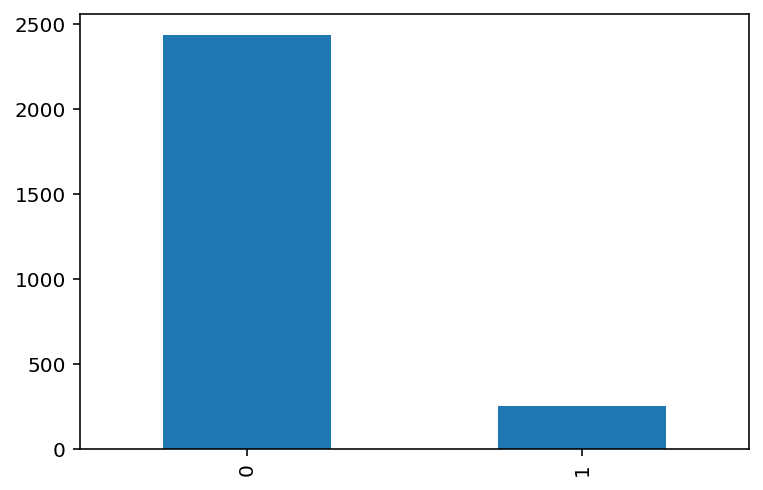

In [247]:
y_test.value_counts().plot(kind = 'bar')

### 4.6.3 LogReg-Lasso Prediction

In [248]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score,confusion_matrix,f1_score, recall_score,precision_score, roc_auc_score,roc_curve
from sklearn.linear_model import LogisticRegression
import seaborn as sns
from sklearn.metrics import roc_curve

# Tuning hyper-parameters for accuracy
{'C': 0.01}
accuracy =  0.905982905982906
f1_score =  0.0
recall =  0.0
# Tuning hyper-parameters for f1
{'C': 100}
accuracy =  0.9011519881085098
f1_score =  0.029197080291970802
recall =  0.015810276679841896
# Tuning hyper-parameters for recall
{'C': 100}
accuracy =  0.9011519881085098
f1_score =  0.029197080291970802
recall =  0.015810276679841896


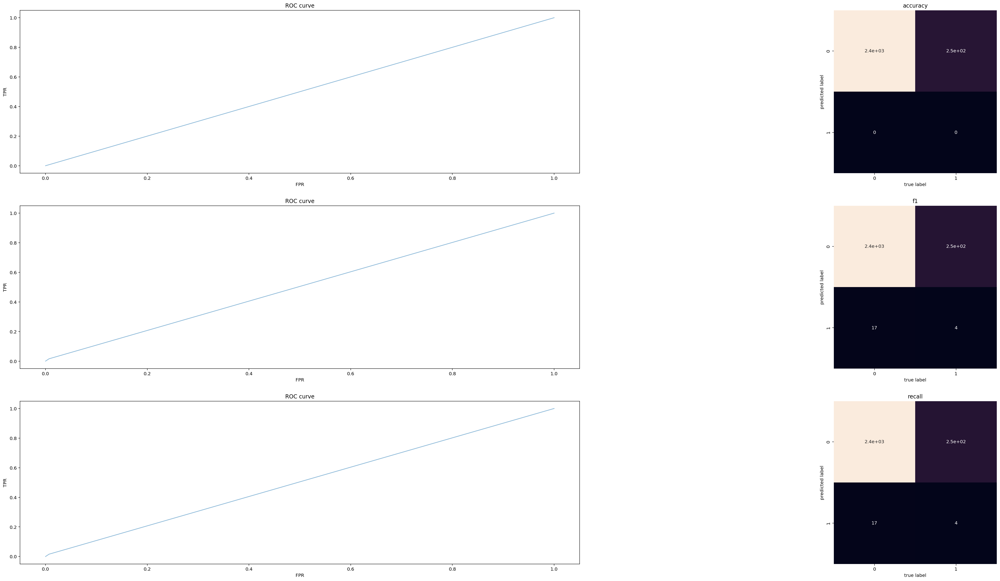

In [256]:
loglasso =  LogisticRegression(max_iter = 10000,penalty = 'l1',solver = 'liblinear')
param_grid = {'C': [0.01, 0.1, 1, 10, 100, 1000]}
scores = ['accuracy','f1','recall']

fig, ax = plt.subplots(3, 2,figsize = (40,30))
fig.subplots_adjust(left=0.0625, right=0.95, wspace=0.1)

count = 1
for sc in scores:
    grid=GridSearchCV(estimator = loglasso,param_grid = param_grid,scoring = sc)
    print("# Tuning hyper-parameters for %s" % sc)
    grid.fit(X_train,y_train)
    print(grid.best_params_)
    loglasso = grid.best_estimator_   
    y_pred_loglasso = loglasso.predict(X_test)
    
    
    print('accuracy = ',accuracy_score(y_test,y_pred_loglasso))
    print('f1_score = ',f1_score(y_test,y_pred_loglasso))
    print('recall = ',recall_score(y_test,y_pred_loglasso))
    
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_loglasso, pos_label=1)
    auc = np.trapz(tpr, fpr)
    plt.subplot(4, 2, count)
    plt.plot(fpr, tpr, linestyle='-', alpha=0.5, color= "C0", label = 'log-lasso AUC='+"%.2f"%auc)
    plt.title("ROC curve")
    plt.xlabel("FPR")
    plt.ylabel("TPR")
    
    plt.subplot(4, 2, count+1)
    mat = confusion_matrix(y_test,y_pred_loglasso)
    sns.heatmap(mat.T, square=True, annot=True, cbar=False,
            xticklabels=[0,1],
            yticklabels=[0,1])
    plt.xlabel('true label')
    plt.ylabel('predicted label')
    plt.title(sc)
    count+=2


   #### Resampling

In [217]:
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler

Using TensorFlow backend.


In [257]:
ros = RandomOverSampler(random_state=0)
X,y = ros.fit_sample(X, y)

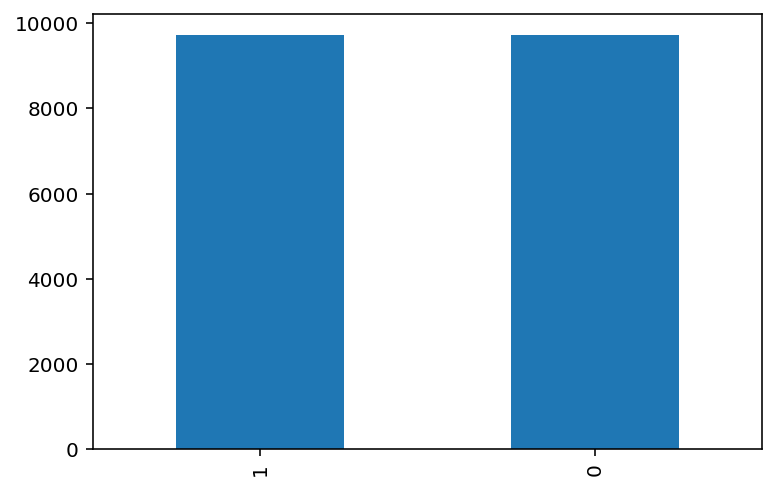

In [258]:
y.value_counts().plot(kind = 'bar')

In [259]:
X.shape

(19474, 72)

In [260]:
y.shape

(19474,)

In [261]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=0)

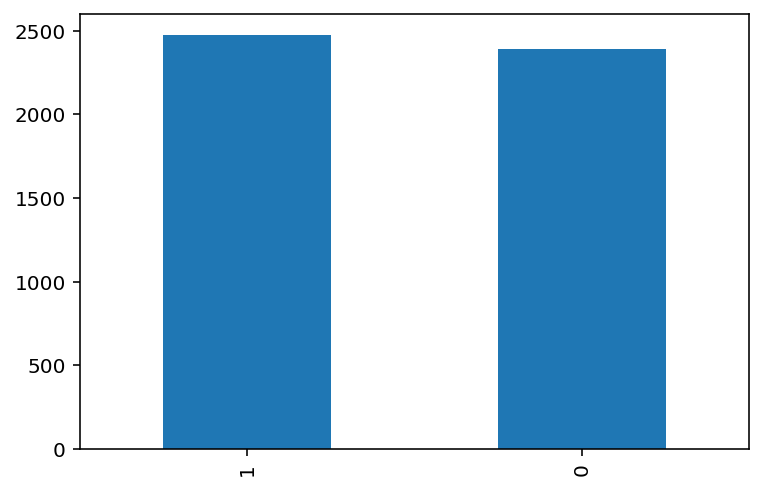

In [263]:
y_test.value_counts().plot(kind = 'bar')

# Tuning hyper-parameters for accuracy
{'C': 1}
accuracy =  0.7416307249948655
f1_score =  0.7502977371973005
recall =  0.7630197819943481
# Tuning hyper-parameters for f1
{'C': 1}
accuracy =  0.7416307249948655
f1_score =  0.7502977371973005
recall =  0.7630197819943481
# Tuning hyper-parameters for recall
{'C': 1}
accuracy =  0.7416307249948655
f1_score =  0.7502977371973005
recall =  0.7630197819943481


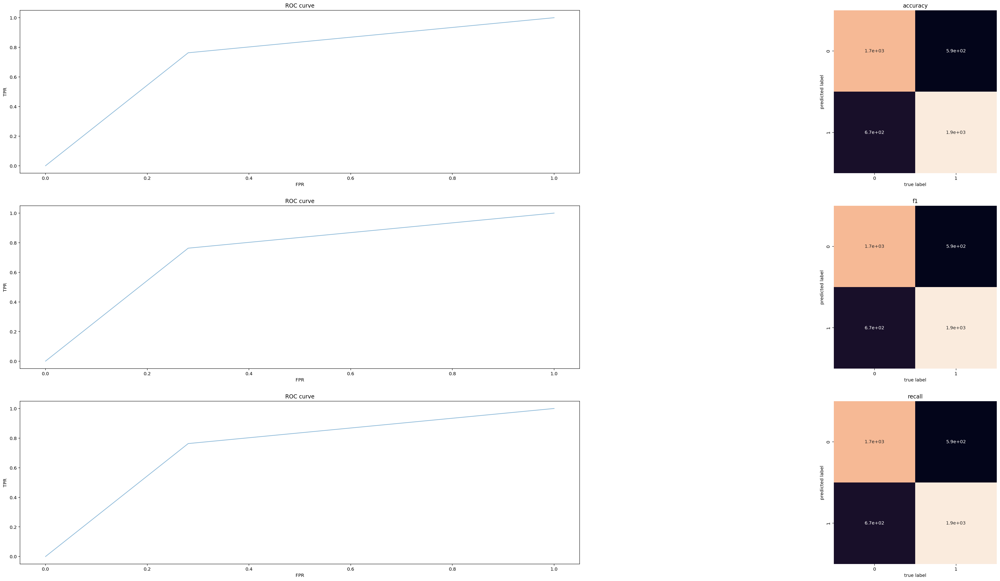

In [264]:
loglasso =  LogisticRegression(max_iter = 10000,penalty = 'l1',solver = 'liblinear')
param_grid = {'C': [0.01, 0.1, 1, 10, 100, 1000]}
scores = ['accuracy','f1','recall']

fig, ax = plt.subplots(3, 2,figsize = (40,30))
fig.subplots_adjust(left=0.0625, right=0.95, wspace=0.1)

count = 1
for sc in scores:
    grid=GridSearchCV(estimator = loglasso,param_grid = param_grid,scoring = sc)
    print("# Tuning hyper-parameters for %s" % sc)
    grid.fit(X_train,y_train)
    print(grid.best_params_)
    loglasso = grid.best_estimator_   
    y_pred_loglasso = loglasso.predict(X_test)
    
    
    print('accuracy = ',accuracy_score(y_test,y_pred_loglasso))
    print('f1_score = ',f1_score(y_test,y_pred_loglasso))
    print('recall = ',recall_score(y_test,y_pred_loglasso))
    
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_loglasso, pos_label=1)
    auc = np.trapz(tpr, fpr)
    plt.subplot(3, 2, count)
    plt.plot(fpr, tpr, linestyle='-', alpha=0.5, color= "C0", label = 'log-lasso AUC='+"%.2f"%auc)
    plt.title("ROC curve")
    plt.xlabel("FPR")
    plt.ylabel("TPR")
    
    plt.subplot(4, 2, count+1)
    mat = confusion_matrix(y_test,y_pred_loglasso)
    sns.heatmap(mat.T, square=True, annot=True, cbar=False,
            xticklabels=[0,1],
            yticklabels=[0,1])
    plt.xlabel('true label')
    plt.ylabel('predicted label')
    plt.title(sc)
    count+=2

### 4.6.4 XGBoost Prediction

In [265]:
import xgboost as xgb
from xgboost import XGBClassifier

C:\Users\Yunge Li\Anaconda3\lib\site-packages\dask\dataframe\utils.py:15: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


# Tuning hyper-parameters for accuracy
{'gamma': 0.0001, 'max_depth': 12, 'min_child_weight': 0.01}
accuracy =  0.9856233312795235
f1_score =  0.9860668789808916
recall =  1.0
# Tuning hyper-parameters for f1
{'gamma': 0.0001, 'max_depth': 12, 'min_child_weight': 0.01}
accuracy =  0.9856233312795235
f1_score =  0.9860668789808916
recall =  1.0
# Tuning hyper-parameters for recall
{'gamma': 0.1, 'max_depth': 9, 'min_child_weight': 0.01}
accuracy =  0.9788457588827275
f1_score =  0.9796321929998023
recall =  1.0


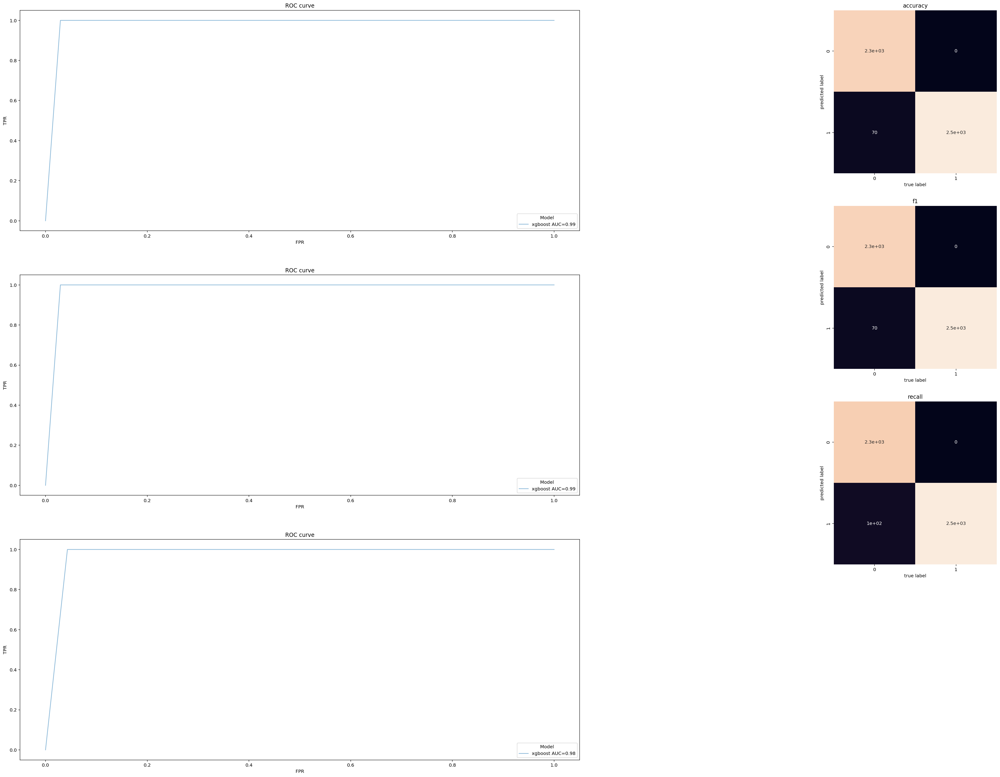

In [273]:
xgbc= xgb.XGBClassifier(objective="binary:logistic", random_state=42)
param_grid = {'min_child_weight':[0.01,0.1,0.5, 1, 5],'max_depth':[3,6,9,12],'gamma':[0.1,0.001,0.001,0.0001]}
scores = ['accuracy','f1','recall']

fig, ax = plt.subplots(3, 2,figsize = (40,30))
fig.subplots_adjust(left=0.0625, right=0.95, wspace=0.1)

count = 1
for sc in scores:
    grid=GridSearchCV(estimator = xgbc,param_grid = param_grid,scoring = sc)
    print("# Tuning hyper-parameters for %s" % sc)
    grid.fit(X_train,y_train)
    print(grid.best_params_)
    xgbc = grid.best_estimator_   
    y_pred_xgbc = xgbc.predict(X_test)
    
    
    print('accuracy = ',accuracy_score(y_test,y_pred_xgbc))
    print('f1_score = ',f1_score(y_test,y_pred_xgbc))
    print('recall = ',recall_score(y_test,y_pred_xgbc))
    
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_xgbc, pos_label=1)
    auc = np.trapz(tpr, fpr)
    plt.subplot(3, 2, count)
    plt.plot(fpr, tpr, linestyle='-', alpha=0.5, color= "C0", label = 'xgboost AUC='+"%.2f"%auc)
    plt.legend(title = 'Model') 
    plt.title("ROC curve")
    plt.xlabel("FPR")
    plt.ylabel("TPR")
    
    
    plt.subplot(4, 2, count+1)
    mat = confusion_matrix(y_test,y_pred_xgbc)
    sns.heatmap(mat.T, square=True, annot=True, cbar=False,
            xticklabels=[0,1],
            yticklabels=[0,1])
    plt.xlabel('true label')
    plt.ylabel('predicted label')
    plt.title(sc)
    count+=2

### 4.5.8 PCA

In [231]:
# Import PCA
from sklearn.decomposition import PCA

## project from 140 to 2 dimensions using PCA
pca = PCA(2).fit(X_norm)
projected_X = pca.fit_transform(X_norm)

print(X_norm.shape)
print(projected_X.shape)

(10763, 138)
(10763, 2)


4.5.1.1Visualize the projected data (2-dim visualization) using Scatter Plot.

=>Readmission_First

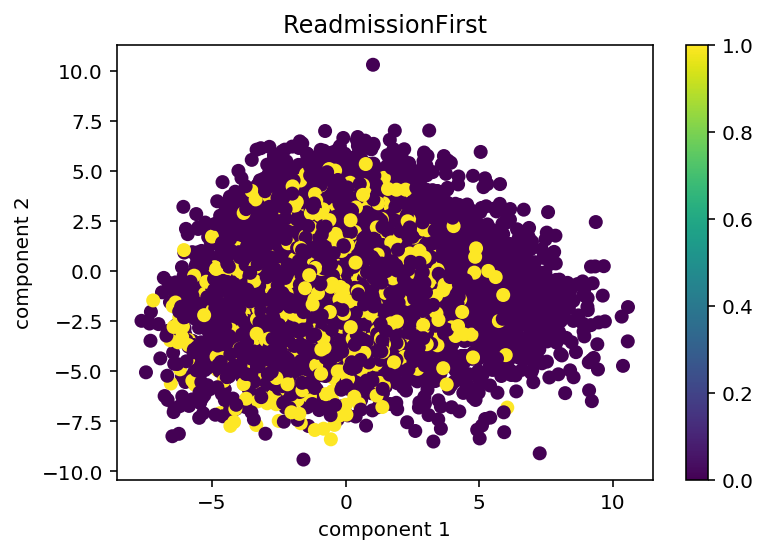

In [130]:
plt.scatter(projected_X[:,0],projected_X[:,1],c = Y.ReadmissionFirst)

plt.xlabel('component 1')
plt.ylabel('component 2')
plt.title('ReadmissionFirst')
plt.colorbar();

=>Readmission_Ever

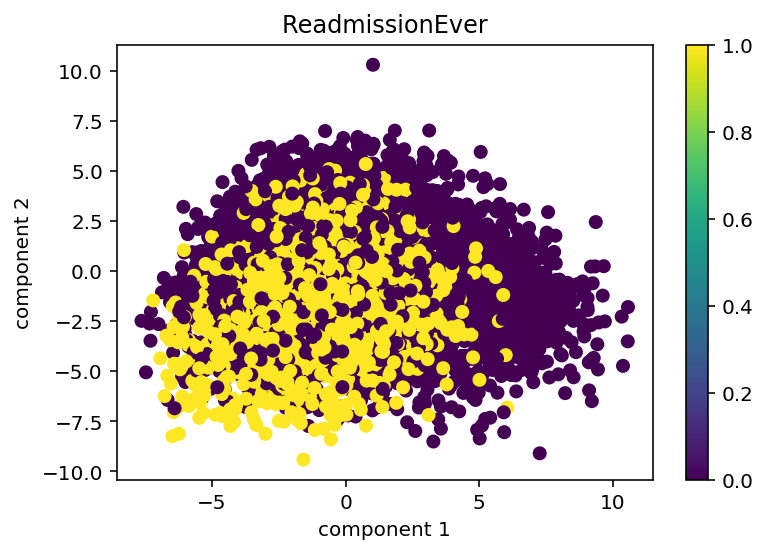

In [129]:
plt.scatter(projected_X[:,0],projected_X[:,1],c = Y.ReadmissionEver)

plt.xlabel('component 1')
plt.ylabel('component 2')
plt.title('ReadmissionEver')
plt.colorbar();

Conclusion: The points are not clustering significantly based on  visualization on the top 2 PCs


4.5.1.2 Hyperparameter/Model selection (Choosing the number of PCs)

Visualize the cumulative explained variance ratio as the function of the number of PCs.

Text(0.5, 1.0, 'Cumulative Explained Variance')

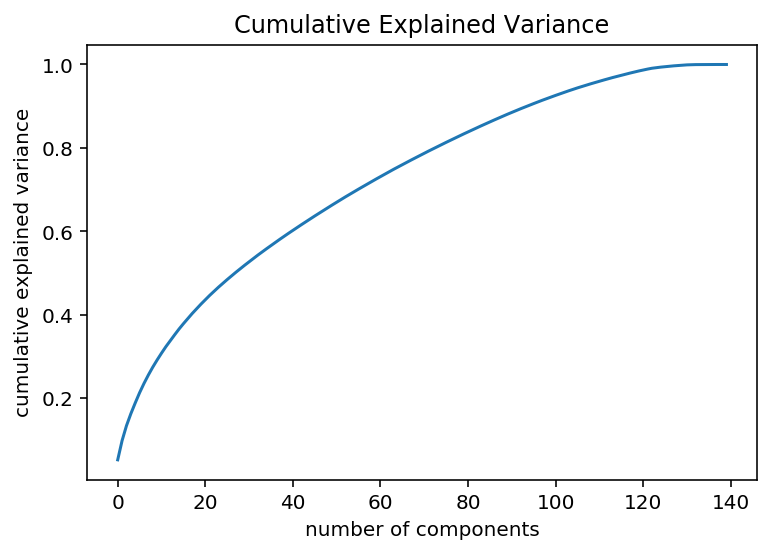

In [132]:

pca = PCA(140).fit(X_norm)
plt.plot(np.cumsum(pca.explained_variance_ratio_))

plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.title('Cumulative Explained Variance')

Conclusion: From the CEV curve, several threshold kinky points are:

        ~50% CEV: ~30 PCs
        
        ~60% CEV: ~40 PCs
        
        ~80% CEV: ~80 PCs

In [144]:
X_labels = X.columns.values.tolist()
print(len(X_labels))

140


=>30PCs

In [152]:

pca_30= PCA(30).fit(X_norm)
print('Cumulative explained variance ratio: ',np.sum(pca_30.explained_variance_ratio_),'\n')
print('30 Single dimension explained variance ratio:',pca_30.explained_variance_ratio_,'\n')
abs_original_var_weight = np.abs(pca_30.components_)
# print(abs_original_var_weight.shape)
print('Projection scaler matrix:',pca_30.components_)
print(pca_30.components_.shape)

Cumulative explained variance ratio:  0.515376351150429 

30 Single dimension explained variance ratio: [0.05214209 0.04614621 0.03563472 0.0287897  0.02583313 0.0245421
 0.02219612 0.02026579 0.01874942 0.01725887 0.01632004 0.01555096
 0.01437464 0.01401833 0.013753   0.01276055 0.01232099 0.01191576
 0.01113768 0.01109128 0.0104794  0.01002923 0.00973227 0.00958867
 0.00911632 0.00870707 0.00852541 0.0083029  0.00815477 0.00793895] 

Projection scaler matrix: [[-0.05798543  0.05498765  0.14141765 ...  0.0348252   0.04679351
   0.02468639]
 [-0.08153619  0.04472937 -0.02376961 ... -0.0291956  -0.06282537
  -0.05354693]
 [ 0.03462055  0.05691888  0.0239169  ...  0.01810024  0.04237246
   0.03507605]
 ...
 [ 0.03643003 -0.0546823   0.04034157 ...  0.04791485  0.02624517
  -0.01033615]
 [ 0.1419033   0.04546119 -0.04459767 ... -0.02918654 -0.02427212
  -0.02023623]
 [-0.01588266 -0.01904202  0.03694257 ...  0.13717977 -0.00207992
   0.01876153]]
(30, 140)


components_matrix: 

    row -> new dimension (30)
    
    column -> raw features(140)

Top features on weight/contribution to the 1st PC for 30_PCs

In [159]:
abs_original_var_weight_0 = np.abs(pca_30.components_[0])
desc_ranked_var_weight_0 = np.argsort( -abs_original_var_weight_0)
for index,rank in enumerate(desc_ranked_var_weight_0):
    print(index+1,'.',X_labels[rank],':',pca_30.components_[0,rank])

1 . first.Urea.Blood : 0.232649335615512
2 . first.HGB : -0.22081097713642273
3 . first.Albumin : -0.21782258156458936
4 . first.HCT : -0.21118276848637016
5 . first.RBC : -0.20613904407172542
6 . first.Osmolality.calc : 0.2025741972743872
7 . first.Calcium.Blood.total : -0.19834146065634217
8 . first.Protein..Blood.total : -0.17757493228554566
9 . first.GFR.MDRD : -0.1764256589609748
10 . first.Creatinine.Blood : 0.17323191647679234
11 . first.LYMPHO : -0.17258990981904396
12 . first.NEUTRO.abs : 0.16930888255123264
13 . first.NEUTRO : 0.16580230815447938
14 . first.Hematocrit : -0.16310521639011782
15 . first.WBC : 0.1414176498790471
16 . ECHOFirst_lv_systolic_dimension : -0.13558559625610067
17 . ECHOFirst_lv_systolic_dimension.1 : -0.13558559625610067
18 . frist.CRP : 0.1345705959818236
19 . first.Phosphorus.Blood : 0.13301241188157692
20 . ECHOFirst_lv_diastolic_dimension : -0.13235233412496022
21 . Serial : -0.12607673791749144
22 . first.RDW : 0.1252467015661677
23 . age : 0.122

Top features on weight/contribution to the total 30 PCs for 30_PCs

In [164]:
pca_30_sum_components = np.sum(pca_30.components_,axis = 0)
abs_original_var_weight_30 = np.abs(pca_30_sum_components)
desc_ranked_var_weight_30 = np.argsort( -abs_original_var_weight_30)
for index,rank in enumerate(desc_ranked_var_weight_30):
    print(index+1,'.',X_labels[rank],':',pca_30_sum_components[rank])

1 . first.INR : 1.1289562859704585
2 . first.PO2 : 1.0333838619375149
3 . gender : 1.027047008414822
4 . first.PH : 0.9921210355366116
5 . ECHOFirst_lv_mass_index : 0.9292534544551849
6 . ECHOFirst_lv_mass_index.1 : 0.9292534544551846
7 . first.Protein..Blood.total : -0.8854404732105398
8 . first.SGOT.AST.Blood : 0.8753792640894222
9 . first.HGB : -0.8680351520523103
10 . Height (cm) : -0.8367018592210749
11 . first.HCT : -0.8287767471598335
12 . first.LDH..Blood : 0.814369248112291
13 . CHF30_4 : -0.7958117744153089
14 . Pulse : 0.7680866210531816
15 . first.PTT : 0.7651034331208435
16 . any_RENAL.DIS : -0.7556276071017821
17 . CHF30_3 : -0.7239162703024165
18 . first.COHb : 0.7089033835587084
19 . first.Creatinine.Blood : -0.7021826629037826
20 . first.Calcium.Blood.total : -0.6775736313399046
21 . first.SGPT.ALT : 0.6726612239311878
22 . any_IHD : -0.6473006281365454
23 . respiratory rate : 0.6420071162422033
24 . any_CABG : -0.6335776291408795
25 . BMI : 0.6258755308203012
26 . BIG

## 4.5.2 Isomap

In [165]:
from sklearn.manifold import Isomap

## 4.5.3 MDS

In [183]:
from sklearn.manifold import MDS

## 4.5.4 LDA

In [166]:
from sklearn.model_selection import train_test_split

In [167]:
X_train, X_test, y_train, y_test = train_test_split(X_norm, Y.ReadmissionFirst, test_size=0.2)

In [168]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.metrics import f1_score

In [182]:
from sklearn.metrics import precision_recall_curve
hyperparam_set_lda = [2,5,10,30,50,70,90,110,130]
for hyperparam in hyperparam_set_lda:
    lda = LinearDiscriminantAnalysis(n_components=hyperparam)
    lda.fit(X_train,y_train)
    predict_y = lda.predict(X_test)
    score = f1_score(predict_y,y_test)
    print('n_components =',hyperparam,'f1_score =',score) 


C:\Users\Yunge Li\Anaconda3\lib\site-packages\sklearn\discriminant_analysis.py:463: ChangedBehaviorWarning: n_components cannot be larger than min(n_features, n_classes - 1). Using min(n_features, n_classes - 1) = min(140, 2 - 1) = 1 components.
  ChangedBehaviorWarning)
C:\Users\Yunge Li\Anaconda3\lib\site-packages\sklearn\discriminant_analysis.py:469: FutureWarning: In version 0.23, setting n_components > min(n_features, n_classes - 1) will raise a ValueError. You should set n_components to None (default), or a value smaller or equal to min(n_features, n_classes - 1).
  warnings.warn(future_msg, FutureWarning)


n_components = 2 f1_score = 1.0


C:\Users\Yunge Li\Anaconda3\lib\site-packages\sklearn\discriminant_analysis.py:463: ChangedBehaviorWarning: n_components cannot be larger than min(n_features, n_classes - 1). Using min(n_features, n_classes - 1) = min(140, 2 - 1) = 1 components.
  ChangedBehaviorWarning)
C:\Users\Yunge Li\Anaconda3\lib\site-packages\sklearn\discriminant_analysis.py:469: FutureWarning: In version 0.23, setting n_components > min(n_features, n_classes - 1) will raise a ValueError. You should set n_components to None (default), or a value smaller or equal to min(n_features, n_classes - 1).
  warnings.warn(future_msg, FutureWarning)


n_components = 5 f1_score = 1.0


C:\Users\Yunge Li\Anaconda3\lib\site-packages\sklearn\discriminant_analysis.py:463: ChangedBehaviorWarning: n_components cannot be larger than min(n_features, n_classes - 1). Using min(n_features, n_classes - 1) = min(140, 2 - 1) = 1 components.
  ChangedBehaviorWarning)
C:\Users\Yunge Li\Anaconda3\lib\site-packages\sklearn\discriminant_analysis.py:469: FutureWarning: In version 0.23, setting n_components > min(n_features, n_classes - 1) will raise a ValueError. You should set n_components to None (default), or a value smaller or equal to min(n_features, n_classes - 1).
  warnings.warn(future_msg, FutureWarning)


n_components = 10 f1_score = 1.0


C:\Users\Yunge Li\Anaconda3\lib\site-packages\sklearn\discriminant_analysis.py:463: ChangedBehaviorWarning: n_components cannot be larger than min(n_features, n_classes - 1). Using min(n_features, n_classes - 1) = min(140, 2 - 1) = 1 components.
  ChangedBehaviorWarning)
C:\Users\Yunge Li\Anaconda3\lib\site-packages\sklearn\discriminant_analysis.py:469: FutureWarning: In version 0.23, setting n_components > min(n_features, n_classes - 1) will raise a ValueError. You should set n_components to None (default), or a value smaller or equal to min(n_features, n_classes - 1).
  warnings.warn(future_msg, FutureWarning)


n_components = 30 f1_score = 1.0


C:\Users\Yunge Li\Anaconda3\lib\site-packages\sklearn\discriminant_analysis.py:463: ChangedBehaviorWarning: n_components cannot be larger than min(n_features, n_classes - 1). Using min(n_features, n_classes - 1) = min(140, 2 - 1) = 1 components.
  ChangedBehaviorWarning)
C:\Users\Yunge Li\Anaconda3\lib\site-packages\sklearn\discriminant_analysis.py:469: FutureWarning: In version 0.23, setting n_components > min(n_features, n_classes - 1) will raise a ValueError. You should set n_components to None (default), or a value smaller or equal to min(n_features, n_classes - 1).
  warnings.warn(future_msg, FutureWarning)


n_components = 50 f1_score = 1.0


C:\Users\Yunge Li\Anaconda3\lib\site-packages\sklearn\discriminant_analysis.py:463: ChangedBehaviorWarning: n_components cannot be larger than min(n_features, n_classes - 1). Using min(n_features, n_classes - 1) = min(140, 2 - 1) = 1 components.
  ChangedBehaviorWarning)
C:\Users\Yunge Li\Anaconda3\lib\site-packages\sklearn\discriminant_analysis.py:469: FutureWarning: In version 0.23, setting n_components > min(n_features, n_classes - 1) will raise a ValueError. You should set n_components to None (default), or a value smaller or equal to min(n_features, n_classes - 1).
  warnings.warn(future_msg, FutureWarning)


n_components = 70 f1_score = 1.0


C:\Users\Yunge Li\Anaconda3\lib\site-packages\sklearn\discriminant_analysis.py:463: ChangedBehaviorWarning: n_components cannot be larger than min(n_features, n_classes - 1). Using min(n_features, n_classes - 1) = min(140, 2 - 1) = 1 components.
  ChangedBehaviorWarning)
C:\Users\Yunge Li\Anaconda3\lib\site-packages\sklearn\discriminant_analysis.py:469: FutureWarning: In version 0.23, setting n_components > min(n_features, n_classes - 1) will raise a ValueError. You should set n_components to None (default), or a value smaller or equal to min(n_features, n_classes - 1).
  warnings.warn(future_msg, FutureWarning)


n_components = 90 f1_score = 1.0


C:\Users\Yunge Li\Anaconda3\lib\site-packages\sklearn\discriminant_analysis.py:463: ChangedBehaviorWarning: n_components cannot be larger than min(n_features, n_classes - 1). Using min(n_features, n_classes - 1) = min(140, 2 - 1) = 1 components.
  ChangedBehaviorWarning)
C:\Users\Yunge Li\Anaconda3\lib\site-packages\sklearn\discriminant_analysis.py:469: FutureWarning: In version 0.23, setting n_components > min(n_features, n_classes - 1) will raise a ValueError. You should set n_components to None (default), or a value smaller or equal to min(n_features, n_classes - 1).
  warnings.warn(future_msg, FutureWarning)


n_components = 110 f1_score = 1.0


C:\Users\Yunge Li\Anaconda3\lib\site-packages\sklearn\discriminant_analysis.py:463: ChangedBehaviorWarning: n_components cannot be larger than min(n_features, n_classes - 1). Using min(n_features, n_classes - 1) = min(140, 2 - 1) = 1 components.
  ChangedBehaviorWarning)
C:\Users\Yunge Li\Anaconda3\lib\site-packages\sklearn\discriminant_analysis.py:469: FutureWarning: In version 0.23, setting n_components > min(n_features, n_classes - 1) will raise a ValueError. You should set n_components to None (default), or a value smaller or equal to min(n_features, n_classes - 1).
  warnings.warn(future_msg, FutureWarning)


n_components = 130 f1_score = 1.0


In [177]:
print(y_test)

<class 'pandas.core.series.Series'>
9428     0.0
603      0.0
9599     1.0
7797     0.0
5205     0.0
932      0.0
5348     0.0
7191     0.0
424      0.0
10030    0.0
950      0.0
9389     0.0
7170     0.0
7486     0.0
2662     0.0
6087     0.0
1164     0.0
4215     0.0
6686     0.0
3151     0.0
6893     0.0
6045     0.0
4792     0.0
5612     0.0
2400     0.0
6078     0.0
7468     1.0
5592     0.0
8510     0.0
7828     0.0
        ... 
3063     0.0
5601     0.0
7737     0.0
4105     0.0
5978     0.0
8189     0.0
1048     0.0
2486     0.0
8963     0.0
5672     0.0
9053     0.0
5890     0.0
4573     0.0
6269     0.0
6071     0.0
1951     0.0
1306     0.0
1428     0.0
4785     0.0
4218     0.0
10146    1.0
9884     0.0
4436     0.0
7512     0.0
8237     0.0
6013     0.0
6422     0.0
1014     0.0
5128     0.0
2401     0.0
Name: ReadmissionFirst, Length: 2153, dtype: float64


In [180]:
y_test.value_counts()

0.0    1944
1.0     209
Name: ReadmissionFirst, dtype: int64

Text(0, 0.5, 'Precision')

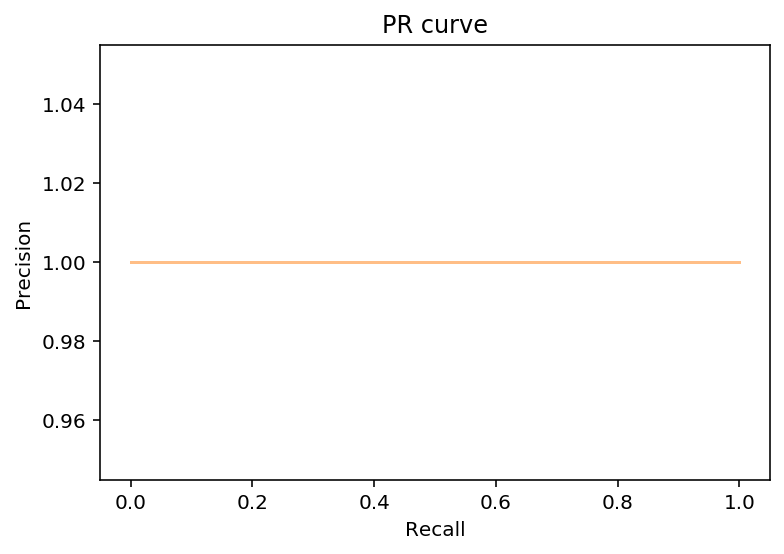

In [173]:
precision,recall, threshold = precision_recall_curve(y_test, predict_y, pos_label=1)
plt.plot(recall,precision, linestyle='-', alpha=0.5, color= "C1", label = 'RF PRECISION='+"%.2f"%np.mean(precision))
plt.title("PR curve")
plt.xlabel("Recall")
plt.ylabel("Precision")

# 5. Time Series Analysis

In [232]:
total_var_with_date = set.union(total_var, date_features)
print(len(total_var_with_date))
#227 + 15

242


## 5.1 Date Data Processing/Transformation

In [235]:
data_df[date_features]

,hf_hosp_date5,Release_Date,hf_hosp_date4,verify birth + age <=2017,birth_date.1,diag_date,ECHOlast_exam_date,hf_hosp_date2,hf_hosp_date3,birth_date,death_date,hf_hosp_date1,ECHO1_exam_date,hf_hosp_date_last,ref_date
0,NaN,07/09/2010,NaN,18/08/2010,01/01/1936,07/09/2010,07/11/2010,NaN,NaN,01/01/1936,NaN,06/09/2010,06/09/2010,06/09/2010,06/09/2010
1,NaN,22/01/2017,NaN,09/12/2016,24/06/1928,12/01/2017,05/01/2017,NaN,NaN,24/06/1928,NaN,01/01/2017,13/04/2009,01/01/2017,01/01/2017
2,NaN,22/03/2016,NaN,26/02/2016,20/08/1924,22/03/2016,NaN,NaN,NaN,20/08/1924,NaN,20/03/2016,NaN,20/03/2016,20/03/2016
3,NaN,28/12/2016,NaN,06/12/2016,15/12/1942,25/12/2016,06/07/2005,NaN,NaN,15/12/1942,NaN,25/12/2016,06/07/2005,25/12/2016,25/12/2016
4,NaN,20/10/2015,NaN,28/09/2015,15/11/1936,20/10/2015,19/10/2015,NaN,NaN,15/11/1936,NaN,18/10/2015,19/10/2015,18/10/2015,18/10/2015
5,NaN,03/03/2011,NaN,10/02/2011,22/09/1934,02/03/2011,15/02/2011,NaN,NaN,22/09/1934,NaN,02/03/2011,15/02/2011,02/03/2011,02/03/2011
6,NaN,22/11/2011,NaN,30/10/2011,01/01/1930,20/11/2011,NaN,NaN,NaN,01/01/1930,15/03/2012,20/11/2011,NaN,20/11/2011,20/11/2011
7,NaN,30/08/2011,NaN,08/08/2011,01/01/1930,30/08/2011,29/08/2011,NaN,NaN,01/01/1930,24/06/2017,29/08/2011,29/08/2011,29/08/2011,29/08/2011
8,NaN,12/04/2009,NaN,14/03/2009,01/01/1936,07/04/2009,NaN,NaN,NaN,01/01/1936,06/12/2010,02/04/2009,NaN,02/04/2009,02/04/2009
9,NaN,15/05/2011,NaN,21/04/2011,12/01/1919,15/05/2011,NaN,NaN,NaN,12/01/1919,17/01/2013,15/05/2011,NaN,15/05/2011,15/05/2011


In [269]:
data_df[list(date_features)] = pd.to_datetime(data_df[list(date_features)].stack(), format='%d/%m/%Y').unstack()

In [274]:
data_df[date_features].describe()

,hf_hosp_date5,Release_Date,hf_hosp_date4,verify birth + age <=2017,birth_date.1,diag_date,ECHOlast_exam_date,hf_hosp_date2,hf_hosp_date3,birth_date,death_date,hf_hosp_date1,ECHO1_exam_date,hf_hosp_date_last,ref_date
count,695,10763,1078,10763,10763,10763,8452,4008,1903,10763,6081,10763,8452,10763,10763
unique,606,2873,881,3114,6094,3042,2562,2201,1349,6094,2597,3081,2817,3034,3087
top,2015-01-08 00:00:00,2016-12-04 00:00:00,2013-04-28 00:00:00,2013-01-20 00:00:00,1934-01-01 00:00:00,2009-01-07 00:00:00,2016-12-14 00:00:00,2016-01-29 00:00:00,2015-12-22 00:00:00,1934-01-01 00:00:00,2014-02-09 00:00:00,2015-04-06 00:00:00,2011-12-20 00:00:00,2017-02-13 00:00:00,2015-04-06 00:00:00
freq,3,14,4,12,154,14,17,8,7,154,9,14,10,16,14
first,2009-05-11 00:00:00,2007-04-03 00:00:00,2009-02-02 00:00:00,2005-07-28 00:00:00,1904-01-01 00:00:00,2007-04-03 00:00:00,2003-10-23 00:00:00,2008-04-27 00:00:00,2008-11-28 00:00:00,1904-01-01 00:00:00,2007-08-26 00:00:00,2005-08-21 00:00:00,2003-04-11 00:00:00,2005-08-21 00:00:00,2005-08-21 00:00:00
last,2017-08-13 00:00:00,2017-08-17 00:00:00,2017-08-14 00:00:00,2017-07-28 00:00:00,1998-06-19 00:00:00,2017-08-16 00:00:00,2017-01-19 00:00:00,2017-08-14 00:00:00,2017-08-13 00:00:00,1998-06-19 00:00:00,2017-08-21 00:00:00,2017-08-14 00:00:00,2017-01-19 00:00:00,2017-08-16 00:00:00,2017-08-14 00:00:00


## 5.2 Time Span for Visits/Hospitalization

In [256]:
hf_date = []
for var in date_features:
    hf= re.findall('.*hf_hosp_date.*',var,re.IGNORECASE)
    if len(hf) == 1:
        hf_date+=hf
hf_date.sort()
print(hf_date)



['hf_hosp_date1', 'hf_hosp_date2', 'hf_hosp_date3', 'hf_hosp_date4', 'hf_hosp_date5', 'hf_hosp_date_last']


In [275]:
hf_date_df = data_df[hf_date]
hf_date_df.head(10)

,hf_hosp_date1,hf_hosp_date2,hf_hosp_date3,hf_hosp_date4,hf_hosp_date5,hf_hosp_date_last
0,2010-09-06,NaT,NaT,NaT,NaT,2010-09-06
1,2017-01-01,NaT,NaT,NaT,NaT,2017-01-01
2,2016-03-20,NaT,NaT,NaT,NaT,2016-03-20
3,2016-12-25,NaT,NaT,NaT,NaT,2016-12-25
4,2015-10-18,NaT,NaT,NaT,NaT,2015-10-18
5,2011-03-02,NaT,NaT,NaT,NaT,2011-03-02
6,2011-11-20,NaT,NaT,NaT,NaT,2011-11-20
7,2011-08-29,NaT,NaT,NaT,NaT,2011-08-29
8,2009-04-02,NaT,NaT,NaT,NaT,2009-04-02
9,2011-05-15,NaT,NaT,NaT,NaT,2011-05-15


In [276]:
hf_date_df.describe()

,hf_hosp_date1,hf_hosp_date2,hf_hosp_date3,hf_hosp_date4,hf_hosp_date5,hf_hosp_date_last
count,10763,4008,1903,1078,695,10763
unique,3081,2201,1349,881,606,3034
top,2015-04-06 00:00:00,2016-01-29 00:00:00,2015-12-22 00:00:00,2013-04-28 00:00:00,2015-01-08 00:00:00,2017-02-13 00:00:00
freq,14,8,7,4,3,16
first,2005-08-21 00:00:00,2008-04-27 00:00:00,2008-11-28 00:00:00,2009-02-02 00:00:00,2009-05-11 00:00:00,2005-08-21 00:00:00
last,2017-08-14 00:00:00,2017-08-14 00:00:00,2017-08-13 00:00:00,2017-08-14 00:00:00,2017-08-13 00:00:00,2017-08-16 00:00:00


In [279]:
hf_date_nan_count=hf_date_df.isnull().sum(axis = 0)
hf_date_nan_count.sort_values(ascending=False)

hf_hosp_date5        10068
hf_hosp_date4         9685
hf_hosp_date3         8860
hf_hosp_date2         6755
hf_hosp_date_last        0
hf_hosp_date1            0
dtype: int64

In [281]:
hf_date_nan_percent=hf_date_df.isnull().sum(axis = 0)/len(hf_date_df)
hf_date_nan_percent.sort_values(ascending=False)

hf_hosp_date5        0.935427
hf_hosp_date4        0.899842
hf_hosp_date3        0.823191
hf_hosp_date2        0.627613
hf_hosp_date_last    0.000000
hf_hosp_date1        0.000000
dtype: float64

In [285]:
data_df['hf_date_span']=data_df['hf_hosp_date_last']-data_df['hf_hosp_date1']
data_df['hf_date_span'].describe()

count                       10763
mean     213 days 11:05:04.710582
std      479 days 06:35:10.805480
min               0 days 00:00:00
25%               0 days 00:00:00
50%               0 days 00:00:00
75%             127 days 00:00:00
max            3185 days 00:00:00
Name: hf_date_span, dtype: object

In [318]:
data_df['hf_date_span'].sort_values(ascending = False)

9909     3185
7679     3101
8880     3050
10542    3031
10378    3022
7942     3020
9141     3010
9731     2999
10340    2991
9145     2989
9494     2983
9925     2980
10579    2950
7309     2914
9708     2891
10262    2883
7758     2882
9743     2864
10126    2814
9803     2786
10183    2779
10150    2752
8883     2740
9166     2730
6794     2727
10434    2723
10614    2722
9175     2714
9272     2712
10582    2708
         ... 
4534        0
4535        0
4536        0
4514        0
4512        0
4488        0
4499        0
4489        0
4490        0
4491        0
4492        0
4493        0
4494        0
4495        0
4496        0
4497        0
4498        0
4500        0
4511        0
4501        0
4502        0
4503        0
4504        0
4505        0
4506        0
4507        0
4508        0
4509        0
4510        0
0           0
Name: hf_date_span, Length: 10763, dtype: int32

In [330]:
data_df['hf_date_span'].value_counts()

0       6755
4         48
5         42
7         41
6         37
8         33
12        29
15        28
10        27
11        24
38        24
9         23
14        21
21        21
13        19
28        19
19        19
26        19
20        18
27        17
45        17
29        17
17        17
22        16
34        16
33        15
32        15
48        15
16        15
24        15
        ... 
658        1
2045       1
2079       1
634        1
2111       1
618        1
1644       1
594        1
778        1
794        1
1668       1
818        1
1034       1
1026       1
1010       1
1002       1
994        1
978        1
946        1
930        1
1885       1
906        1
866        1
850        1
2891       1
842        1
2883       1
1893       1
1901       1
2047       1
Name: hf_date_span, Length: 1484, dtype: int64

In [334]:
data_df['hf_date_span'].value_counts()

0       6755
4         48
5         42
7         41
6         37
8         33
12        29
15        28
10        27
11        24
38        24
9         23
14        21
21        21
13        19
28        19
19        19
26        19
20        18
27        17
45        17
29        17
17        17
22        16
34        16
33        15
32        15
48        15
16        15
24        15
        ... 
658        1
2045       1
2079       1
634        1
2111       1
618        1
1644       1
594        1
778        1
794        1
1668       1
818        1
1034       1
1026       1
1010       1
1002       1
994        1
978        1
946        1
930        1
1885       1
906        1
866        1
850        1
2891       1
842        1
2883       1
1893       1
1901       1
2047       1
Name: hf_date_span, Length: 1484, dtype: int64

In [336]:
data_df['hf_date_span'].value_counts().describe()

count    1484.000000
mean        7.252695
std       175.319506
min         1.000000
25%         1.000000
50%         2.000000
75%         3.000000
max      6755.000000
Name: hf_date_span, dtype: float64

In [349]:
hf_span_first_quantile = data_df['hf_date_span'].value_counts()[data_df['hf_date_span'].value_counts().values >10]
hf_span_first_quantile

0     6755
4       48
5       42
7       41
6       37
8       33
12      29
15      28
10      27
11      24
38      24
9       23
14      21
21      21
13      19
28      19
19      19
26      19
20      18
27      17
45      17
29      17
17      17
22      16
34      16
33      15
32      15
48      15
16      15
24      15
43      14
47      14
39      14
42      14
18      13
52      13
40      12
30      12
46      12
68      12
77      11
44      11
73      11
41      11
79      11
25      11
Name: hf_date_span, dtype: int64

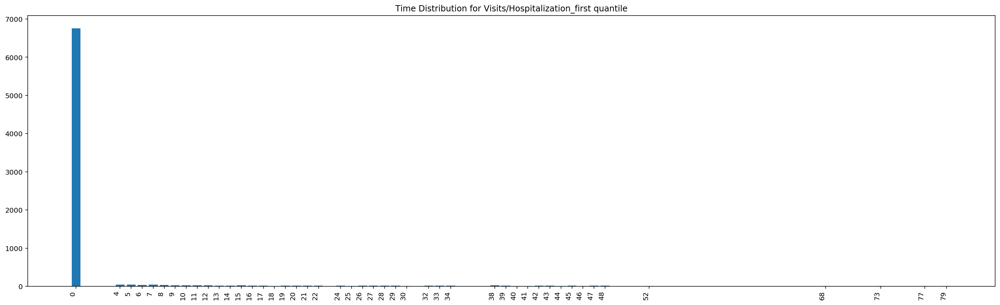

In [476]:
fig = plt.figure(figsize = (25,8))
plt.bar(hf_span_first_quantile.index,hf_span_first_quantile.values,tick_label=hf_span_first_quantile.index)
fig.autofmt_xdate(rotation = 90)
plt.title("Time Distribution for Visits/Hospitalization_first quantile")
plt.show()

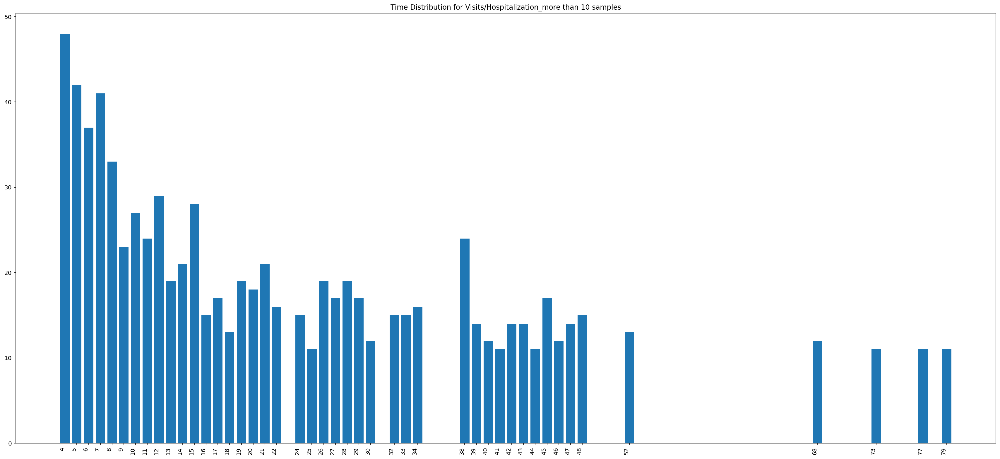

In [356]:
hf_span_minor = data_df['hf_date_span'].value_counts()[(data_df['hf_date_span'].value_counts().values <50)&(data_df['hf_date_span'].value_counts().values >10) ]
fig = plt.figure(figsize = (30,15))
plt.bar(hf_span_minor.index,hf_span_minor.values,tick_label=hf_span_minor.index)
fig.autofmt_xdate(rotation = 90)
plt.title("Time Distribution for Visits/Hospitalization_more than 10 samples")
plt.show()

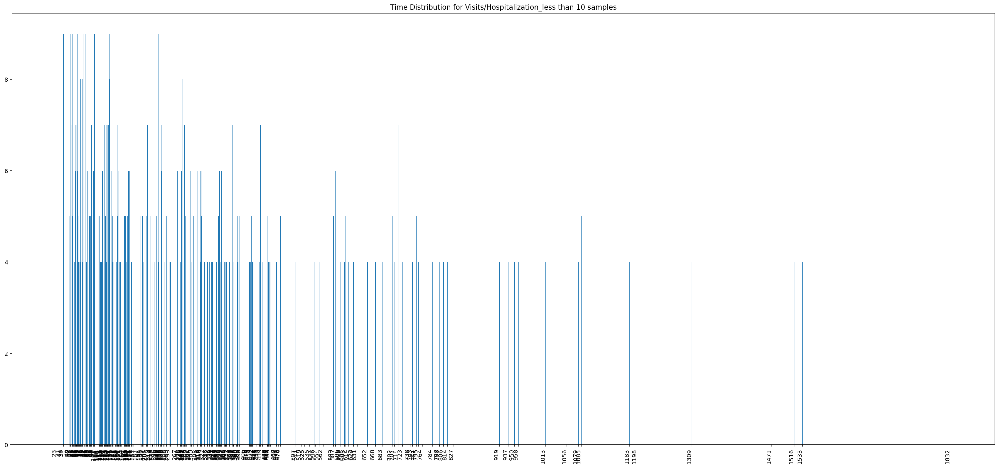

In [357]:
hf_span_minor_2 = data_df['hf_date_span'].value_counts()[(data_df['hf_date_span'].value_counts().values <10)& (data_df['hf_date_span'].value_counts().values >3) ]
fig = plt.figure(figsize = (30,15))
plt.bar(hf_span_minor_2.index,hf_span_minor_2.values,tick_label=hf_span_minor_2.index)
fig.autofmt_xdate(rotation = 90)
plt.title("Time Distribution for Visits/Hospitalization_less than 10 samples")
plt.show()

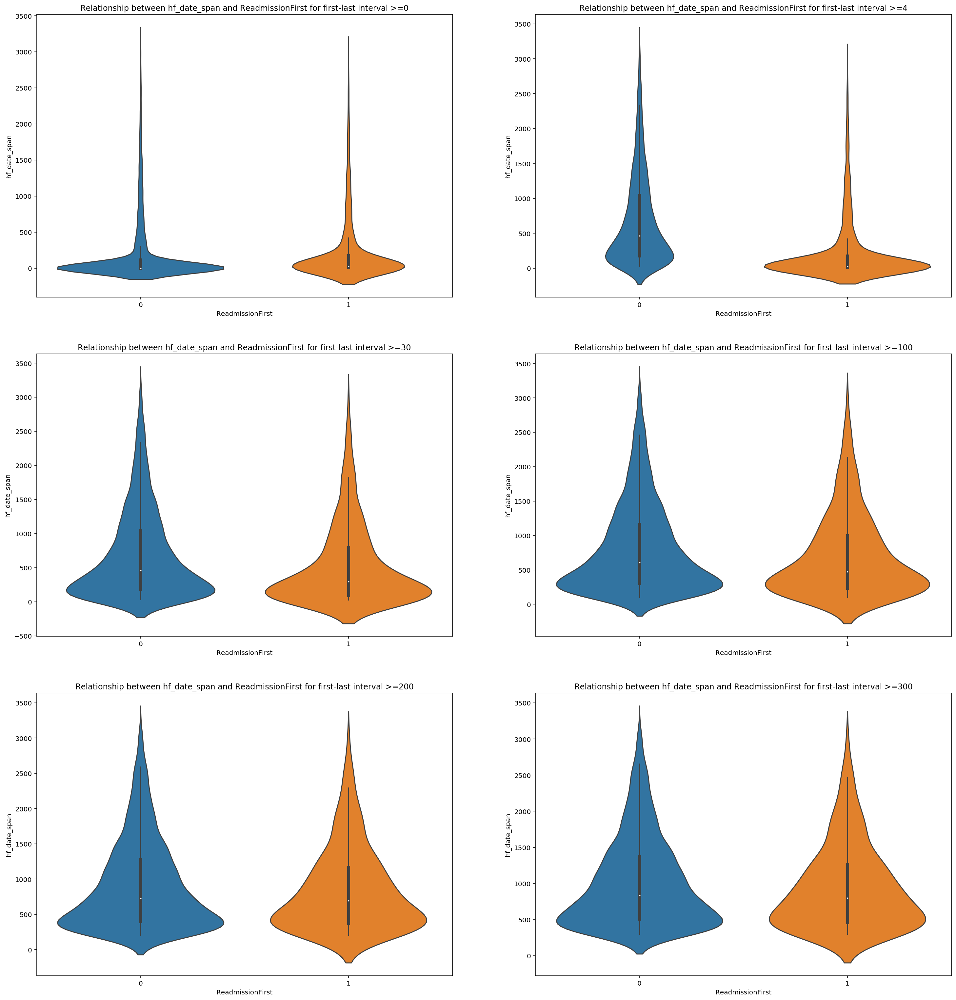

In [478]:
fig = plt.figure(figsize=(25,65))
time_span_list = [0,4,30,100,200,300]
for i,interval in enumerate(time_span_list):
    ax = fig.add_subplot(7, 2, i+1)
    seaborn.violinplot(x='ReadmissionFirst',y='hf_date_span', data=data_df[data_df['hf_date_span']>=interval][['hf_date_span', 'ReadmissionFirst']], 
                       order=[0,1])
    ax.set_title('Relationship between hf_date_span and ReadmissionFirst for first-last interval >='+str(interval))
   

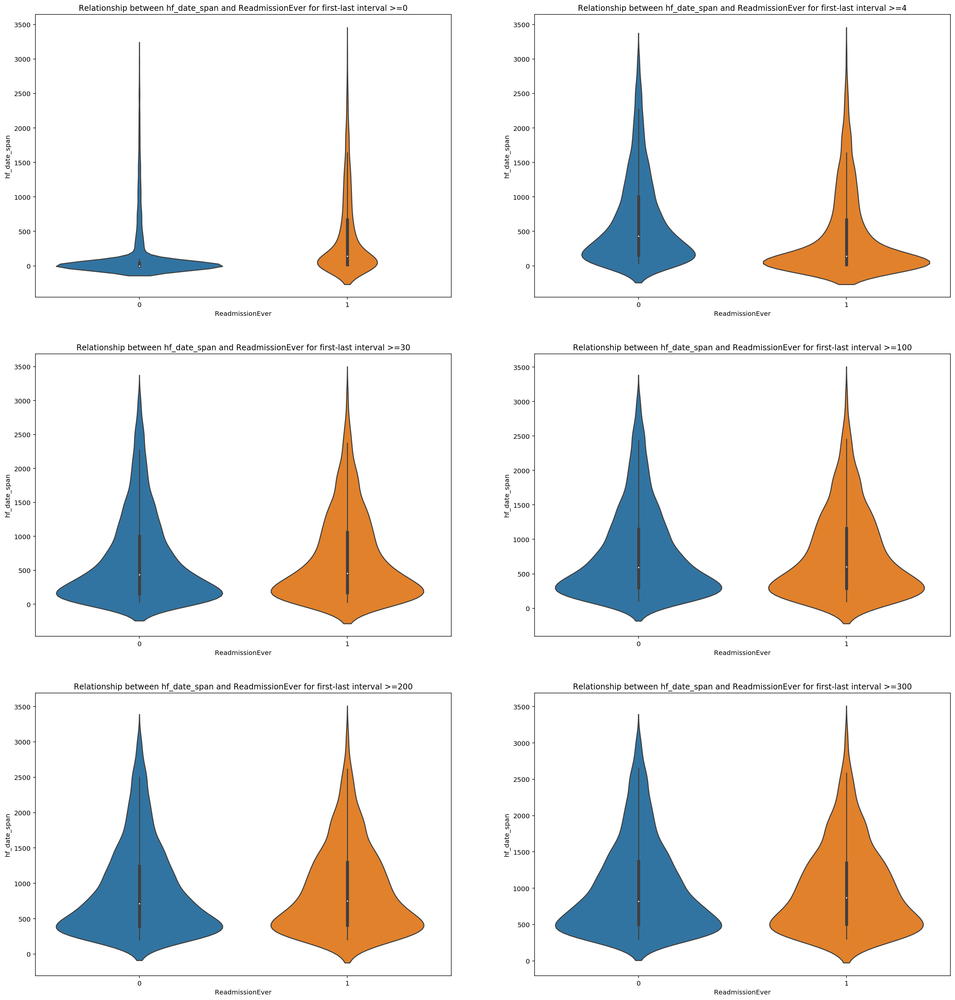

In [479]:
fig = plt.figure(figsize=(25,65))
time_span_list = [0,4,30,100,200,300]
for i,interval in enumerate(time_span_list):
    ax = fig.add_subplot(7, 2, i+1)
    seaborn.violinplot(x='ReadmissionEver',y='hf_date_span', data=data_df[data_df['hf_date_span']>=interval][['hf_date_span', 'ReadmissionEver']], 
                       order=[0,1])
    ax.set_title('Relationship between hf_date_span and ReadmissionEver for first-last interval >='+str(interval))

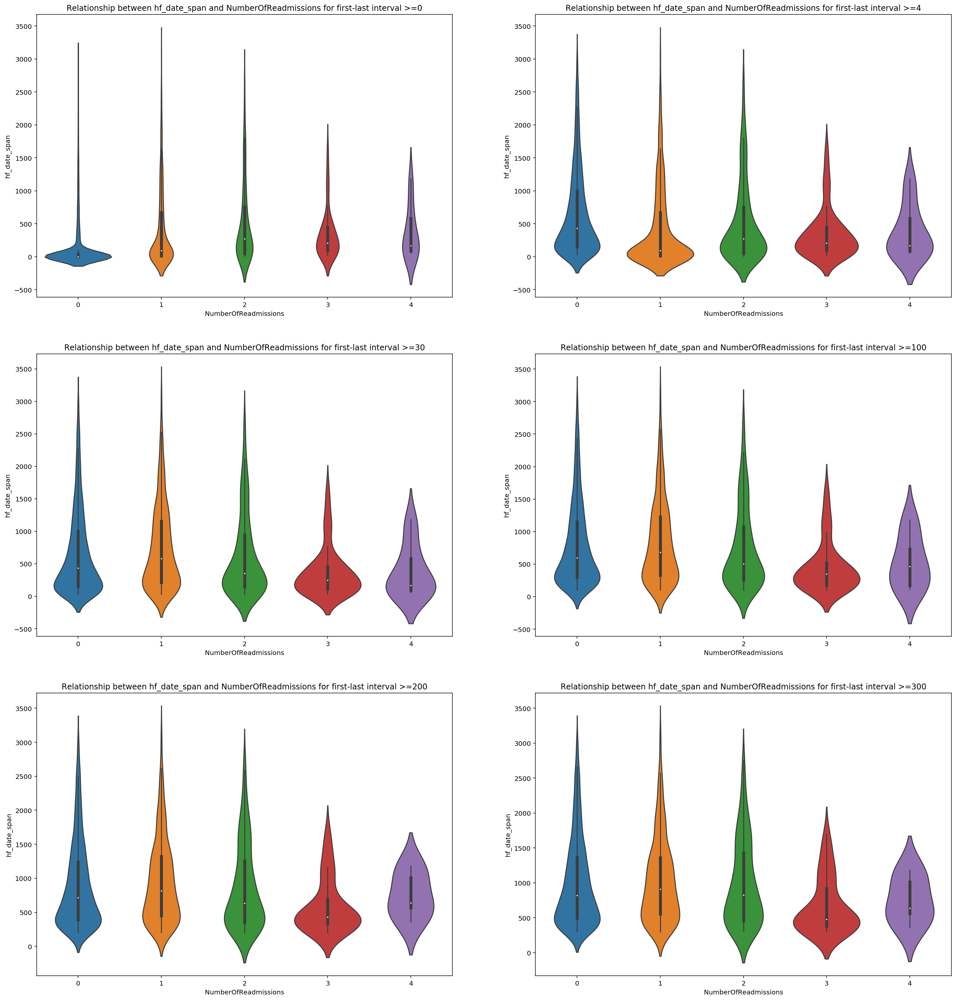

In [480]:
fig = plt.figure(figsize=(25,65))
time_span_list = [0,4,30,100,200,300]
for i,interval in enumerate(time_span_list):
    ax = fig.add_subplot(7, 2, i+1)
    seaborn.violinplot(x='NumberOfReadmissions',y='hf_date_span', data=data_df[data_df['hf_date_span']>=interval][['hf_date_span', 'NumberOfReadmissions']], 
                       order=[0,1,2,3,4])
    ax.set_title('Relationship between hf_date_span and NumberOfReadmissions for first-last interval >='+str(interval))

## 5.3 Interval between Diagnosis and the First Visit/Hospitalization 

In [402]:
data_df['diag_hp1_interval']=data_df['diag_date']-data_df['hf_hosp_date1']
data_df['diag_hp1_interval'].describe()

count                      10763
mean      2 days 08:18:30.471058
std      11 days 09:11:42.777844
min            -7 days +00:00:00
25%              0 days 00:00:00
50%              1 days 00:00:00
75%              3 days 00:00:00
max            830 days 00:00:00
Name: diag_hp1_interval, dtype: object

In [404]:
data_df['diag_hp1_interval'].sort_values(ascending = False)

2732    830 days
3140    491 days
7418    413 days
6387    261 days
7585    129 days
2640    114 days
4527    104 days
2886     73 days
9315     72 days
7507     68 days
10039    68 days
3826     67 days
1784     66 days
4969     57 days
5536     55 days
3498     52 days
9817     51 days
8037     48 days
4614     48 days
3040     47 days
6510     45 days
2784     44 days
6399     44 days
4474     42 days
1808     41 days
6432     41 days
1248     41 days
6180     39 days
3238     38 days
655      37 days
          ...   
10349    -3 days
6239     -3 days
5229     -3 days
9392     -3 days
8679     -3 days
3275     -3 days
7456     -3 days
5420     -3 days
4479     -3 days
8502     -3 days
8638     -3 days
9639     -3 days
9195     -3 days
5258     -3 days
5403     -3 days
8615     -3 days
9483     -3 days
7795     -3 days
3119     -3 days
5634     -3 days
540      -4 days
6209     -4 days
5986     -4 days
1543     -4 days
3975     -4 days
621      -5 days
7559     -5 days
5429     -5 da

In [413]:
data_df['diag_hp1_interval']=data_df['diag_hp1_interval'].astype('timedelta64[D]').astype(int) 

In [414]:
data_df['diag_hp1_interval'].value_counts()

 0      4397
 1      2353
 2       984
 3       693
 4       566
 5       317
 6       286
 7       207
-1       165
 8       132
 9       107
 10       74
 11       60
 13       49
 12       48
-2        39
 15       38
-3        32
 14       32
 17       21
 19       18
 16       17
 18       16
 20       14
 21       10
 31        7
 25        7
 22        6
 26        5
-4         5
        ... 
 48        2
 68        2
 44        2
 30        2
 33        1
 57        1
 73        1
 129       1
 72        1
 104       1
-7         1
 55        1
-6         1
 42        1
 39        1
 830       1
 38        1
 413       1
 261       1
 45        1
 37        1
 29        1
 52        1
 36        1
 47        1
 67        1
 51        1
 114       1
 66        1
 491       1
Name: diag_hp1_interval, Length: 67, dtype: int64

In [415]:
data_df['diag_hp1_interval'].value_counts().describe()

count      67.000000
mean      160.641791
std       618.061920
min         1.000000
25%         1.000000
50%         3.000000
75%        35.000000
max      4397.000000
Name: diag_hp1_interval, dtype: float64

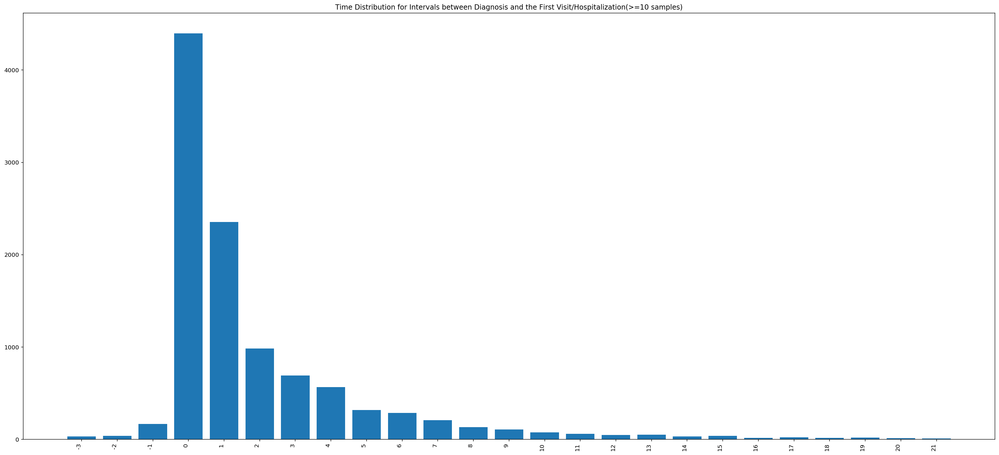

In [418]:
diag_hp1_10 = data_df['diag_hp1_interval'].value_counts()[data_df['diag_hp1_interval'].value_counts().values >=10]
fig = plt.figure(figsize = (30,15))
plt.bar(diag_hp1_10.index,diag_hp1_10.values,tick_label=diag_hp1_10.index)
fig.autofmt_xdate(rotation = 90)
plt.title("Time Distribution for Intervals between Diagnosis and the First Visit/Hospitalization(>=10 samples)")
plt.show()

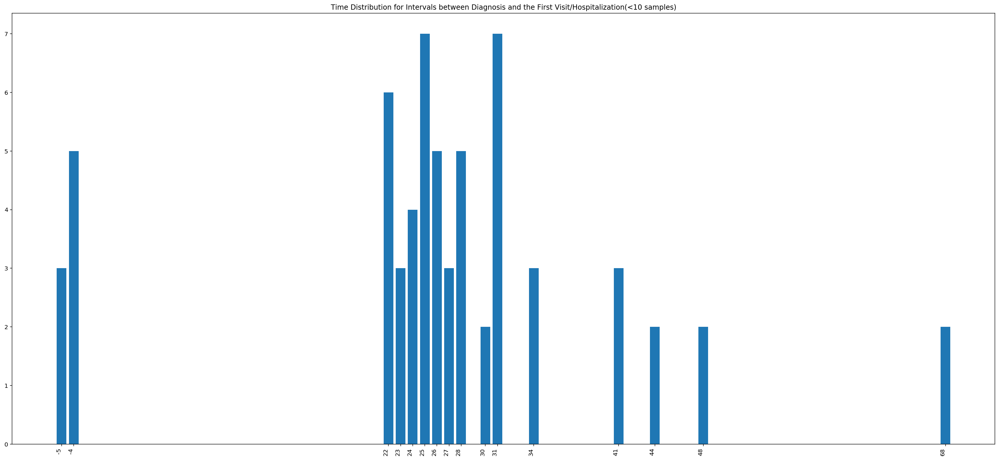

In [420]:
diag_hp1_lessthan_10 = data_df['diag_hp1_interval'].value_counts()[(data_df['diag_hp1_interval'].value_counts().values <10)&(data_df['diag_hp1_interval'].value_counts().values >1)]
fig = plt.figure(figsize = (30,15))
plt.bar(diag_hp1_lessthan_10.index,diag_hp1_lessthan_10.values,tick_label=diag_hp1_lessthan_10.index)
fig.autofmt_xdate(rotation = 90)
plt.title("Time Distribution for Intervals between Diagnosis and the First Visit/Hospitalization(<10 samples)")
plt.show()

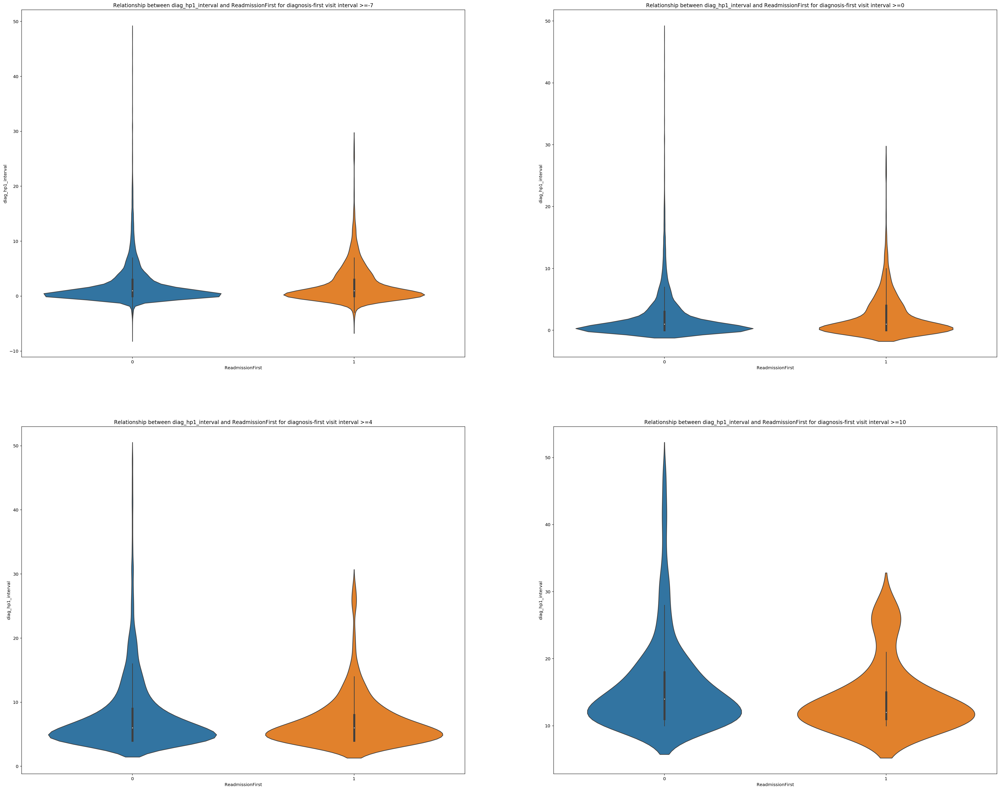

In [431]:
fig = plt.figure(figsize=(40,120))
time_span_list = [-7,0,4,10]
for i,interval in enumerate(time_span_list):
    ax = fig.add_subplot(7, 2, i+1)
    seaborn.violinplot(x='ReadmissionFirst',y='diag_hp1_interval', data=data_df[(data_df['diag_hp1_interval']>=interval)&(data_df['diag_hp1_interval']<=50)][['diag_hp1_interval', 'ReadmissionFirst']], 
                       order=[0,1])
    ax.set_title('Relationship between diag_hp1_interval and ReadmissionFirst for diagnosis-first visit interval >='+str(interval))

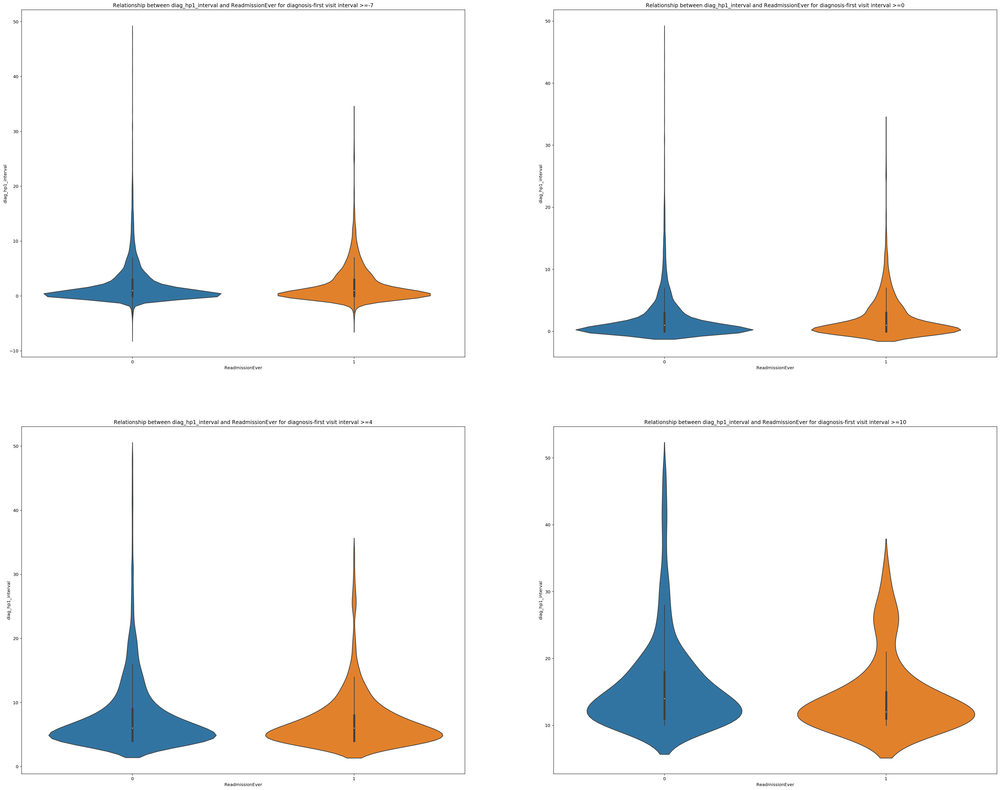

In [433]:
fig = plt.figure(figsize=(40,120))
time_span_list = [-7,0,4,10]
for i,interval in enumerate(time_span_list):
    ax = fig.add_subplot(7, 2, i+1)
    seaborn.violinplot(x='ReadmissionEver',y='diag_hp1_interval', data=data_df[(data_df['diag_hp1_interval']>=interval)&(data_df['diag_hp1_interval']<=50)][['diag_hp1_interval', 'ReadmissionEver']], 
                       order=[0,1])
    ax.set_title('Relationship between diag_hp1_interval and ReadmissionEver for diagnosis-first visit interval >='+str(interval))

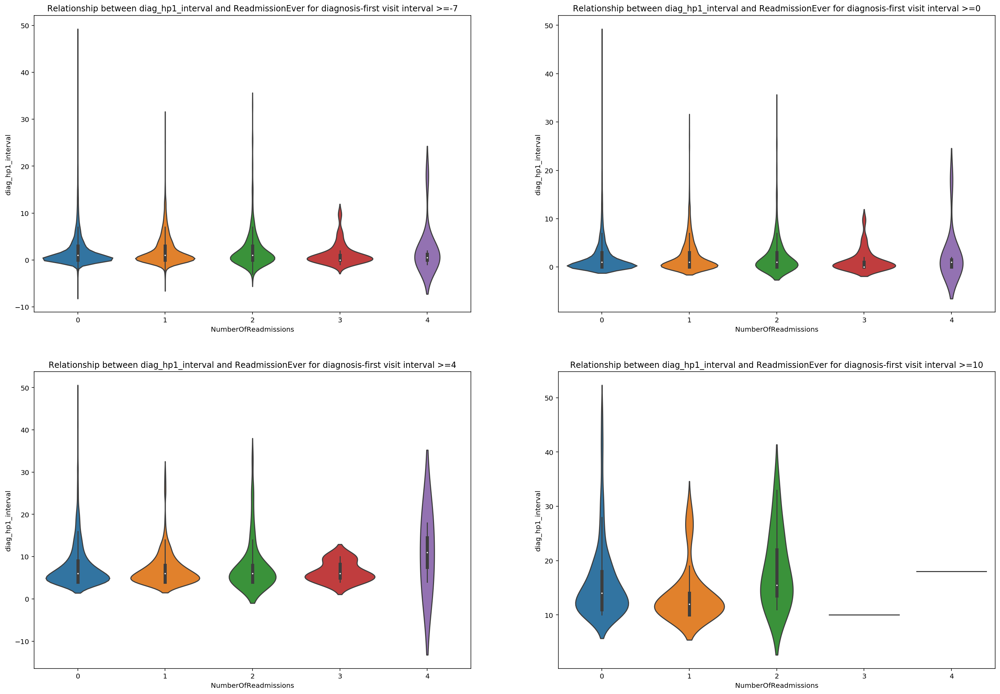

In [481]:
fig = plt.figure(figsize=(25,65))
time_span_list = [-7,0,4,10]
for i,interval in enumerate(time_span_list):
    ax = fig.add_subplot(7, 2, i+1)
    seaborn.violinplot(x='NumberOfReadmissions',y='diag_hp1_interval', data=data_df[(data_df['diag_hp1_interval']>=interval)&(data_df['diag_hp1_interval']<=50)][['diag_hp1_interval', 'NumberOfReadmissions']], 
                       order=[0,1,2,3,4])
    ax.set_title('Relationship between diag_hp1_interval and ReadmissionEver for diagnosis-first visit interval >='+str(interval))

In [451]:
readmission_useful_features = list(readmission_useful_features) + ['diag_hp1_interval','hf_date_span']
len(readmission_useful_features)
#data_df_readmission_time_spans = data_df[readmission_useful_features]

143

In [452]:
data_df_readmission_time_spans.shape

(10763, 143)

In [454]:
nan_count_readmission=data_df_readmission_time_spans.isnull().sum(axis = 0)
nan_count_readmission.sort_values(ascending=False)

hf_date_span                        0
any_SOLID.TUMOR                     0
first.WBC                           0
first.MCV                           0
any_IHD                             0
age                                 0
ECHOFirst_ti_grad                   0
BENZODIAZEPINE.DERIVATIVES          0
first.NEUTRO.abs                    0
ECHOFirst_mv_ea_ratio               0
first.Protein..Blood.total          0
ALPHA.ADRENERGIC.BLOCKING.AGENTS    0
ALDOSTERONE.ANTAGONISTS             0
urine_qty                           0
first.Potassium.Blood               0
ECHOFirst_estimated_rap             0
is_dead                             0
ECHOFirst_lv_mass.1                 0
first.BASO.abs                      0
ALPHA.AND.BETA.BLOCKING.AGENTS      0
first.Osmolality.calc               0
any_RENAL.DIS                       0
first.Iron.Blood                    0
first.Calcium.Blood.total           0
first.Cholesterol.total             0
PLATELET.AGGREGATION.INHIBITORS     0
first.Creati

In [456]:
data_df_readmission_time_spans = data_df_readmission_time_spans.replace(to_replace=['Yes','No'], value=[1,0])
Y_two_features = readmission_features
X_features = set(readmission_useful_features) - readmission_features - {'Patient'}
print('Number of X features: ',len(X_features))
print('Number of Y features: ',len(Y_two_features))

Number of X features:  140
Number of Y features:  2


In [458]:
X_time_spans = data_df_readmission_time_spans[X_features]
Y = data_df_readmission_time_spans[Y_two_features]

In [460]:
X_time_spans.shape

(10763, 140)

In [462]:
Y.shape

(10763, 2)

In [463]:
from sklearn import preprocessing
min_max_scaler = preprocessing.MinMaxScaler()
X_time_spans_norm = min_max_scaler.fit_transform(X_time_spans)
X_time_spans_norm

array([[0.        , 0.        , 0.        , ..., 0.49196787, 0.        ,
        0.15384615],
       [0.        , 0.        , 0.        , ..., 0.55823293, 0.        ,
        0.08717949],
       [0.        , 0.        , 0.        , ..., 0.67871486, 0.        ,
        0.04102564],
       ...,
       [0.        , 0.        , 0.        , ..., 0.25702811, 0.        ,
        0.06666667],
       [0.        , 0.        , 0.        , ..., 0.34738956, 0.        ,
        0.01538462],
       [0.        , 0.        , 0.        , ..., 0.64257028, 0.        ,
        0.38974359]])

In [464]:
# Import PCA
from sklearn.decomposition import PCA

## project from 140 to 2 dimensions using PCA
pca = PCA(2).fit(X_time_spans_norm)
projected_X = pca.fit_transform(X_time_spans_norm)

print(X_time_spans_norm.shape)
print(projected_X.shape)


(10763, 140)
(10763, 2)


Text(0.5, 1.0, 'Cumulative Explained Variance')

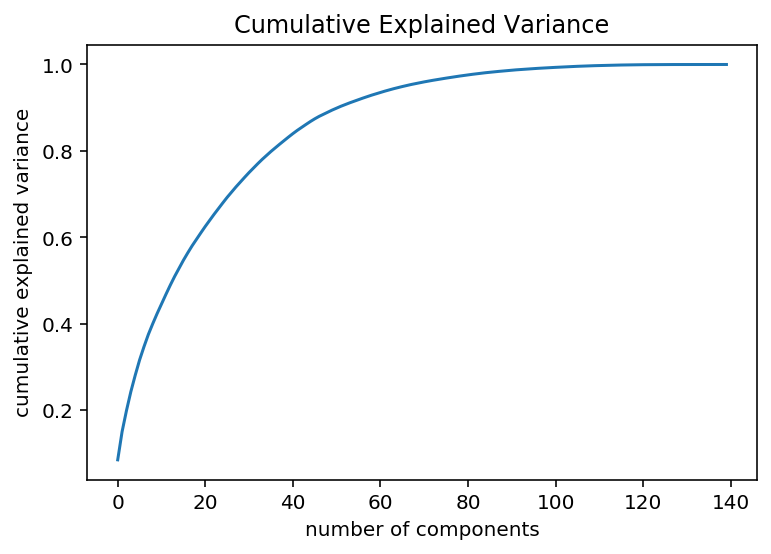

In [465]:
pca = PCA(140).fit(X_time_spans_norm)
plt.plot(np.cumsum(pca.explained_variance_ratio_))


plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.title('Cumulative Explained Variance')



In [468]:
pca_60= PCA(60).fit(X_time_spans_norm)
print('Cumulative explained variance ratio: ',np.sum(pca_60.explained_variance_ratio_),'\n')
print('60 Single dimension explained variance ratio:',pca_60.explained_variance_ratio_,'\n')
abs_original_var_weight = np.abs(pca_60.components_)
# print(abs_original_var_weight.shape)
print('Projection scaler matrix:',pca_60.components_)
print(pca_60.components_.shape)

X_labels = X_time_spans.columns.values.tolist()
abs_original_var_weight_0 = np.abs(pca_60.components_[0])
desc_ranked_var_weight_0 = np.argsort( -abs_original_var_weight_0)
for index,rank in enumerate(desc_ranked_var_weight_0):
    print(index+1,'.',X_labels[rank],':',pca_60.components_[0,rank])

Cumulative explained variance ratio:  0.932164183382827 

60 Single dimension explained variance ratio: [0.08522235 0.06520185 0.04873117 0.04379153 0.03807293 0.03542438
 0.03055993 0.02839754 0.02479109 0.02349648 0.02228604 0.02191557
 0.02141686 0.02030941 0.0188384  0.01851766 0.01721716 0.01641852
 0.01513437 0.01498793 0.01470621 0.01403319 0.0138266  0.01334544
 0.01314762 0.01292546 0.01212633 0.01185613 0.01128523 0.0111562
 0.01092619 0.01039794 0.01018918 0.00985748 0.00931175 0.00897832
 0.00859293 0.00835934 0.00824235 0.00813103 0.00792467 0.0074876
 0.00702636 0.00678859 0.00670054 0.00624923 0.00566401 0.00496803
 0.00490846 0.00482962 0.00446988 0.00433958 0.0040091  0.00385298
 0.00371109 0.00361966 0.00355266 0.0035268  0.00326467 0.00314457] 

Projection scaler matrix: [[ 0.06311774  0.05233189  0.06627099 ... -0.00572837  0.03456296
  -0.0078734 ]
 [ 0.13847742  0.06441981  0.12334124 ...  0.02867868  0.00541199
  -0.00919651]
 [ 0.34491017 -0.06599176  0.12716325

In [469]:
pca_60_sum_components = np.sum(pca_60.components_,axis = 0)
abs_original_var_weight_60 = np.abs(pca_60_sum_components)
desc_ranked_var_weight_60 = np.argsort( -abs_original_var_weight_60)
for index,rank in enumerate(desc_ranked_var_weight_60):
    print(index+1,'.',X_labels[rank],':',pca_60_sum_components[rank])

1 . any_CABG : 2.364377645508465
2 . ANTIARRHYTHMICS..CLASS.IC : 1.9899337258382483
3 . ALPHA.ADRENERGIC.BLOCKING.AGENTS : 1.9496534919282458
4 . GLUCOCORTICOIDS : 1.7053647052985212
5 . any_DYSLIP : -1.6463184675400093
6 . OTHER.ORAL.BLOOD.GLUCOSE.LOWERING.AGENTS : 1.5650742959761497
7 . SULFONAMIDES : -1.5357760063364838
8 . any_ANEMIA : 1.5140137399148579
9 . THIAZIDES : 1.4768265750302447
10 . first.BASO : 1.4569220221426797
11 . SELECTIVE.BETA.2.ADRENORECEPTOR.AGONISTS : 1.4497069764589312
12 . ECHOFirst_estimated_rap : 1.4085084902990608
13 . SELECTIVE.SEROTONIN.REUPTAKE.INHIBITORS : 1.2881706279260117
14 . ANGIOTENSIN.II.ANTAGONISTS : 1.2731539236600051
15 . CORTICOSTEROIDS : 1.2676672691821451
16 . any_COPD : 1.182253159701581
17 . any_PULM.HTN : 1.1409449437252368
18 . any_A.FIB : 0.996251206040934
19 . is_dead : -0.9949714132759474
20 . any_HTN : -0.9603539894135474
21 . ALDOSTERONE.ANTAGONISTS : 0.9182965286905229
22 . first.HGB : -0.9066976117582871
23 . ECHOFirst_mv_peak_e

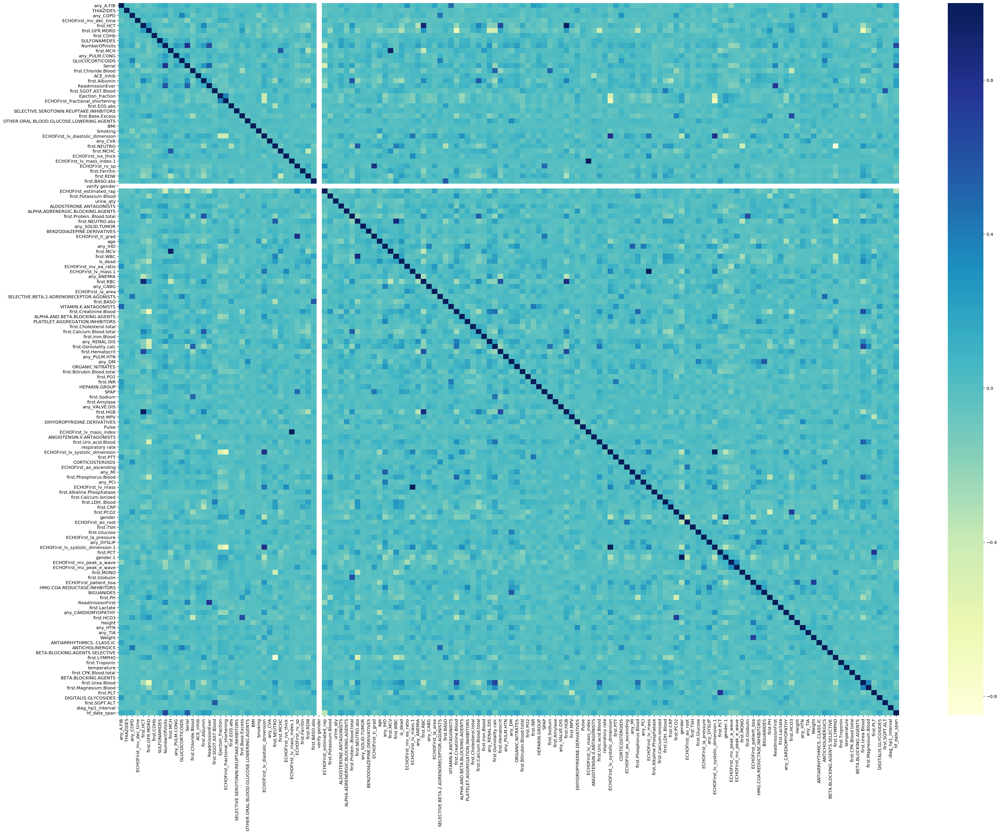

In [473]:
plt.subplots(figsize=(40,30))
seaborn.heatmap(data_df_readmission_time_spans.corr(),cmap="YlGnBu")
plt.show()